This Notebook is made for computing framing lattices and playing with them.

Start by running the 6 first cells that contains `def ` for defining all the necessary functions.
From the 7-th cell on, there are examples.

If you need more context about the math behind and how to do expecific examples, contact Sergio.

If you nedd more context about the code and how it works, contact Geramain.

---

For defining your directed graph, use `D = DiGraph(...)` as per usual.
Your directed graph shall be: 0) directed, 1) connected, 2) acyclic, 3) have 1 source and 1 sink, 4) edges are labelled from `0` to `D.num_edges()`, 5) vertices are labelled from `0` to `D.num_verts()` *in topoligical order* (i.e. edges are `(i, j, label)` with $i < j$).

If it is not the case, use `auto_labelling(D)`: this checks your DiGraph, and returns a new DiGraph properly labelled (use `auto_labelling(D, verbose=True)` to have the new DiGraph plotted, or have info on what is problematic in your DiGraph).

---

Besides, a *framing* is of the form `F = [f_0, f_1, ..., f_n]` where `f_i = ([...], [...])` is the *frame* at vertex `i`, that is to say a couple of two (oredered) list, the first one being the ordered labels of incoming edges at vertex `i`, and the second one being the ordered labels of outgoing edges at vertex `i`.

---

You might be interested by the following functions (please note that: there are other functions, read and use them as you want / tell me if you want other difficult stuffs to be dealt with / nothing is fully optimized):

* `routes(D)` : list the routes of `D`. A route is couple `(E, V)` where `E` is an ordered list of labels of edges, and `V` an ordered list of vertices (visited by the route).
* `draw_all_routes(D)` : draw all the routes of `D` (please, read edges carefully)
* `flow_polytope(D)` : return the flow polytope of `D`
* `compatibility_graph_of_routes(D, F)` : return a graph where vertices are routes of `D` and edges are between routes that are compatible according to the framing `F`. To spare memory, the returned graph as vertices from `0` to `N = len(routes(D))-1`, where the vertex `i` obviously represents the route `routes(D)[i]`. The clique complex of this graph is the triangulation of `flow_polytope(D)` created from the framing `F`.
* `framing_lattice(D, F)` : return the framing lattice for the DiGraph `D` with framing `F`. Again, the vertex `i` correspond to the route `routes(D)[i]`.
* `dual_graph_of_cliques_of_routes(D, F)` : un-oriented version of the above.
* `oruga(n)`, `oruga_framed(n)` : return the oruga DiGraph on `n` vertices / return the oruga DiGraph and its natural framing.
* `multi_oruga(L)`, `multi_oruga_framed(L)` : return the multi-oruga DiGraph with `L[i]` edges from `i` to `i+1` / return the multi-oruga DiGraph and its natural framing.
* `natural_framing(D)` : return the natural framing on `D`, i.e. the framing where the edge labelled `p` comes before the edge labelled `q` if and only if $p < q$.
* `all_framings_iterator(D)` : yield all the possible framings of `D`. Write `all_framing_lattices(D, verbose=True)` if you want to print the number of framings, and print from time to time some info on how many framings have been yield so far.
* `all_framing_lattices(D)` : retun all possible framing lattices arising from `D` (by going through all possible framings). Write `all_framing_lattices(D, verbose=True)` if you want the posets to be drawn on the go.


___

Authors:

Germain Poullot

Sergio Fernandez de Soto Guerrero

In [1]:
# Utilitaries, do not read

from time import localtime

def time_show():
    return str(localtime()[3]) + 'h' + str(localtime()[4]) + ":"

In [2]:
# Computation of routes / drawing of routes

def partial_routes(D):
    """
    Computes all partial routes in a directed graph D starting from vertex 0.
    
    Args:
        D: A directed graph object where vertices are labeled from 0 to n-1.
    
    Returns:
        PA: A list of lists containing partial routes. Each partial route is represented
        as a tuple (E, V), where E is an ordered list of edge labels and V is an ordered
        list of vertices.
    """
    PA = [[([], [0])]]  # Initialize with an empty route starting at vertex 0
    n = D.num_verts()   # Number of vertices in the graph

    for i in range(1, n):
        L = []
        # Iterate over incoming edges of vertex i
        for e in D.incoming_edges(i):
            # Add new routes by extending each route reaching the start vertex of the edge
            L += [(pa[0] + [e[2]], pa[1] + [i]) for pa in PA[e[0]]]
        PA.append(L)
    
    # Note: E[i] is an edge from V[i] to V[i+1]
    return PA

def routes(D):
    """
    Computes all complete routes in a directed graph D from vertex 0 to the last vertex.
    
    Args:
        D: A directed graph object where vertices are labeled from 0 to n-1 in topological order.
    
    Returns:
        A list of all complete routes from vertex 0 to the last vertex.
    """
    return partial_routes(D)[-1]

def draw_route(D, R, po=None):
    """
    Draws a specific route in a directed graph D.
    
    Args:
        D: A directed graph object.
        R: A route, represented as a tuple (E, V), where E is an ordered list of edge labels
           and V is an ordered list of vertices.
        po: (Optional) Position of the vertices for drawing the graph. If not provided, the
            default position is used.
    
    Returns:
        None
    """
    if po is None:
        # Draw the graph with the edges of route R highlighted in red
        D.plot(edge_labels=True, edge_color='black', edge_colors={'red': [e for e in D.edges() if e[2] in R[0]]}).show()
    else:
        # Draw the graph with specific positions for vertices and the edges of route R highlighted in red
        D.set_pos(po)
        D.plot(pos=po, edge_labels=True, edge_color='black', edge_colors={'red': [e for e in D.edges() if e[2] in R[0]]}).show()
    return None

def draw_all_routes(D):
    """
    Draws all complete routes in a directed graph D.
    
    Args:
        D: A directed graph object.
    
    Returns:
        None
    """
    # Save the position of vertices to keep consistency between drawings
    D.plot(edge_labels=True, save_pos=True)
    po = D.get_pos()  # Get the saved position of vertices
    D.set_pos(po)

    # Draw each complete route with the corresponding edges highlighted in red
    for R in routes(D):
        D.plot(edge_labels=True, edge_color='black', edge_colors={'red': [e for e in D.edges() if e[2] in R[0]]}).show()
    return None

In [3]:
#Flow polytope

def flow_polytope(D):
    """
    Computes the flow polytope of a directed graph D.
    Math notes:
    The flow polytope lives in a vector space of dimension #Edges.
    The indicator vector are vector such that if a route has the edge e_i,
    then we put a 1 in the i-th entry, and 0 otherwise.
    
    Args:
        D: A directed graph object.
    
    Returns:
        A Polyhedron object representing the flow polytope. The vertices of the polytope
        are {0,1}-vectors indicating the presence or absence of each edge in a route.
    """
    m = D.num_edges()  # Number of edges in the graph
    return Polyhedron(vertices=[ [int(i in R[0]) for i in range(m)] for R in routes(D)])


In [4]:
# Compatibility criterion / compatibility graph / framing lattice

def common_sub_routes(D, R1, R2):
    """
    Finds common sub-routes between two routes R1 and R2 in a directed graph D. 
    It comapres the edges in two routes and find the shared sub-route. 
    Also founds the shared vertices in the routes.
    
    Args:
        D: A directed graph object.
        R1: A route represented as a tuple (E1, V1), where E1 is a list of edge labels 
            and V1 is a list of vertices.
        R2: A route represented as a tuple (E2, V2), where E2 is a list of edge labels 
            and V2 is a list of vertices.
    
    Returns:
        E: A list of common sub-routes in terms of edges.
        V: A list of common sub-routes in terms of vertices.
    """
    E1, V1 = R1
    E2, V2 = R2
    ED = list(D.edges())
    ED.sort(key=lambda e:e[2])
    b = False
    V, E = [], []
    for e in E1:
        if e in E2:
            if not b:
                X, Xv = [], [ED[e][0]]
                b = True
            X.append(e)
            Xv.append(ED[e][1])
        else:
            if b:
                E.append(X)
                V.append(Xv)
                b = False
    V += [[v] for v in V1 if v in V2 and all(not v in W for W in V)]
    return E, V
    

def are_compatible_routes(D, F, R1, R2, give_conflict=False):
    """
    Checks if two routes R1 and R2 are compatible based on a given framing F.
    
    Math notes:
    Two routes are compatibles if the never have a `cross' in the graph,
    If `v' is the first shared vertex and `w' the last one, v and w are inner vertex, 
    then R1 enters at `v' above/below the route R2, and then R1 leaves at `w' 
    above/below R2, respectively, according to the orderer in the framing F.
    
    Args:
        D: A directed graph object.
        F: A framing structure containing positional indices of incoming and outgoing edges.
        R1: A route represented as a tuple (E1, V1), where E1 is a list of edge labels 
            and V1 is a list of vertices.
        R2: A route represented as a tuple (E2, V2), where E2 is a list of edge labels 
            and V2 is a list of vertices.
    
    Returns:
        True if the routes are compatible, otherwise False.
    """
    n = D.num_verts()
    E, V = common_sub_routes(D, R1, R2)
    for Xv in V:
        u, v = Xv[0], Xv[-1]
        if u != 0 and v != n-1:
            i1, i2 = R1[1].index(u), R2[1].index(u)
            in1, in2 = R1[0][i1-1], R2[0][i2-1]
            j1, j2 = R1[1].index(v), R2[1].index(v)
            out1, out2 = R1[0][j1], R2[0][j2]
            if (F[u][0].index(in1) - F[u][0].index(in2))*(F[v][1].index(out1) - F[v][1].index(out2)) < 0:
                if give_conflict:
                    return Xv
                return False
    return True    

def compatibility_graph_of_routes(D, F):
    """
    Constructs a compatibility graph of routes for a given directed graph D and framing F.
    
    Args:
        D: A directed graph object.
        F: A framing structure containing positional indices of incoming and outgoing edges.
    
    Returns:
        A graph where nodes represent routes and edges indicate compatibility between routes.
    """
    G = Graph()
    RR = routes(D)
    for i, j in Subsets(range(len(RR)), 2):
        if are_compatible_routes(D, F, RR[i], RR[j]):
            G.add_edge((i, j))
    return G

def cliques_of_routes_iterator(D, F):
    """
    An iterator that yields cliques of compatible routes in a directed graph D.

    Math notes:
    A clique is a collection of pairwise compatible routes.
    
    Args:
        D: A directed graph object.
        F: A framing structure containing positional indices of incoming and outgoing edges.
    
    Yields:
        Lists of routes that form cliques in the compatibility graph.
    """
    RR = routes(D)
    G = compatibility_graph_of_routes(D, F)
    for C in G.all_cliques():
        yield [RR[i] for i in C]
    return None

def dual_graph_max_cliques(CC):
    """
    Constructs the dual graph of maximal cliques.
    
    Args:
        CC: A list of cliques, where each clique is a list of routes.
    
    Returns:
        A graph where nodes represent cliques and edges indicate that the cliques share all
        but one route.
    """

    if len(CC) == 0:
        return Graph()
    DuG = Graph()
    DuG.add_vertex(0)
    d = len(CC[0])
    for i, j in Subsets(range(len(CC)), 2):
        if sum(1 for R in CC[i] if R in CC[j]) == d - 1:
            DuG.add_edge(i, j)
    return DuG

def dual_graph_of_cliques_of_routes(D, F):
    """
    Constructs the dual graph of cliques of routes for a directed graph D and framing F.
    
    Args:
        D: A directed graph object.
        F: A framing structure containing positional indices of incoming and outgoing edges.
    
    Returns:
        The dual graph of maximal cliques of routes.
    """
    return dual_graph_max_cliques(list(cliques_of_routes_iterator(D, F)))

def framing_lattice(D, F):
    """
    Constructs the oriented dual graph (framing lattice) of cliques of routes for a directed graph D.
    
    Math notes:
    The orientation use something called clowwise covering, check the paper,
    is dificult to explain here haha
    
    Args:
        D: A directed graph object.
        F: A framing structure containing positional indices of incoming and outgoing edges.
    
    Returns:
        A poset representing the oriented dual graph of cliques of routes.
    """

    CC = list(cliques_of_routes_iterator(D, F))
    n = D.num_verts()
    if len(CC) == 0:
        return DiGraph()
    RR = routes(D)
    DuG = DiGraph()
    DuG.add_vertex(0)
    d = len(CC[0])
    for i, j in Subsets(range(len(CC)), 2):
        if sum(1 for R in CC[i] if R in CC[j]) == d - 1:
            for R in CC[i]:
                if not R in CC[j]:
                    R1 = (list(R[0]), list(R[1]))
                    break
            for R in CC[j]:
                if not R in CC[i]:
                    R2 = (list(R[0]), list(R[1]))
                    break
            E, V = common_sub_routes(D, R1, R2)
            for Xv in V:
                u, v = Xv[0], Xv[-1]
                if u != 0 and v != n-1:
                    i1, i2 = R1[1].index(u), R2[1].index(u)
                    in1, in2 = R1[0][i1-1], R2[0][i2-1]
                    j1, j2 = R1[1].index(v), R2[1].index(v)
                    out1, out2 = R1[0][j1], R2[0][j2]
                    if (F[u][0].index(in1) - F[u][0].index(in2))*(F[v][1].index(out1) - F[v][1].index(out2)) < 0:
                        if F[u][0].index(in1) <= F[u][0].index(in2):
                            DuG.add_edge(j, i)
                        else:
                            DuG.add_edge(i, j)
                        break
    return Poset(DuG)

In [5]:
# Basic examples (oruga, multi-oruga) / auto-labelling / natural framing, all framings

def oruga(n):
    """
    Creates a directed graph called 'oruga' with n+1 vertices.
    
    Args:
        n: Number of vertices in the graph.
    
    Returns:
        A directed graph with two edges between consecutive vertices.
    """
    D = DiGraph()
    D.allow_multiple_edges(True)
    for i in range(n-1):
        D.add_edges([(i, i+1, 2*i), (i, i+1, 2*i+1)])
    return D

def multi_oruga(L):
    """
    Creates a directed graph representing a 'multi-oruga' with a given list of segment lengths.
    
    Args:
        L: A list where each element represents the number of parallel edges between consecutive vertices.
    
    Returns:
        A directed graph with L_i edges between the vertex v_i and v_{i+1}.
    """
    D = DiGraph()
    D.allow_multiple_edges(True)
    c, i = 0, 0
    for k in L:
        for _ in range(k):
            D.add_edge((i, i+1, c))
            c += 1
        i += 1
    return D

def auto_edge_labelling(d):
    """
    Automatically labels the edges of a given directed graph d.
    
    Args:
        d: A directed graph object.
    
    Returns:
        A directed graph with edges labelled sequentially.
    """
    m = 0
    D = DiGraph()
    D.allow_multiple_edges(True)
    for (x, y, _) in d.edges():
        D.add_edge((x, y, m))
        m += 1
    return D

def auto_labelling(D, verbose=False):
    if D.is_connected() and set(D.vertices()) == set(range(D.num_verts())) and D.is_directed_acyclic() and len(D.sources()) == 1 and len(D.sinks()) == 1:
        to = D.topological_sort()
        d = DiGraph(D)
        d.relabel({to[k] : k for k in d.vertices()})
        d = auto_edge_labelling(d)
        if verbose:
            d.show()
        return d
    else:
        if verbose:
            print("Your DiGraph:")
            if not D.is_connected():
                print("is not connected")
            if not D.is_directed_acyclic():
                print("is not acyclic")
            if not len(D.sources()) == 1:
                print("has too many sources")
            if not len(D.sinks()) == 1:
                print("has too many sinks")
        return None

def automatic_framing(D):
    """
    Creates a automatic framing for a directed graph D.

    Math notes:
    This framing is the one that you get from
    the labelling of the edges of D: an edge is greater in
    the framing iff the label of the edge is greater.
    
    Args:
        D: A directed graph object.
    
    Returns:
        A list of tuples where each tuple contains sorted lists of incoming
        and outgoing edge labels for each vertex.
    """
    F = []
    for v in range(D.num_verts()):
        Lin, Lout = [e[2] for e in D.incoming_edges(v)], [e[2] for e in D.outgoing_edges(v)]
        Lin.sort()
        Lout.sort()
        F.append((Lin, Lout))
    return F

def add_edge_in_automatic_framing(new_e, D, F=None):
    L = [e[2] for e in D.edges()]
    L.append(new_e[2])
    L.sort()
    
    nD = DiGraph()
    nD.allow_multiple_edges(True)
    for e in D.edges():
        nD.add_edge((e[0], e[1], L.index(e[2])))
    nD.add_edge((new_e[0], new_e[1], L.index(new_e[2])))
    # nD.show(edge_labels=True)
    
    return nD, automatic_framing(nD)

def add_edges_in_automatic_framing(new_E, D, F=None):
    L = [e[2] for e in D.edges()]
    for new_e in new_E:
        L.append(new_e[2])
    L.sort()
    
    nD = DiGraph()
    nD.allow_multiple_edges(True)
    for e in D.edges():
        nD.add_edge((e[0], e[1], L.index(e[2])))
    for new_e in new_E:
        nD.add_edge((new_e[0], new_e[1], L.index(new_e[2])))
    # nD.show(edge_labels=True)
    
    return nD, automatic_framing(nD)

def delete_edge_in_automatic_framing(old_e, D, F=None):
    L = [e[2] for e in D.edges() if not e == old_e]
    L.sort()
    
    nD = DiGraph()
    nD.allow_multiple_edges(True)
    for e in D.edges():
        if not e == old_e:
            nD.add_edge((e[0], e[1], L.index(e[2])))
    # nD.show(edge_labels=True)
    
    return nD, automatic_framing(nD)

def delete_edges_in_automatic_framing(old_E, D, F=None):
    L = [e[2] for e in D.edges() if not e in old_E]
    L.sort()
    
    nD = DiGraph()
    nD.allow_multiple_edges(True)
    for e in D.edges():
        if not e in old_E:
            nD.add_edge((e[0], e[1], L.index(e[2])))
    # nD.show(edge_labels=True)
    
    return nD, automatic_framing(nD)

    
def random_framing(D):
    F = []
    for v in range(D.num_verts()):
        F.append((list(Permutations([e[2] for e in D.incoming_edges(v)]).random_element()),
                  list(Permutations([e[2] for e in D.outgoing_edges(v)]).random_element())))
    return F

def all_framings_iterator(D, verbose = False, source_and_sink_not_shuffled=True):
    """
    An iterator that generates all possible framings of a directed graph D.
    
    Args:
        D: A directed graph object.
        verbose: If True, prints progress and diagnostic messages.
    
    Yields:
        All possible framings of the graph D.
    """
    CC = [[Permutations([e[2] for e in D.incoming_edges(0)])([e[2] for e in D.incoming_edges(0)])],
          [Permutations([e[2] for e in D.outgoing_edges(0)])([e[2] for e in D.outgoing_edges(0)])]]
    if not source_and_sink_not_shuffled:
        CC = []
    c = 0
    if verbose:
        total = prod([factorial(len(D.incoming_edges(i))) for i in D.vertices()]) * prod([factorial(len(D.outgoing_edges(i))) for i in D.vertices()])
        if total >= 1000:
            D.show()
            print("number of framings =", total)
            S = {int((total*k)/15) for k in range(16)}
        else:
            S = set()
    for i in range(D.num_verts()):
        if not source_and_sink_not_shuffled or not i in {0, D.num_verts()-1}:
            CC.append(list(Permutations([e[2] for e in D.incoming_edges(i)])))
            CC.append(list(Permutations([e[2] for e in D.outgoing_edges(i)])))
    if source_and_sink_not_shuffled:
        CC.append([Permutations([e[2] for e in D.incoming_edges(D.num_verts()-1)])([e[2] for e in D.incoming_edges(D.num_verts()-1)])])
        CC.append([Permutations([e[2] for e in D.outgoing_edges(D.num_verts()-1)])([e[2] for e in D.outgoing_edges(D.num_verts()-1)])])
    for F in cartesian_product_iterator(CC):
        yield [(F[2*i], F[2*i+1]) for i in range(D.num_verts())]
        c += 1
        if verbose and c in S:
            print(time_show(), c, "framings yield, out of", total)
    return None

def all_framing_lattices_iterator(D, verbose=False, super_verbose=False):
    """
    An iterator that generates all non-isomorphic framing lattices of a directed graph D.
    
    Args:
        D: A directed graph object.
        verbose: If True, prints progress and diagnostic messages.
    
    Yields:
        All non-isomorphic framing lattices of the graph D.
    """
    PP = []
    for F in all_framings_iterator(D, verbose=super_verbose):
        Po = framing_lattice(D, F)
        if all(not Po.is_isomorphic(Q) for Q in PP):
            if verbose:
                Po.show()
                print("For possible framing:")
                print(F)
                #print("Cover relations:")
                #print(Po.cover_relations())
                print()
            yield Po
            PP.append(Po)
    return None

def all_framing_lattices(D, verbose=False, super_verbose=False):
    """List all non-isomorphic framing lattices of `D` (when you go through all framings of `D`)"""
    return list(all_framing_lattices_iterator(D, verbose, super_verbose))

def oruga_framed(n):
    """
    Creates a framed 'oruga' graph with n+1 vertices and its natural framing.
    
    Args:
        n: Number of vertices in the graph.
    
    Returns:
        A tuple containing the 'oruga' graph and its natural framing.
    """
    D = oruga(n)
    return D, automatic_framing(D)

def multi_oruga_framed(L):
    """
    Creates a framed 'multi-oruga' graph and its natural framing.
    
    Args:
        L: A list where each element represents the number of parallel edges between consecutive vertices.
    
    Returns:
        A tuple containing the 'multi-oruga' graph and its natural framing.
    """
    D = multi_oruga(L)
    return D, automatic_framing(D)

In [6]:
def all_arcs(n = 5):
    """Iterator over all arcs on `n` points"""
    for a in range(n):
        for b in range(a+1, n):
            for S in Subsets(range(a+1, b)):
                yield (a, b, S, Set(range(a+1, b)).difference(S))
    return None

def are_non_crossing_arcs(alpha, beta):
    a, b, A, B = alpha
    x, y, X, Y = beta
    return len(A.intersection(Y).union(Set([a, b]).intersection(Y)).union(Set([x, y]).intersection(A))) == 0 or len(B.intersection(X).union(Set([a, b]).intersection(X)).union(Set([x, y]).intersection(B))) == 0 

def is_above_for_arcs(alpha, beta):
    a, b, A, B = alpha
    x, y, X, Y = beta
    return are_non_crossing_arcs(alpha, beta) and len(A.intersection(Y).union(Set([a, b]).intersection(Y)).union(Set([x, y]).intersection(A))) != 0

def is_non_crossing_arc_diagramm(Alpha):
    return all(are_non_crossing_arcs(alpha, beta) for alpha, beta in Subsets(Alpha, 2))

def sort_non_crossing_arc_diagram_bottom_to_top(Alpha):
    PoA = Poset((Set(Alpha), lambda alpha, beta : is_above_for_arcs(beta, alpha)))
    asort = PoA.linear_extension()
    arcs_sort = []
    for alpha in asort:
        arcs_sort += [alpha] * Alpha.count(alpha)
    return arcs_sort

def random_non_crossing_arc_diagram(n = 5, m = -1):
    """
    Return a non-crossing arc diagramm with `m` arcs on `n` vertices.
    Arcs are chosen at random and added 1 by 1 if they are non-crossing with the arcs already chosen
    """
    from random import randint
    
    if m == -1:
        m = n^2
    Alpha = []
    ARCS = list(all_arcs(n))
    lA = len(ARCS)
    while len(Alpha) != m:
        alpha = ARCS[randint(0, lA-1)]
        if all(are_non_crossing_arcs(alpha, beta) for beta in Alpha):
            Alpha.append(alpha)
    
    def sort_func(alpha):
        a, b, A, B = alpha
        Abis = list(A)
        Abis.sort()
        Bbis = list(B)
        Bbis.sort()
        return (a, b, tuple(Abis), tuple(Bbis))
    return sort_non_crossing_arc_diagram_bottom_to_top(Alpha)
    

def arc_ideal_generated_by(Alpha):
    """Return the ideal (for dominance/restriction relation) generated by the list of arc `Alpha` (works also if `Alpha` is just an arc an not given as a list)"""
    if type(Alpha) == tuple:
        L = [Alpha]
    else:
        L = list(Alpha)
    n = max(alpha[1] for alpha in L)
    D = {(a, b) : [] for a in range(n+1) for b in range(a+1, n+1)}
    for a, b, S, U in L:
        for c in range(a, b+1):
            for d in range(c+1, b+1):
                beta = (c, d, S.intersection(set(range(c+1, d))), U.intersection(set(range(c+1, d))))
                if not beta in D[(c, d)]:
                    D[(c, d)].append(beta)
    L = []
    for l in D.values():
        L += l
    return L

def digraph_and_framing_on_non_crossing_arc_diagram(Alpha, already_sorted=False, check=True, verbose=False):
    """
    Return the natural framing of the non crossing arc diagram `Alpha`, that is
    the framing obtained by drawing the arc diagram in the plane and then
    stating that an edge is greater in the framing iff it appears above in the drawing.
    """
    D = DiGraph()
    D.allow_multiple_edges(True)
    if not already_sorted:
        Beta = sort_non_crossing_arc_diagram_bottom_to_top(Alpha)
    else:
        Beta = Alpha
    c = 0
    for alpha in Beta:
        D.add_edge((alpha[0], alpha[1], c))
        c += 1
    if check:
        if D.is_connected() and set(D.vertices()) == set(range(D.num_verts())) and D.is_directed_acyclic() and len(D.sources()) == 1 and len(D.sinks()) == 1:
            if verbose:
                return Beta, D, automatic_framing(D)
            return D, automatic_framing(D)
        else:
            if verbose:
                return None, None
            return None, None
    if verbose:
        return Beta, D, automatic_framing(D)
    return D, automatic_framing(D)

def is_dominating_arc(alpha, beta):
    """Dominance/restriction relation between arcs (return whether `beta` is a restriction of `alpha` or not)"""
    return (alpha[0] <= beta[0]) and (beta[1] <= alpha[1]) and (alpha[2].intersection(set(range(beta[0]+1, beta[1]))) == beta[2])

def arc_dominance_poset(n):
    """Return the poset obtained from the dominance/restriction relation"""
    return Poset(([(a, b, frozenset(S), frozenset(U)) for (a, b, S, U) in all_arcs(n)], lambda alpha, beta : is_dominating_arc(beta, alpha)))

def arc_ideals_poset(n):
    """Return the lattice of (downward) ideals (or down sets) of the dominance poset"""
    arc_Po = arc_dominance_poset(n)
    return arc_Po.order_ideals_lattice()

def intervals_of_set(S):
    if len(S) == 0:
        return []
    L = list(S)
    L.sort()
    I = []
    x0, x1 = L[0], L[0]
    while len(L) != 0:
        y = L.pop(0)
        if y in {x1, x1 + 1}:
            x1 = y
        else:
            I.append((x0, x1))
            x0, x1 = y, y
    I.append((x0, x1))
    return I

def draw_arc(alpha, n = -1, points_style = 'figures', color='blue', label=None):
    """Draw the `arc`: `points_style` shall be `'figures'`, `'dots'` or else (try the options and see)"""
    num_points = max(n, alpha[1])
    a, b = alpha[0], alpha[1]
    
    if points_style == 'figures':
        eps = 0.15
    elif points_style == 'dots':
        eps = 0
    else:
        eps = 0
    
    if b == a+1:
        if label in {None, 1}:
            Q = line(((a+eps, 0), (b-eps, 0)), color = color)
        else:
            Q = line(((a+eps, 0), (b-eps, 0)), color = color) + text(str(label), ((a+b)/2, 0.07), color = 'red', fontsize="small")
    else:
        L = intervals_of_set(alpha[2])
        M = []
        if L == []:
            arc_parameters = [{'center': ((a + b)/2, 0), 'r1': (b - a)/2, 'sector': (-pi+eps, -eps), 'color': color}]
        elif L == [(a+1, b-1)]:
            arc_parameters = [{'center': ((a + b)/2, 0), 'r1': (b - a)/2, 'sector': (eps, pi-eps), 'color': color}]
        else:
            if L[0][0] != a+1:
                M.append(((a, L[0][0]-0.5), (-pi+eps, 0)))
                start = 0
            else:
                M.append(((a, L[0][1]+0.5), (0, pi-eps)))
                start = 1

            for ind in range(len(L)-1):
                x, y = L[ind]
                z = L[ind+1][0]
                if ind >= start:
                    M.append(((x-0.5, y+0.5), (0, pi)))
                M.append(((y+0.5, z-0.5), (-pi, 0)))

            if L[-1][1] != b-1:
                if L[-1][0] != a+1:
                    M.append(((L[-1][0]-0.5, L[-1][1]+0.5), (0, pi)))
                M.append(((L[-1][1]+0.5, b), (-pi, -eps)))
            else:
                M.append(((L[-1][0]-0.5, b), (eps, pi)))

            arc_parameters = []
        for (xy, sect) in M:
            arc_parameters.append({'center': ((xy[0] + xy[1])/2, 0), 'r1': (xy[1] - xy[0])/2, 'sector': sect, 'color': color})
        Q = sum( arc(**param) for param in arc_parameters )
        if not label in {None, 1}:
            if L == []:
                Q += text(str(label), ((a + b)/2, -(b - a)/2 +0.07), color = 'red', fontsize="small")
            elif L == [(a+1, b-1)]:
                Q += text(str(label), ((a + b)/2, (b - a)/2 +0.07), color = 'red', fontsize="small")
            elif L[0][0] != a+1:
                Q += text(str(label), ((a + L[0][0]-0.5)/2, -(L[0][0]-0.5-a)/2 +0.07), color = 'red', fontsize="small")
            else:
                Q += text(str(label), ((a + L[0][1]+0.5)/2, (L[0][1]+0.5-a)/2 +0.07), color = 'red', fontsize="small")
    if points_style == 'figures':
        Q += sum(text(str(k), (k, 0), color = 'black') for k in range(num_points+1))
    elif points_style == 'dots':
        Q += sum(point((k, 0), color = 'black') for k in range(num_points+1))
    return Q

def draw_arc_diagram(Alpha, points_style = 'figures', color = 'blue'):
    """Draw all the arcs in the list `Alpha`"""
    d = {alpha : Alpha.count(alpha) for alpha in Set(Alpha)}
    return sum( draw_arc(alpha, points_style = points_style, color = color, label=d[alpha]) for alpha in d )

def draw_all_routes_non_crossing_arc_diagram(Alpha, already_sorted=False):
    """Draw all routes from top to bottom"""
    Be, D, F = digraph_and_framing_on_non_crossing_arc_diagram(Alpha, already_sorted=already_sorted, verbose=True)
    RR = routes(D)
    if already_sorted:
        RR.sort(key=lambda R : R[0])
    else:
        PoRR = Poset(([(tuple(x), tuple(y)) for x, y in RR], lambda R1, R2 : is_above(D, F, R1, R2))).dual()
        RR = PoRR.linear_extension()
    for R in RR:
        Beta = [Be[i] for i in R[0]]
        (draw_arc_diagram(Alpha) + draw_arc_diagram(Beta, color='red')).show(axes=False)
    return None

def is_above(D, F, R1, R2):
    n = D.num_verts()
    for v in D.vertices():
        if v in R1[1] and v in R2[1]:
            if v != 0:
                i1, i2 = R1[1].index(v), R2[1].index(v)
                in1, in2 = R1[0][i1-1], R2[0][i2-1]
                if F[v][0].index(in1) <= F[v][0].index(in2):
                    return False
            if v != n-1:
                j1, j2 = R1[1].index(v), R2[1].index(v)
                out1, out2 = R1[0][j1], R2[0][j2]
                if F[v][1].index(out1) <= F[v][1].index(out2):
                    return False
    return True

In [7]:
def caracol(n):
    Alpha = []
    for i in range(n-1):
        Alpha.append((i, i+1, Set(), Set()))
    for i in range(2, n-1):
        Alpha.append((0, i, Set(range(1, i)), Set()))
    for i in range(1, n-2):
        Alpha.append((i, n-1, Set(), Set(range(i+1, n-1))))
    return Alpha

def caracol_framed(n, framing_style='asso'):
    D, F = digraph_and_framing_on_non_crossing_arc_diagram(caracol(n))
    if 'asso' in framing_style or 'leng' in framing_style:
        for i in range(1, n):
            F[i][1].reverse()
        return D, F
    else:
        return D, F
    
def caracol_v2(n):
    D = DiGraph()
    D.allow_multiple_edges(True)
    for i in range(n-1):
        D.add_edge((i, i+1, i))
    for i in range(1, n-1):
        D.add_edge((0, i, n-2 + i))
    for i in range(1, n-1):
        D.add_edge((i, n-1, 3*n-5 -i))
    
    return D

def caracol_framed_v2(n):
    D = caracol_v2(n)
    return D, automatic_framing(D)
    
def s_caracol(s):
    n = len(s)
    Alpha = []
    for i in range(n+1):
        Alpha.append((i, i+1, Set(), Set()))
    for i in range(2, n+2):
        for _ in range(s[n - i + 1]):
            Alpha.append((0, i, Set(range(1, i)), Set()))
    for i in range(1, n+1):
        Alpha.append((i, n+1, Set(), Set(range(i+1, n+1))))
    return Alpha

def s_caracol_framed(s, framing_style='asso'):
    n = len(s)
    D, F = digraph_and_framing_on_non_crossing_arc_diagram(s_caracol(s))
    if 'asso' in framing_style or 'leng' in framing_style:
        for i in range(1, n+1):
            F[i][1].reverse()
        return D, F
    else:
        return D, F

def s_oruga(s):
    n = len(s)
    Alpha = []
    Alpha.append((0, 1, Set(), Set()))
    for i in range(1, n+1):
        Alpha.append((i, i+1, Set(), Set()))
        Alpha.append((i, i+1, Set(), Set()))
    for i in range(2, n+2):
        for _ in range(s[n - i + 1] - 1):
            Alpha.append((0, i, Set(range(1, i)), Set()))
    return Alpha

def s_oruga_framed(s, framing_style='weak'):
    n = len(s)
    D, F = digraph_and_framing_on_non_crossing_arc_diagram(s_oruga(s))
    if 'weak' in framing_style or 'perm' in framing_style:
        for i in range(2, n+2):
            x = F[i][0].pop(1)
            F[i][0].append(x)
        return D, F
    else:
        return D, F

def Pitman_Stanley(n):
    Alpha = []
    for i in range(n-1):
        Alpha.append((i, i+1, Set(), Set()))
    for i in range(0, n-1):
        Alpha.append((i, n-1, Set(), Set(range(i+1, n))))
    return Alpha

def Pitman_Stanley_framed(n):
    return digraph_and_framing_on_non_crossing_arc_diagram(Pitman_Stanley(n))

def zig_zag(n):
    Alpha = []
    for i in range(n-1):
        Alpha.append((i, i+1, Set(), Set()))
    for i in range(0, n-2):
        if i % 2 == 1:
            Alpha.append((i, i+2, Set([i+1]), Set()))
        if i % 2 == 0:
            Alpha.append((i, i+2, Set(), Set([i+1])))
    return Alpha

def zig_zag_framed(n):
    return digraph_and_framing_on_non_crossing_arc_diagram(zig_zag(n))

def bull_eye(n):
    D = DiGraph()
    D.add_edges([(0, i, i-1) for i in range(1, n+1)] + [(i, n+2, n+i-1) for i in range(2, n+1)])
    D.add_edges([(i, i+1, 2*n+i-1) for i in range(1, n)])
    D.add_edge((n, n+1, 3*n-1))
    D.add_edge((1, n+1, n))
    D.add_edge((n+1, n+2, 3*n))
    return D

def bull_eye_framed(n):
    D = bull_eye(n)
    return D, automatic_framing(D)

In [8]:
# Nestohedra

def Delta(X, n):
    return Polyhedron(vertices = [[int(i == j) for i in range(n)] for j in X])

def graphical_tubings_complex(G):
    return [g.vertices() for g in G.connected_subgraph_iterator()]

def nestohedron(H, n = -1):
    if n == -1:
        n = max(max(X) for X in H)
    return sum(Delta(X, n) for X in H)

def graphical_associahedron(G):
    return nestohedron(graphical_tubings_complex(G))

In [9]:
def oriented_cube(n = 3):
    return auto_edge_labelling(DiGraph(posets.BooleanLattice(n).cover_relations()))

In [10]:
def linear_intervals(D, only_endpoints=False):
    C = [[], []]
    for u in D.vertices():
        for v in D.vertices():
            b, c = True, False
            for pa in D.all_paths(u, v):
                l = len(pa)
                c = True
                if not b:
                    c = False
                    break
                b = False
            if c:
                for k in range(l - len(C) + 1):
                    C.append([])
                if only_endpoints:
                    C[l].append((u, v))
                else:
                    C[l].append(tuple(pa))
    return C

def linear_intervals_enumerator(D):
    C = []
    for u in D.vertices():
        for v in D.vertices():
            b, c = True, False
            for pa in D.all_paths(u, v):
                l = len(pa)
                c = True
                if not b:
                    c = False
                    break
                b = False
            if c:
                C += [0] * (l - len(C) + 1)
                C[l] += 1
    return C

def linear_intervals_enumerator_for_digraph_and_framing(D, F):
    return linear_intervals_enumerator( DiGraph(framing_lattice(D, F).cover_relations()) )

def framing_lattice_labelled_with_common_subroute_conflict(D, F, verbose=False):
    Po = framing_lattice(D, F)
    CC = list(cliques_of_routes_iterator(D, F))
    Edges = list(D.edges())
    Edges.sort(key=lambda t:t[2])
    G = DiGraph()
    for a, b in Po.cover_relations():
        C1, C2 = CC[a], CC[b]
        for R in C1:
            if not R in C2:
                R1 = R
        for S in C2:
            if not S in C1:
                R2 = S
        Xv = are_compatible_routes(D, F, R1, R2, give_conflict=True)
        G.add_edge((a, b, tuple(Xv)))
    if verbose:
        G.show(edge_labels=True)
    return G

def framing_lattice_labelled_with_exchange_pair(D, F, verbose=False):
    Po = framing_lattice(D, F)
    CC = list(cliques_of_routes_iterator(D, F))
    Edges = list(D.edges())
    Edges.sort(key=lambda t:t[2])
    G = DiGraph()
    for a, b in Po.cover_relations():
        C1, C2 = CC[a], CC[b]
        for R in C1:
            if not R in C2:
                R1 = R
        for S in C2:
            if not S in C1:
                R2 = S
        Xv = are_compatible_routes(D, F, R1, R2, give_conflict=True)
        G.add_edge((a, b, (R1, R2, lower_route(D, F, R1, R2))))
    if verbose:
        G.show(edge_labels=True)
    return G

def linear_intervals_sequences_of_subroutes(D, F, verbose=False):
    G = framing_lattice_labelled_with_common_subroute_conflict(D, F, verbose=verbose)
    M = [[]]
    for L in linear_intervals(G):
        M.append([])
        for li in L:
            M[-1].append((li, [G.edge_label(li[i], li[i+1]) for i in range(len(li)-1)]))
    return M

def lower_route(D, F, R, S):
    """Possible false"""
    """Suppose that unique subroute of conflict + R smaller than S"""
    Xv = are_compatible_routes(D, F, R, S, give_conflict=True)
    p, q = min(Xv), max(Xv)
    i, j = R[1].index(p), S[1].index(q)
    k = R[1].index(q)
    
    VL = R[1][:i] + list(Xv) + S[1][j+1:]  #S puis R
    EL = R[0][:k] + S[0][j:]
    #print(R, S, Xv, i, j, k)
    #print(EL, VL)
    return EL, VL

def is_lower_route(T, R, S):
    """Suppose that unique subroute of conflict + R smaller than S"""
    i = min(i for i in range(min(len(R[0]), len(S[0]))) if R[0][i] != S[0][i])
    return T[0][i] == R[0][i]
    
def linear_intervals_upper_or_lower(D, F, verbose=False):
    G = framing_lattice_labelled_with_exchange_pair(D, F, verbose=verbose)
    M = [[]]
    k = 0
    for L in linear_intervals(G):
        k += 1
        M.append([])
        #print(M)
        for li in L:
            if k >= 4:
                lower = 1
                R, S, T = G.edge_label(li[0], li[1])[0], G.edge_label(li[0], li[1])[1], G.edge_label(li[1], li[2])[0]
                X = (li, ["upper", "lower"][int(is_lower_route(T, R, S))])
                M[-1].append(X)
            else:
                X = (li, "?")
                M[-1].append(X)
        
    return M

In [11]:
def framed_line_graph(G, F, add_artificial_source_and_sink = True):
    L = DiGraph()
    L.allow_multiple_edges(True)
    for v in G.vertices(): # .line_graph() does not handle multiple edges on Sage 9.3
        L.add_edges([(e, f) for e in G.incoming_edges(v) for f in G.outgoing_edges(v)])
    #L.show()
    FL = []
    E = []
    for e1, e2, _ in L.edges():
        E.append((e1[2], e2[2]))
    E.sort()
    V = L.vertices()
    V.sort(key = lambda x : x[2])
    for i, j, lab in V:
        tin, tout = F[i][0], F[j][1]
        FL.append(([E.index((x, lab)) for x in tin], [E.index((lab, y)) for y in tout]))
    L = DiGraph()
    L.allow_multiple_edges(True)
    for i in range(len(E)):
        L.add_edge((E[i][0], E[i][1], i))
    #L.show(edge_labels=True)
    if add_artificial_source_and_sink:
        """This will relabel the edges of G by +1."""
        k = L.num_edges()
        mem_last = ([], [])
        for s in L.sinks():
            L.add_edge((s, G.num_edges(), k))
            mem_last[0].append(k)
            FL[s][1].append(k)
            k += 1
        k = -1
        mem0 = ([], [])
        for s in L.sources():
            L.add_edge((-1, s, k))
            mem0[1].append(k)
            FL[s][0].append(k)
            k -= 1
        m = -k - 1
        M = DiGraph()
        M.allow_multiple_edges(True)
        for a, b, lab in L.edges():
            M.add_edge((a+1, b+1, lab+m))
        FL = [mem0] + FL + [mem_last]
        for i in range(len(FL)):
            FL[i] = ([x + m for x in FL[i][0]], [y + m for y in FL[i][1]])
        return M, FL
    return L, FL

def M_moves(G, F, moves="all"):
    """`moves` is a list of edges of `G`.
    It can be a list of numbers (label of the edges),
    a list of couples (this will remove all edges u -> v),
    or a list of triples (u, v, label).
    If `moves` is not given, then it will remove all the edges."""
    if moves == "all":
        moves = [e for e in G.edges() if e[0] != 0 and e[1] != G.num_verts()-1]
    if type(moves[0]) == type(1):
        def check_in_moves(e):
            return e[2] in moves
        moves_index = list(moves)
    elif len(moves[0]) == 2:
        def check_in_moves(e):
            return (e[0], e[1]) in moves
        moves_index = []
        for a, b in moves:
            moves_index += G.edge_label(a, b)
    else:
        def check_in_moves(e):
            return e in moves
        moves_index = [e[2] for e in moves]
    label_mem = dict()
    M = DiGraph()
    M.allow_multiple_edges(True)
    s, t = G.sources()[0], G.sinks()[0]
    k = G.num_edges()
    for a, b, lab in G.edges():
        if a != s and b != t and check_in_moves((a, b, lab)):
            M.add_edge((a, t, k))
            M.add_edge((s, b, k + 1))
            label_mem[lab] = (k, k+1)
            k += 2
        else:
            M.add_edge((a, b, lab))
    E = list(M.edges())
    E.sort(key = lambda x : x[2])
    Elab = [e[2] for e in E]
    M = DiGraph()
    M.allow_multiple_edges(True)
    M.add_edges([(E[i][0], E[i][1], i) for i in range(len(E))])
    FM = [(list(f[0]), list(f[1])) for f in F]
    FM[0] = ([], [e[2] for e in M.outgoing_edges(s)])
    FM[-1] = ([e[2] for e in M.incoming_edges(t)], [])
    for i in range(1, len(FM)-1):
        A, B = FM[i]
        newA, newB = [], []
        for a in A:
            if a in moves_index:
                newA.append(label_mem[a][1])
            else:
                newA.append(a)
        for b in B:
            if b in moves_index:
                newB.append(label_mem[b][0])
            else:
                newB.append(b)
        FM[i] = ([Elab.index(a) for a in newA], [Elab.index(b) for b in newB])
        
    return M, FM

In [12]:
def test_Clement_conjecture(D):
    return 1 == len(set(tuple(
        linear_intervals_enumerator(DiGraph(P.cover_relations())))
                        for P in all_framing_lattices_iterator(D)))

Multi-digraph on 10 vertices [([], [15, 16, 17, 18, 19, 20, 21, 22]), ([15], [14, 0]), ([14, 16], [2, 1]), ([2, 17], [4, 3]), ([4, 18], [6, 5]), ([6, 19], [8, 7]), ([8, 20], [10, 9]), ([10, 21], [12, 11]), ([12, 22], [13]), ([0, 1, 3, 5, 7, 9, 11, 13], [])]


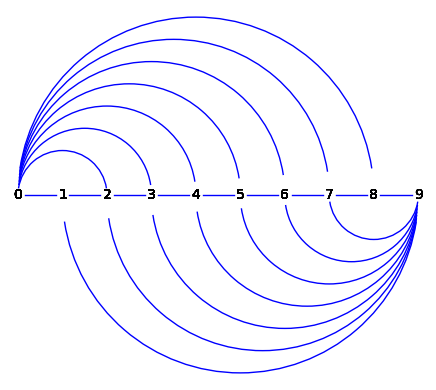

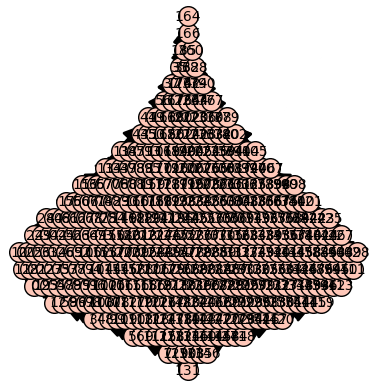

True


In [34]:
n = 10
D, F = caracol_framed(n)
print(D, F)
draw_arc_diagram(caracol(n)).show(axes=False)
#D.show(edge_labels=True)
Po = framing_lattice(D, F)
Po.show()
print(Po.is_isomorphic(posets.TamariLattice(n-3)))

In [13]:
D, F = caracol_framed_v2(4)
CC = list(cliques_of_routes_iterator(D, F))
Uni = universal_routes(D, CC = CC)
Po = framing_lattice(D, F)

print(Uni)
Po.show()

RR = intersection_of_cliques_in_interval(D, 2, 1, F)
print(RR)
print()
print(routes_edges_only_not_universal(RR, Univ = Uni))

for i in range(len(CC)):
    print(i, CC[i])

NameError: name 'universal_routes' is not defined

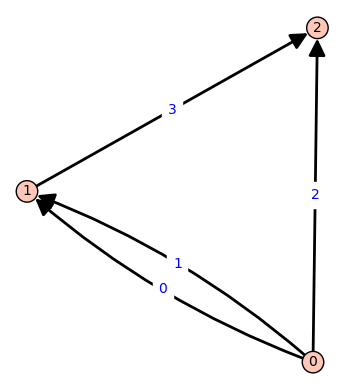

[([], [0, 1, 2]), ([1, 0], [3]), ([2, 3], [])]


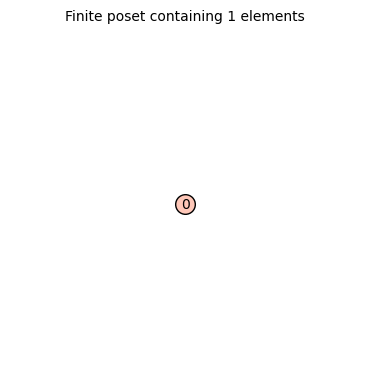

In [21]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edge((0, 1, 0))
D.add_edge((0, 1, 1))
D.add_edge((0, 2, 2))
D.add_edge((1, 2, 3))
D.show(edge_labels=True)

F = automatic_framing(D)
#print(F)
F[1] = ([1, 0], F[1][1])
print(F)

framing_lattice(D, F)

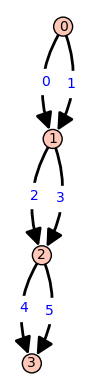

0 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]


/opt/sagemath-9.3/local/lib/python3.7/site-packages/sage/plot/graphics.py:3355: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
  figure.tight_layout()


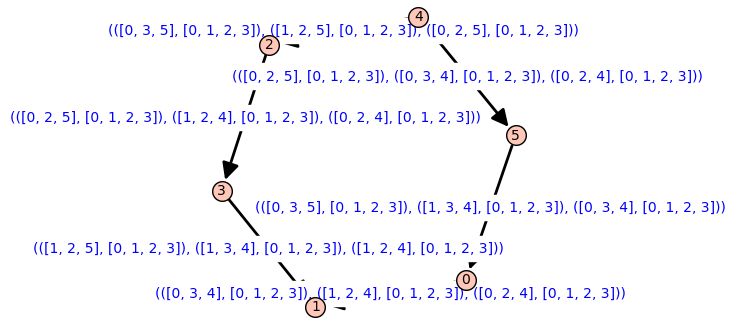

0 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [4, 5]), ([5, 4], [])]


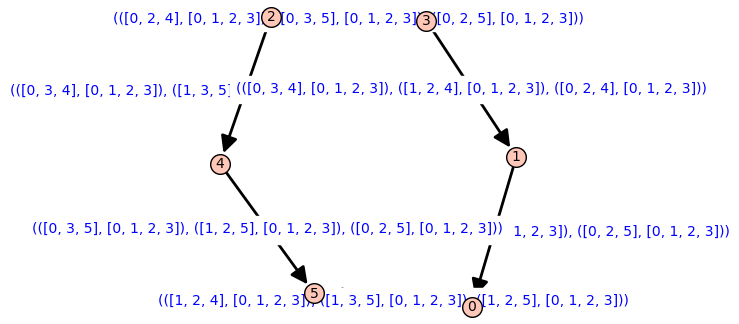

0 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
2 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
5 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]


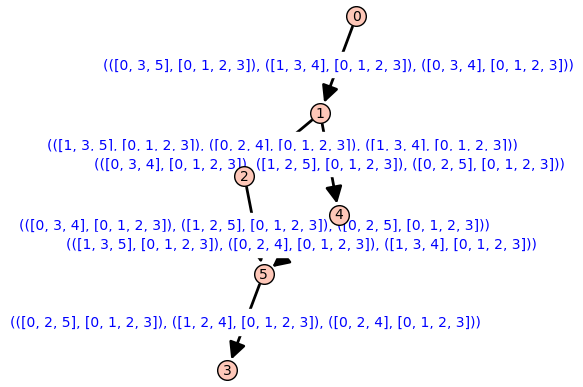

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
2 [([1, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [4, 5]), ([5, 4], [])]


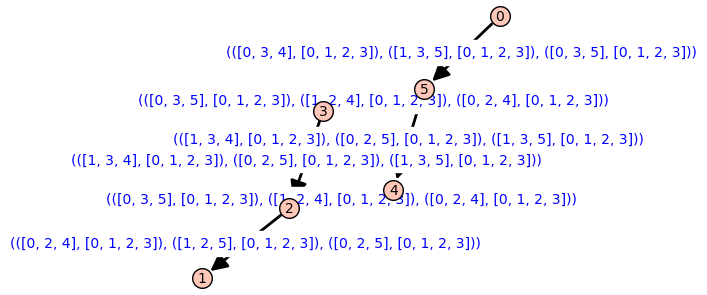

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [2, 3]), ([3, 2], [5, 4]), ([5, 4], [])]


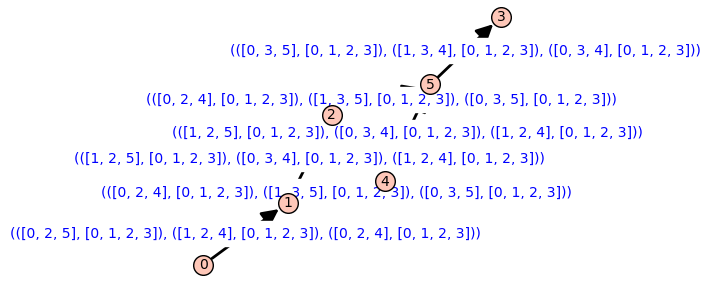

0 [([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
4 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
5 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [2, 3]), ([3, 2], [4, 5]), ([5, 4], [])]


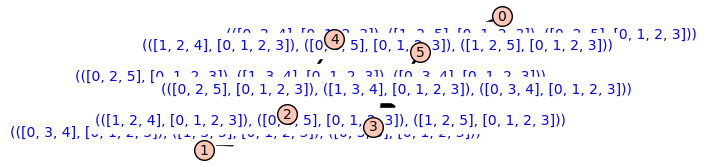

0 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([1, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [2, 3]), ([2, 3], [5, 4]), ([5, 4], [])]


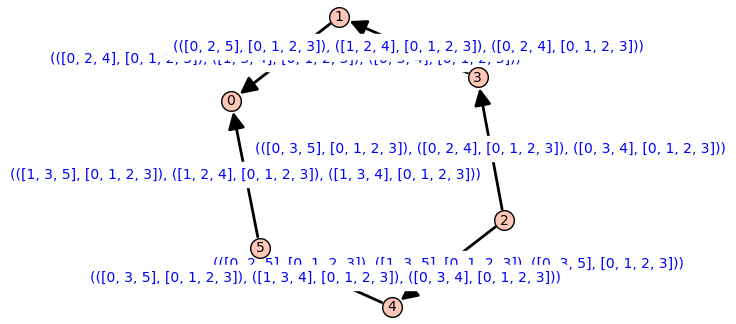

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
3 [([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([1, 0], [2, 3]), ([2, 3], [4, 5]), ([5, 4], [])]


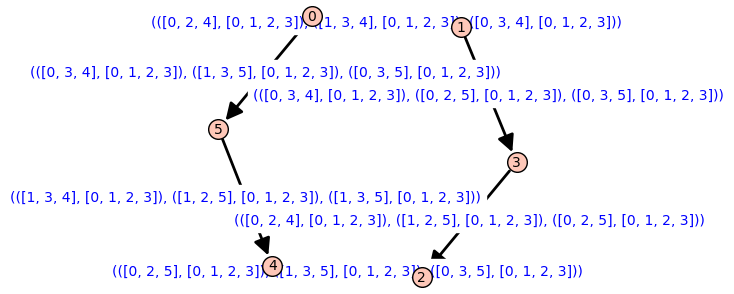

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
3 [([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]


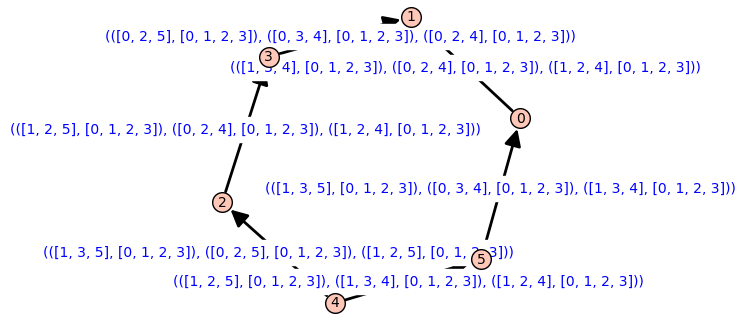

0 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([1, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [3, 2]), ([3, 2], [4, 5]), ([5, 4], [])]


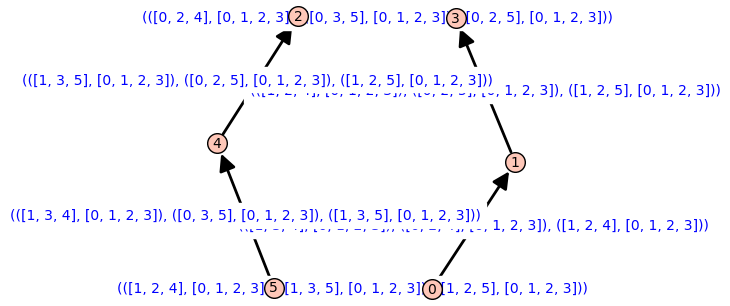

0 [([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
4 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
5 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]


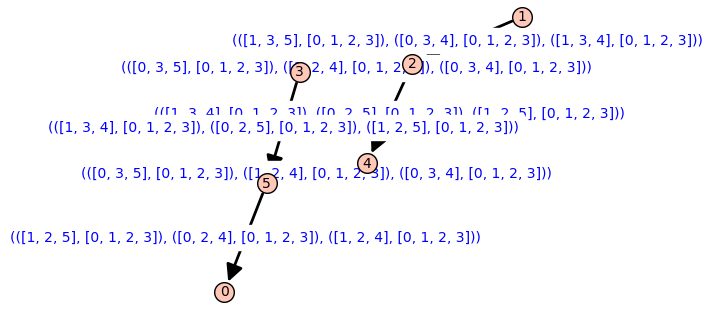

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [3, 2]), ([2, 3], [4, 5]), ([5, 4], [])]


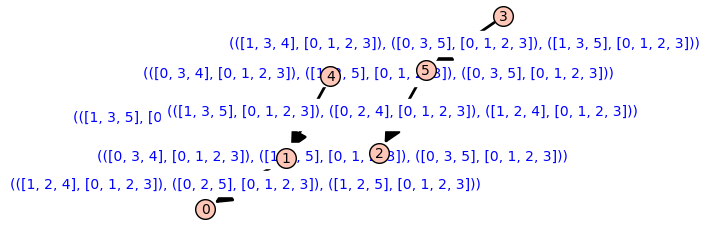

0 [([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
2 [([1, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [2, 3]), ([3, 2], [5, 4]), ([5, 4], [])]


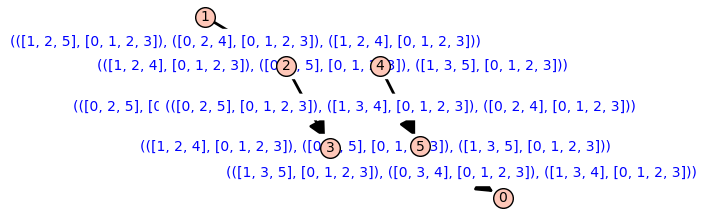

0 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
2 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
5 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [2, 3]), ([3, 2], [4, 5]), ([5, 4], [])]


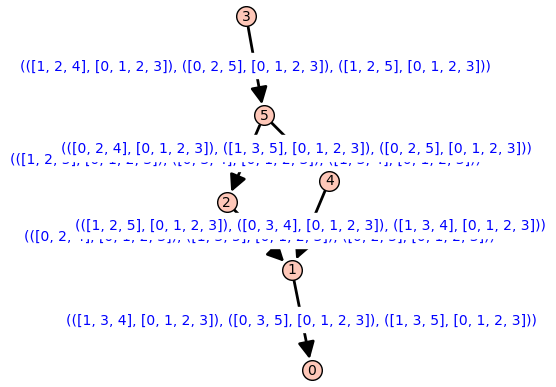

0 [([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3])]
1 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3])]
3 [([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [2, 3]), ([2, 3], [5, 4]), ([5, 4], [])]


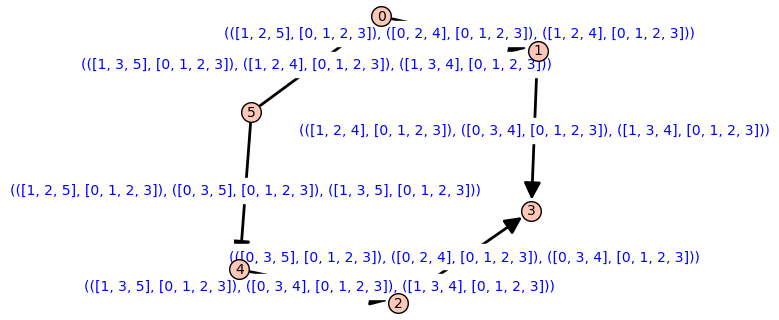

0 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
1 [([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
2 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
3 [([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
4 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
5 [([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([], [1, 0]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([5, 4], [])]


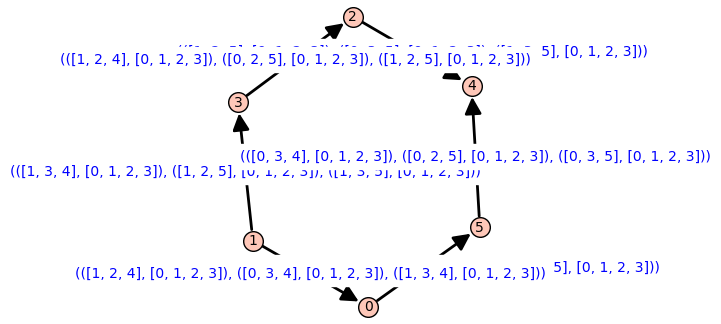

In [29]:
n = 4
D, F = oruga_framed(n)
D.show(edge_labels=True)

for F in all_framings_iterator(D):
    CC = list(cliques_of_routes_iterator(D, F))
    for i in range(len(CC)):
        print(i, CC[i])
    print(F)
    H = framing_lattice_labelled_with_exchange_pair(D, F)
    H.show(edge_labels=True)

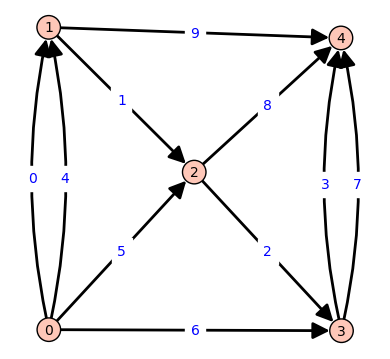

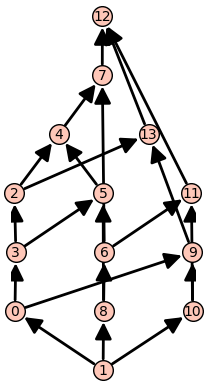

Universel []
0 [[4, 9], [5, 8], [6, 7], [5, 2, 7], [5, 2, 3], [4, 1, 2, 3], [0, 1, 2, 3]]
1 [[4, 9], [5, 8], [6, 7], [6, 3], [5, 2, 3], [4, 1, 2, 3], [0, 1, 2, 3]]
2 [[4, 9], [5, 8], [6, 7], [5, 2, 7], [4, 1, 2, 7], [0, 1, 2, 7], [0, 1, 2, 3]]
3 [[4, 9], [5, 8], [6, 7], [5, 2, 7], [4, 1, 2, 7], [4, 1, 2, 3], [0, 1, 2, 3]]
4 [[4, 9], [5, 8], [4, 1, 8], [6, 7], [4, 1, 2, 7], [0, 1, 2, 7], [0, 1, 2, 3]]
5 [[4, 9], [5, 8], [4, 1, 8], [6, 7], [4, 1, 2, 7], [4, 1, 2, 3], [0, 1, 2, 3]]
6 [[4, 9], [5, 8], [4, 1, 8], [0, 1, 8], [6, 7], [6, 3], [0, 1, 2, 3]]
7 [[4, 9], [5, 8], [4, 1, 8], [0, 1, 8], [6, 7], [0, 1, 2, 7], [0, 1, 2, 3]]
8 [[4, 9], [5, 8], [4, 1, 8], [6, 7], [6, 3], [4, 1, 2, 3], [0, 1, 2, 3]]
9 [[4, 9], [0, 9], [5, 8], [6, 7], [5, 2, 7], [5, 2, 3], [0, 1, 2, 3]]
10 [[4, 9], [0, 9], [5, 8], [6, 7], [6, 3], [5, 2, 3], [0, 1, 2, 3]]
11 [[4, 9], [0, 9], [5, 8], [0, 1, 8], [6, 7], [6, 3], [0, 1, 2, 3]]
12 [[4, 9], [0, 9], [5, 8], [0, 1, 8], [6, 7], [0, 1, 2, 7], [0, 1, 2, 3]]
13 [[4, 9]

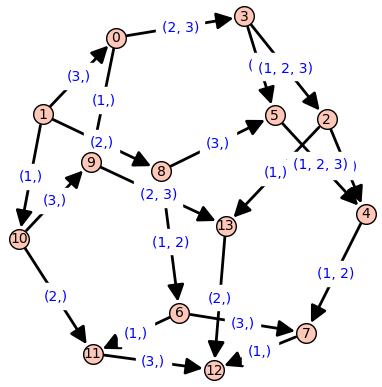

True
[([], [0, 4, 5, 6]), ([0, 4], [1, 9]), ([1, 5], [2, 8]), ([2, 6], [3, 7]), ([3, 7, 8, 9], [])]


In [14]:
D, F = caracol_framed_v2(5)
D.show(edge_labels=True)

Po = framing_lattice(D, F)
Po.show()

RR = routes(D)
Uni = []
for R in RR:
    if all(R[0] in C for C in CC):
        Uni.append(R[0])
print("Universel", Uni)
i = 0
CC = list(cliques_of_routes_iterator(D, F))
CC = [[R[0] for R in C] for C in CC]
for C in CC:
    print(i, [R for R in C if not R in Uni])
    i += 1

Po = framing_lattice_labelled_with_common_subroute_conflict(D, F)
Po.show(edge_labels=True)

print(Graph(Po).is_isomorphic(polytopes.associahedron('A3').graph()))
print(F)

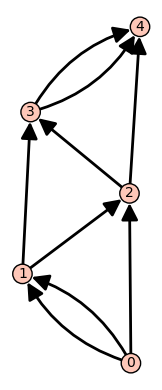

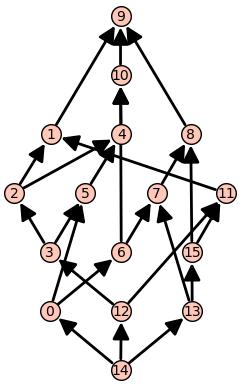

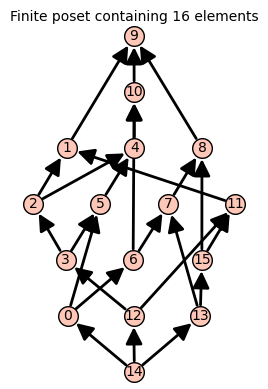

In [31]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 2, 0), (0, 1, 1), (0, 1, 2),
            (1, 3, 3), (1, 2, 4),
            (2, 4, 5), (2, 3, 6),
            (3, 4, 7), (3, 4, 8)])
F = automatic_framing(D)
D.show()
Po = framing_lattice(D, F)
Po.show()
Po

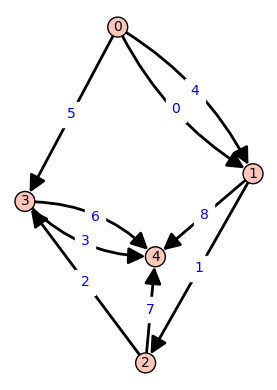

In [92]:
nD, nF = delete_edge_in_automatic_framing((0, 2, 5), D)
nD.show(edge_labels=True)

In [58]:
i = 0
for C in CC:
    if [8, 2, 4] in C:
        print(i, C)
    i += 1


2 [[7, 0], [8, 1], [8, 2, 4], [7, 5, 2, 4], [6, 5, 2, 4], [9, 3], [8, 2, 3]]
3 [[7, 0], [8, 1], [9, 4], [8, 2, 4], [7, 5, 2, 4], [6, 5, 2, 4], [9, 3]]
9 [[7, 0], [6, 0], [8, 1], [8, 2, 4], [6, 5, 2, 4], [9, 3], [8, 2, 3]]
10 [[7, 0], [6, 0], [8, 1], [9, 4], [8, 2, 4], [6, 5, 2, 4], [9, 3]]


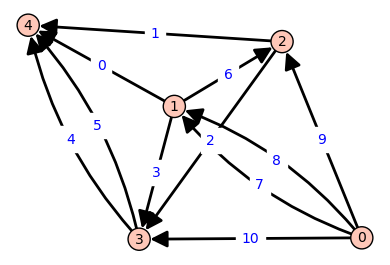

In [78]:
nD, nF = add_edge_in_automatic_framing((1, 3, 2.5), D)
nD.show(edge_labels=True)

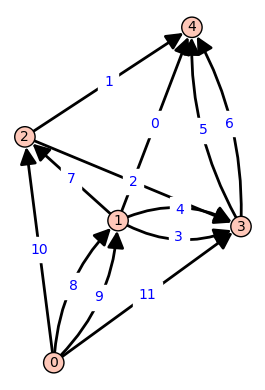

In [80]:
nD, nF = add_edges_in_automatic_framing([(1, 3, 2.5), (1, 3, 2.75)], D)
nD.show(edge_labels=True)

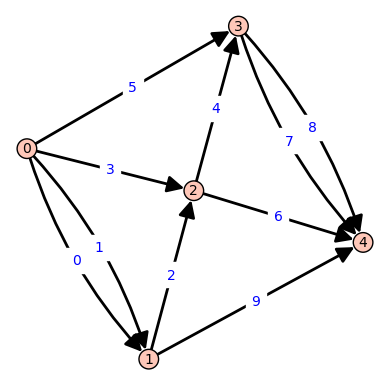

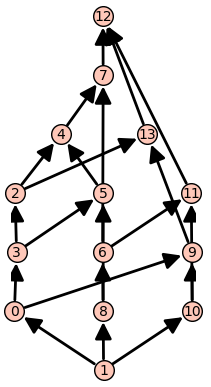

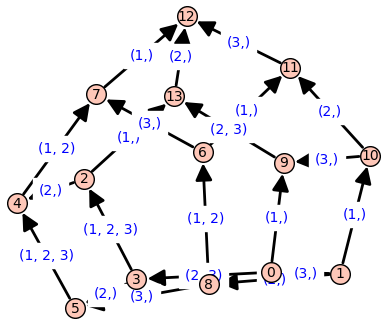

In [14]:
D = DiGraph()
D.allow_multiple_edges(True)

D.add_edges([
    (0, 1, 0), (0, 1, 1), 
    (1, 2, 2), 
    (0, 2, 3),
    (2, 3, 4),
    (0, 3, 5),
    (2, 4, 6),
    (3, 4, 7), (3, 4, 8),
    (1, 4, 9)
])
D.show(edge_labels=True)

F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()

Po = framing_lattice_labelled_with_common_subroute_conflict(D, F)
Po.show(edge_labels=True)

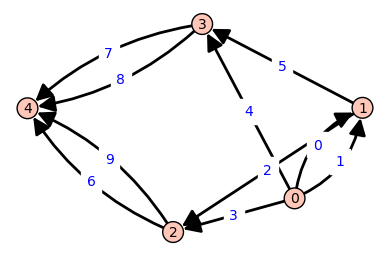

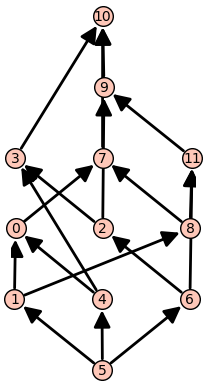

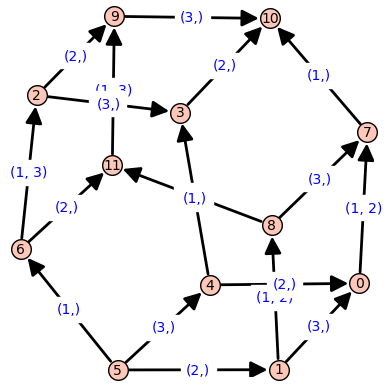

In [19]:
D = DiGraph()
D.allow_multiple_edges(True)

D.add_edges([
    (0, 1, 0), (0, 1, 1), 
    (1, 2, 2),
    (0, 2, 3),
    (0, 3, 4),
    (1, 3, 5),
    (2, 4, 6),
    (3, 4, 7), (3, 4, 8),
    (2, 4, 9)
])
D.show(edge_labels=True)

F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()

Po = framing_lattice_labelled_with_common_subroute_conflict(D, F)
Po.show(edge_labels=True)

In [17]:
G = polytopes.associahedron('A3').graph()
G.is_isomorphic(Graph(Po))

True

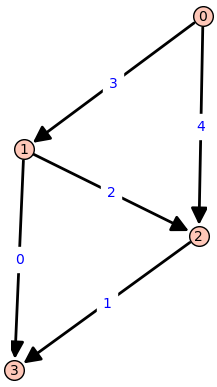

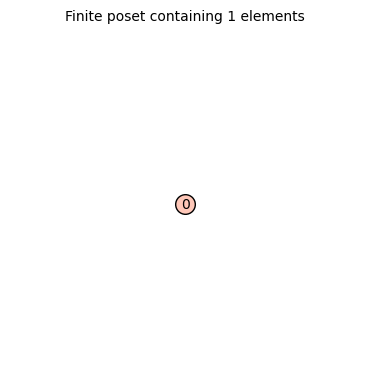

In [60]:
n = 4
D, F = caracol_framed(n)
D.show(edge_labels=True)
G = DiGraph()
G.allow_multiple_edges(True)

Po = framing_lattice(D, F)
Po

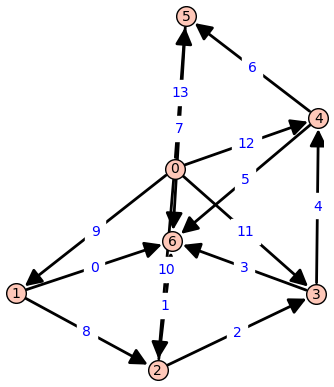

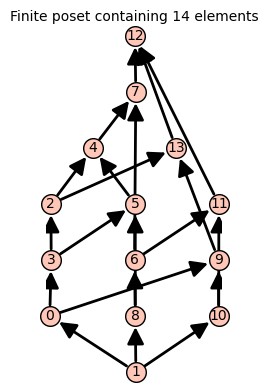

In [47]:
n = 7
D, F = caracol_framed(n)
D.show(edge_labels=True)
Po = framing_lattice(D, F)
Po

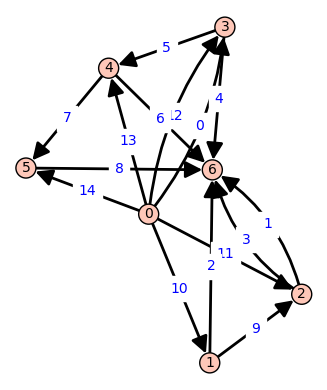

0
[[10, 9, 3], [12, 4], [13, 6], [12, 5, 6]]
1
[[10, 9, 3], [12, 4], [12, 5, 6], [12, 5, 7, 8]]
2
[[10, 9, 3], [0, 5, 6], [0, 5, 7, 8], [12, 5, 7, 8]]
3
[[10, 9, 3], [13, 6], [0, 5, 6], [12, 5, 6]]
4
[[10, 9, 3], [0, 5, 6], [12, 5, 6], [12, 5, 7, 8]]
5
[[11, 1], [12, 4], [13, 6], [12, 5, 6]]
6
[[11, 1], [12, 4], [12, 5, 6], [12, 5, 7, 8]]
7
[[11, 1], [0, 5, 6], [0, 5, 7, 8], [12, 5, 7, 8]]
8
[[11, 1], [13, 6], [0, 5, 6], [12, 5, 6]]
9
[[11, 1], [0, 5, 6], [12, 5, 6], [12, 5, 7, 8]]


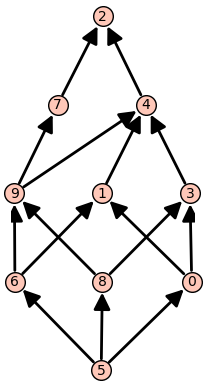

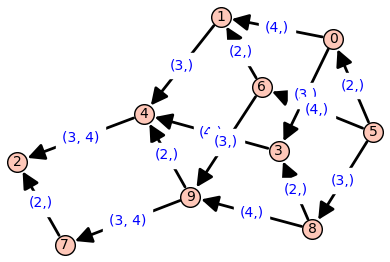

In [58]:
D, F = caracol_framed(n)
D.delete_edge((2, 3, 2))
G = DiGraph()
G.allow_multiple_edges(True)
for e in D.edges():
    G.add_edge((e[0], e[1], e[2] + 1 + int(e[2]<=2)))
G.add_edges([(0, 3, 0), (2, 6, 1)])
F = automatic_framing(G)
G.show(edge_labels=True)
Po = framing_lattice(G, F)
CC = cliques_of_routes_iterator(G, F)
CC = list(CC)
CC = [[R[0] for R in C] for C in CC]
com = []
for C in CC:
    for R in C:
        if not R in com:
            if all(R in c for c in CC):
                com.append(R)
i = 0
for C in CC:
    print(i)
    print([R for R in C if not R in com])
    i += 1
Po.show()
Po = framing_lattice_labelled_with_common_subroute_conflict(G, F)
Po.show(edge_labels=True)

In [59]:
Po.num_verts(), Po.num_edges()

(10, 15)

In [50]:
As = polytopes.associahedron('A3')
As.f_vector()

(1, 14, 21, 9, 1)

In [16]:
n = 7
D = oruga(n)
c = 0
for _ in all_framing_lattices_iterator(D):
    c += 1
    print(c)

1
2
3
4
5
6
7
8
9
10


KeyboardInterrupt: 

[(0, 1, {}, {}), (1, 2, {}, {}), (2, 3, {}, {}), (3, 4, {}, {}), (0, 2, {1}, {}), (0, 3, {1, 2}, {}), (0, 3, {1, 2}, {}), (0, 4, {1, 2, 3}, {}), (1, 4, {}, {2, 3}), (2, 4, {}, {3}), (3, 4, {}, {})]


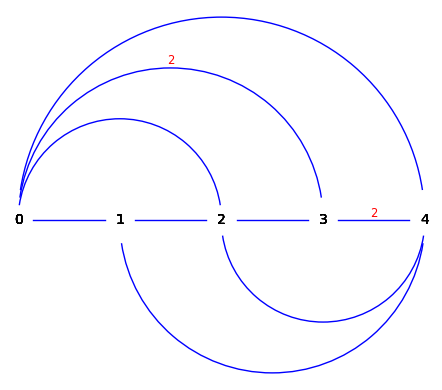

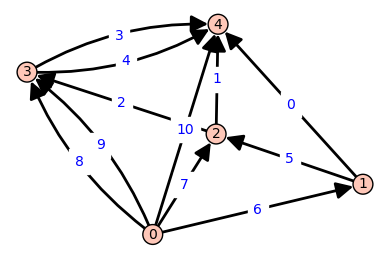

[([], [6, 7, 8, 9, 10]), ([6], [5, 0]), ([5, 7], [2, 1]), ([2, 8, 9], [4, 3]), ([0, 1, 3, 4, 10], [])]


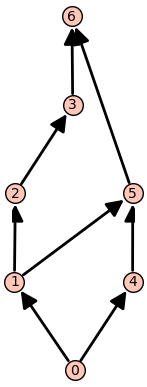

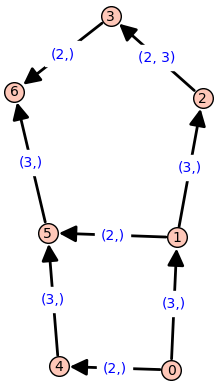

In [32]:
s = (1, 2, 1)

A = s_caracol(s)
print(A)
draw_arc_diagram(A).show(axes=False)

D, F = s_caracol_framed(s)
D.show(edge_labels=True)
print(F)

framing_lattice(D, F).show()

G = framing_lattice_labelled_with_common_subroute_conflict(D, F)
G.show(edge_labels=True)
framing_lattice_labelled_with_common_subroute_conflict?

[(0, 1, {}, {}), (1, 2, {}, {}), (1, 2, {}, {}), (2, 3, {}, {}), (2, 3, {}, {}), (3, 4, {}, {}), (3, 4, {}, {}), (0, 3, {1, 2}, {})]


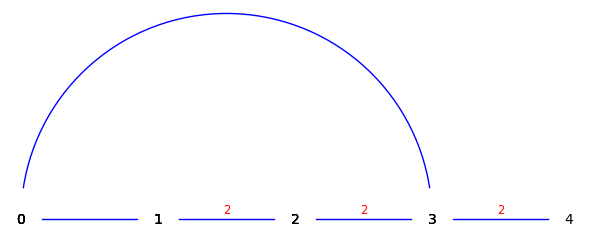

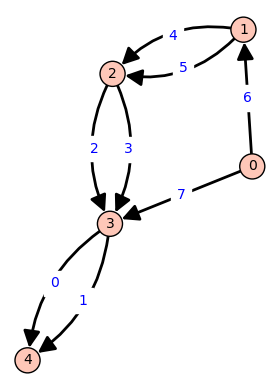

[([], [6, 7]), ([6], [4, 5]), ([4, 5], [2, 3]), ([2, 7, 3], [0, 1]), ([0, 1], [])]


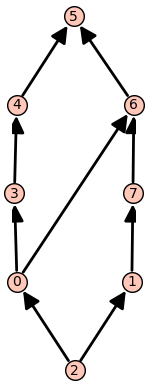

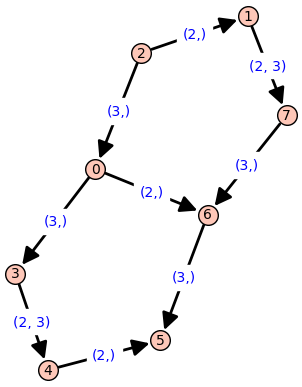

In [51]:
s = (1, 2, 1)

A = s_oruga(s)
print(A)
draw_arc_diagram(A).show(axes=False)

D, F = s_oruga_framed(s)
D.show(edge_labels=True)
print(F)

framing_lattice(D, F).show()

G = framing_lattice_labelled_with_common_subroute_conflict(D, F)
G.show(edge_labels=True)


[(0, 1, {}, {}), (1, 2, {}, {}), (1, 2, {}, {}), (2, 3, {}, {}), (2, 3, {}, {}), (3, 4, {}, {}), (3, 4, {}, {}), (0, 2, {1}, {}), (0, 3, {1, 2}, {})]


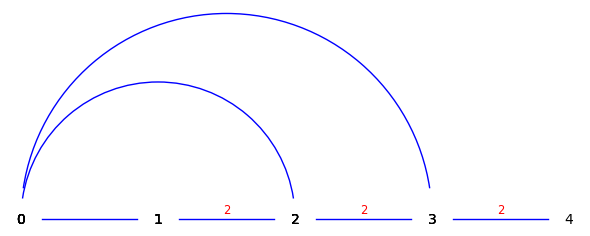

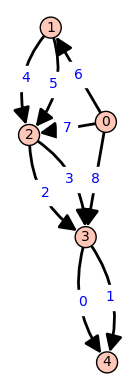

[([], [6, 7, 8]), ([6], [4, 5]), ([4, 7, 5], [2, 3]), ([2, 8, 3], [0, 1]), ([0, 1], [])]


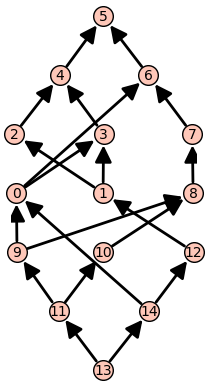

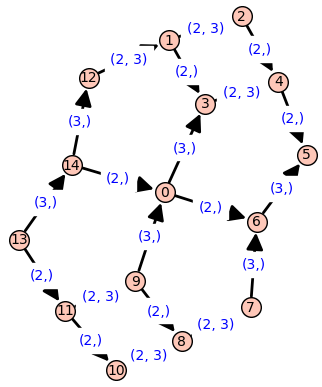

In [50]:
s = (1, 2, 2)

A = s_oruga(s)
print(A)
draw_arc_diagram(A).show(axes=False)

D, F = s_oruga_framed(s)
D.show(edge_labels=True)
print(F)

framing_lattice(D, F).show()

G = framing_lattice_labelled_with_common_subroute_conflict(D, F)
G.show(edge_labels=True)


Directed graph (on which we are going to take all framings);


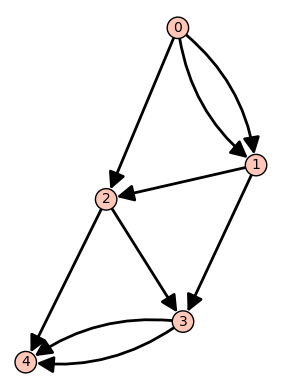

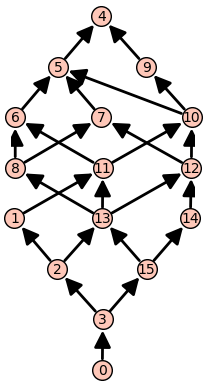

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([4, 3], [5, 8]), ([2, 5], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 1
planar: True



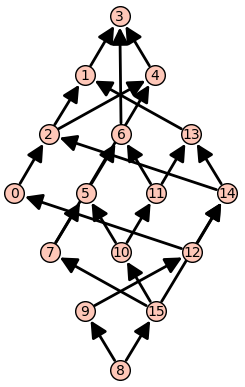

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([4, 3], [5, 8]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



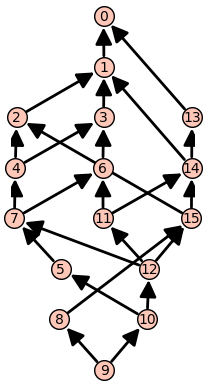

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([4, 3], [8, 5]), ([2, 5], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



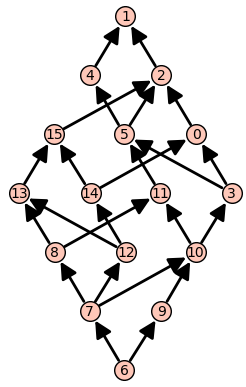

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([4, 3], [8, 5]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



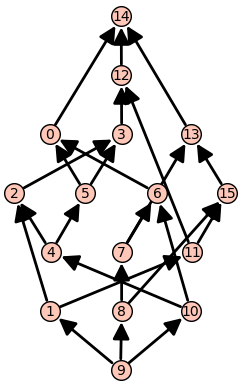

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([3, 4], [5, 8]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 3
planar: True



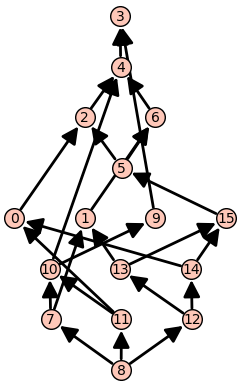

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([3, 4], [8, 5]), ([2, 5], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



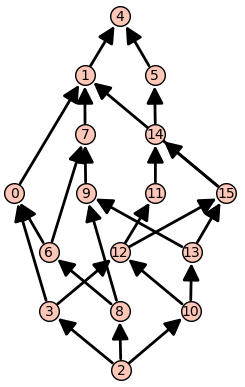

For possible framing:
[([], [1, 0, 4]), ([1, 0], [3, 2]), ([3, 4], [8, 5]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



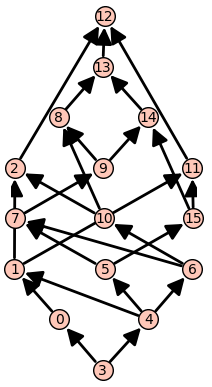

For possible framing:
[([], [1, 0, 4]), ([1, 0], [2, 3]), ([4, 3], [5, 8]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



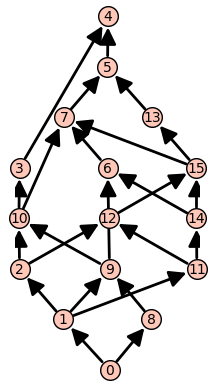

For possible framing:
[([], [1, 0, 4]), ([1, 0], [2, 3]), ([4, 3], [8, 5]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 2
planar: True



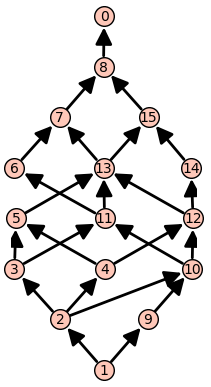

For possible framing:
[([], [1, 0, 4]), ([1, 0], [2, 3]), ([3, 4], [8, 5]), ([5, 2], [7, 6]), ([8, 7, 6], [])]

connectivity (vertex): 1
planar: True



In [22]:
# Pour Vincent 18.11.24

D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1),
            (0, 2, 4),
            (1, 3, 2), (1, 2, 3),
            (2, 3, 5),
            (2, 4, 8),
            (3, 4, 6), (3, 4, 7)])


print("Directed graph (on which we are going to take all framings);")
D.show()


for Po in all_framing_lattices_iterator(D, verbose=True):
    G = Graph(Po.hasse_diagram())
    print("connectivity (vertex):", G.vertex_connectivity())
    print("planar:", G.is_planar())
    print()

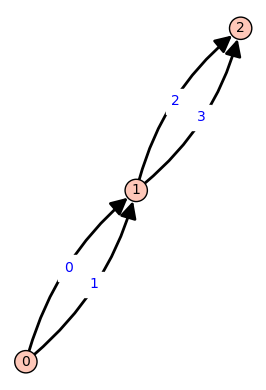

A 2-dimensional polyhedron in ZZ^4 defined as the convex hull of 4 vertices
[(0, 1, 0, 1), (0, 1, 1, 0), (1, 0, 0, 1), (1, 0, 1, 0)]


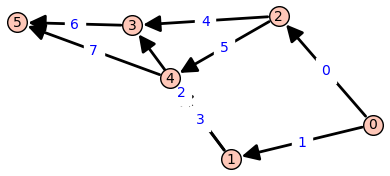

A 3-dimensional polyhedron in ZZ^8 defined as the convex hull of 4 vertices


Graphics3d Object

[(0, 1, 0, 1, 0, 0, 0, 1), (0, 1, 1, 0, 0, 0, 1, 0), (1, 0, 0, 0, 0, 1, 0, 1), (1, 0, 0, 0, 1, 0, 1, 0)]


In [22]:
D, F = oruga_framed(3)
D.show(edge_labels=True)
P = flow_polytope(D)
print(P)
print([v.vector() for v in P.vertices()])
L, FL = framed_line_graph(D, F)
L.show(edge_labels=True)
P = flow_polytope(L)
print(P)
P.affine_hull_projection().show()
print([v.vector() for v in P.vertices()])

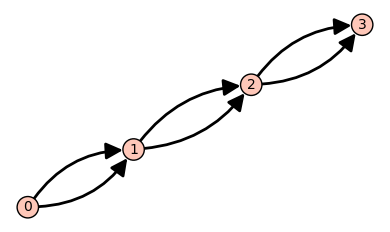

A 3-dimensional polyhedron in ZZ^6 defined as the convex hull of 8 vertices
[(0, 1, 0, 1, 0, 1), (0, 1, 0, 1, 1, 0), (0, 1, 1, 0, 0, 1), (0, 1, 1, 0, 1, 0), (1, 0, 0, 1, 0, 1), (1, 0, 0, 1, 1, 0), (1, 0, 1, 0, 0, 1), (1, 0, 1, 0, 1, 0)]


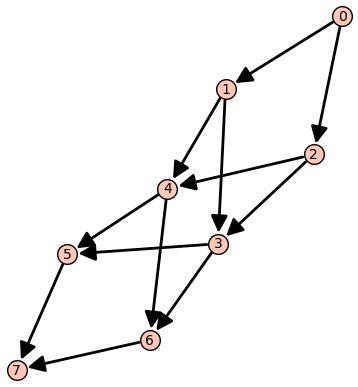

A 5-dimensional polyhedron in ZZ^12 defined as the convex hull of 8 vertices
[(0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1), (0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0), (0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1), (0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0), (1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1), (1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0), (1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1), (1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0)]
A 7-dimensional polyhedron in ZZ^20 defined as the convex hull of 8 vertices
[(0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1), (0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0), (0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1), (0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0), (1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1), (1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0), (1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1), (1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0)]


In [18]:
D, F = oruga_framed(4)
D.show()
P = flow_polytope(D)
print(P)
print([v.vector() for v in P.vertices()])
L, FL = framed_line_graph(D, F)
L.show()
P = flow_polytope(L)
print(P)
print([v.vector() for v in P.vertices()])
M, FM = framed_line_graph(L, FL)
Q = flow_polytope(M)
print(Q)
print([v.vector() for v in Q.vertices()])

In [4]:
D, F = oruga_framed(4)
print(D.edges())
L, FL = framed_line_graph(D, F)
print(L.edges())
L, FL = framed_line_graph(L, FL)
print(L.edges())

[(0, 1, 0), (0, 1, 1), (1, 2, 2), (1, 2, 3), (2, 3, 4), (2, 3, 5)]
[(0, 1, 1), (0, 2, 0), (1, 3, 2), (1, 4, 3), (2, 3, 4), (2, 4, 5), (3, 5, 6), (3, 6, 7), (4, 5, 8), (4, 6, 9), (5, 7, 10), (6, 7, 11)]
[(0, 1, 1), (0, 2, 0), (1, 5, 2), (1, 6, 3), (2, 3, 4), (2, 4, 5), (3, 7, 6), (3, 8, 7), (4, 9, 8), (4, 10, 9), (5, 7, 10), (5, 8, 11), (6, 9, 12), (6, 10, 13), (7, 11, 14), (8, 12, 15), (9, 11, 16), (10, 12, 17), (11, 13, 18), (12, 13, 19)]


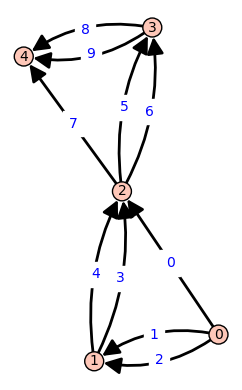

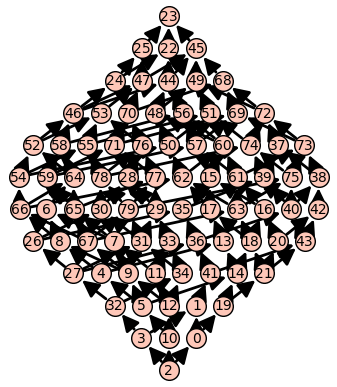

In [13]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 1), (0, 2, 0), (0, 1, 2),
            (1, 2, 4), (1, 2, 3), 
            (2, 3, 5), (2, 3, 6), (2, 4, 7),
            (3, 4, 8), (3, 4, 9)])
D.show(edge_labels=True)
F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()

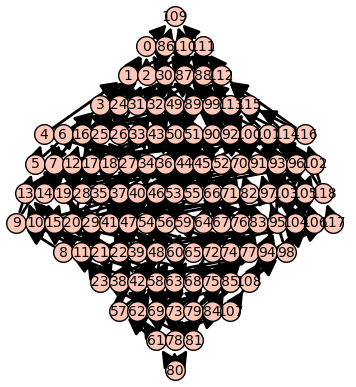

[([], [2, 1, 0]), ([2, 1], [3, 4]), ([0, 3, 4], [6, 5, 7]), ([6, 5], [9, 8]), ([7, 9, 8], [])]


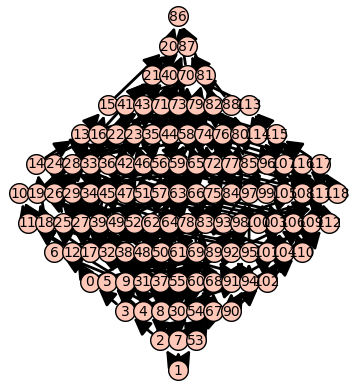

[([], [2, 1, 0]), ([2, 1], [3, 4]), ([0, 3, 4], [6, 7, 5]), ([6, 5], [9, 8]), ([7, 9, 8], [])]


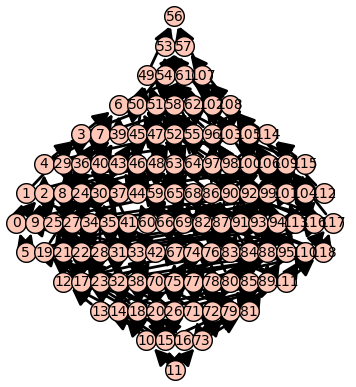

[([], [2, 1, 0]), ([2, 1], [3, 4]), ([0, 3, 4], [7, 6, 5]), ([6, 5], [9, 8]), ([7, 9, 8], [])]


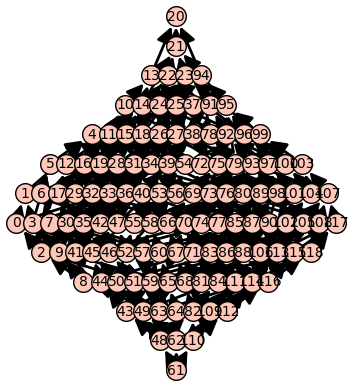

[([], [2, 1, 0]), ([2, 1], [3, 4]), ([3, 0, 4], [6, 7, 5]), ([6, 5], [9, 8]), ([7, 9, 8], [])]


KeyboardInterrupt: 

In [17]:
PoPo = []
for F in all_framings_iterator(D):
    L, FL = framed_line_graph(D, F)
    Po = framing_lattice(L, FL)
    if all(not Po.is_isomorphic(Q) for Q in PoPo):
        Po.show()
        PoPo.append(Po)
        print(F)

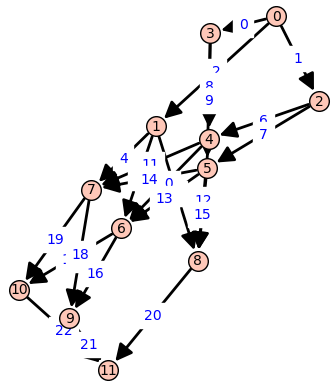

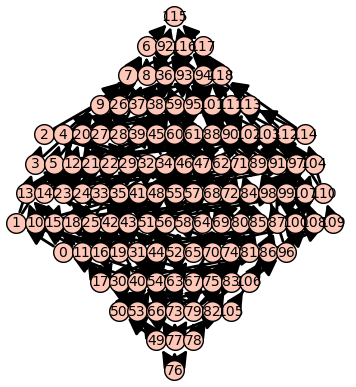

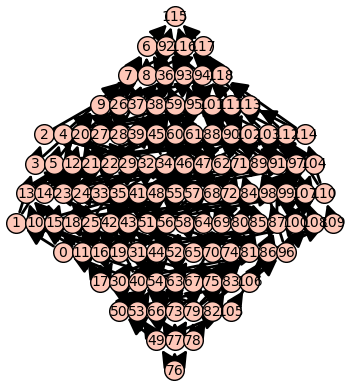

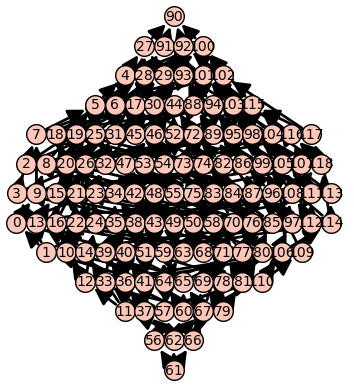

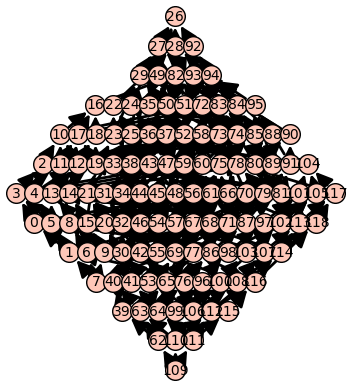

KeyboardInterrupt: 

In [15]:
L, FL = framed_line_graph(D, F)
L.show(edge_labels=True)
Po = framing_lattice(L, FL)
Po.show()
for Po in all_framing_lattices_iterator(L):
    Po.show()
#framing_lattice(L, FL)

In [43]:
len(routes(L))

15

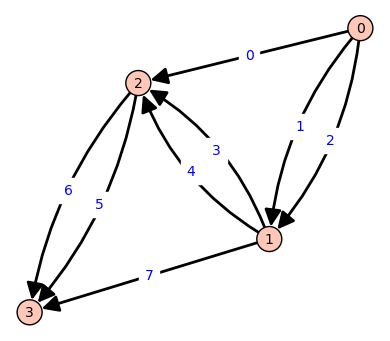

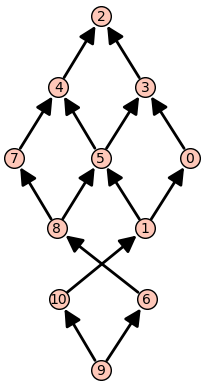

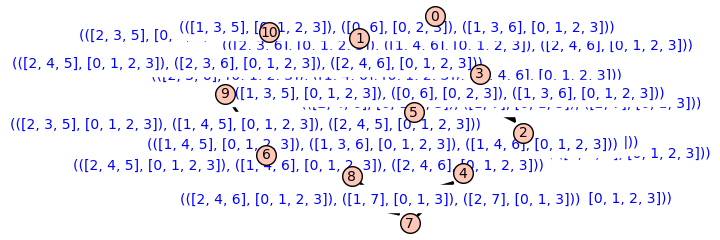

[[],
 [],
 [((0,), '?'),
  ((1,), '?'),
  ((2,), '?'),
  ((3,), '?'),
  ((4,), '?'),
  ((5,), '?'),
  ((6,), '?'),
  ((7,), '?'),
  ((8,), '?'),
  ((9,), '?'),
  ((10,), '?')],
 [((0, 3), '?'),
  ((1, 0), '?'),
  ((1, 5), '?'),
  ((3, 2), '?'),
  ((4, 2), '?'),
  ((5, 3), '?'),
  ((5, 4), '?'),
  ((6, 8), '?'),
  ((7, 4), '?'),
  ((8, 5), '?'),
  ((8, 7), '?'),
  ((9, 6), '?'),
  ((9, 10), '?'),
  ((10, 1), '?')],
 [((0, 3, 2), 'lower'),
  ((1, 5, 4), 'lower'),
  ((6, 8, 5), 'upper'),
  ((6, 8, 7), 'lower'),
  ((7, 4, 2), 'upper'),
  ((8, 5, 3), 'upper'),
  ((9, 10, 1), 'upper'),
  ((9, 6, 8), 'lower'),
  ((10, 1, 0), 'upper'),
  ((10, 1, 5), 'lower')],
 [((6, 8, 5, 3), 'upper'),
  ((9, 10, 1, 0), 'upper'),
  ((9, 6, 8, 7), 'lower'),
  ((10, 1, 5, 4), 'lower')]]

In [17]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 1), (0, 1, 2), (0, 2, 0), (1, 3, 7), 
            (1, 2, 4), (1, 2, 3), 
            (2, 3, 6), (2, 3, 5)])
D.show(edge_labels=True)
F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()
linear_intervals_upper_or_lower(D, F, verbose=True)

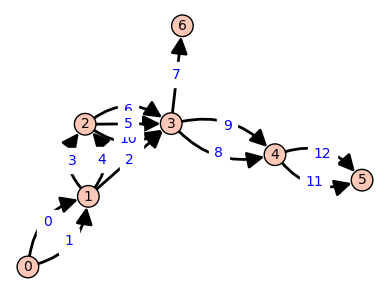

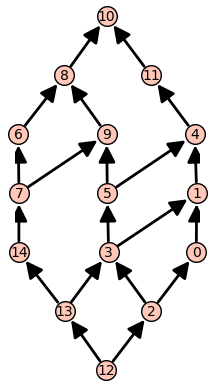

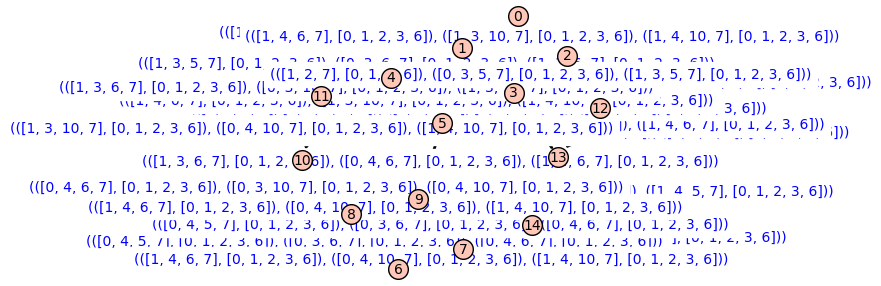

[[],
 [],
 [((0,), '?'),
  ((1,), '?'),
  ((2,), '?'),
  ((3,), '?'),
  ((4,), '?'),
  ((5,), '?'),
  ((6,), '?'),
  ((7,), '?'),
  ((8,), '?'),
  ((9,), '?'),
  ((10,), '?'),
  ((11,), '?'),
  ((12,), '?'),
  ((13,), '?'),
  ((14,), '?')],
 [((0, 1), '?'),
  ((1, 4), '?'),
  ((2, 0), '?'),
  ((2, 3), '?'),
  ((3, 1), '?'),
  ((3, 5), '?'),
  ((4, 11), '?'),
  ((5, 4), '?'),
  ((5, 9), '?'),
  ((6, 8), '?'),
  ((7, 6), '?'),
  ((7, 9), '?'),
  ((8, 10), '?'),
  ((9, 8), '?'),
  ((11, 10), '?'),
  ((12, 2), '?'),
  ((12, 13), '?'),
  ((13, 3), '?'),
  ((13, 14), '?'),
  ((14, 7), '?')],
 [((0, 1, 4), 'lower'),
  ((1, 4, 11), 'lower'),
  ((2, 3, 5), 'lower'),
  ((3, 5, 9), 'lower'),
  ((4, 11, 10), 'lower'),
  ((5, 9, 8), 'lower'),
  ((5, 4, 11), 'upper'),
  ((6, 8, 10), 'lower'),
  ((9, 8, 10), 'upper'),
  ((12, 2, 0), 'lower'),
  ((12, 13, 14), 'lower'),
  ((13, 3, 1), 'lower'),
  ((13, 3, 5), 'upper'),
  ((13, 14, 7), 'lower'),
  ((14, 7, 6), 'lower'),
  ((14, 7, 9), 'upper')],
 [((0,

In [18]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1),
             (1, 3, 2), (1, 2, 3), (1, 2, 4),
            (2, 3, 5), (2, 3, 6), (2, 3, 10), 
            (3, 6, 7), (3, 4, 8), (3, 4, 9),
            (4, 5, 11), (4, 5, 12)])
D.show(edge_labels=True)
F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()
linear_intervals_upper_or_lower(D, F, verbose=True)

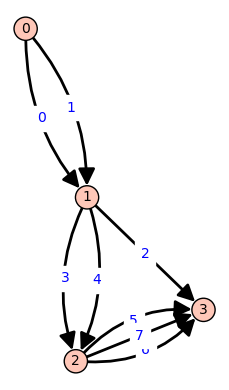

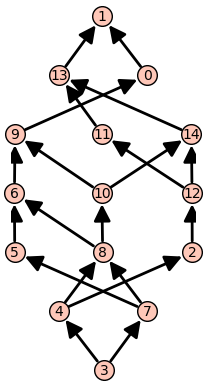

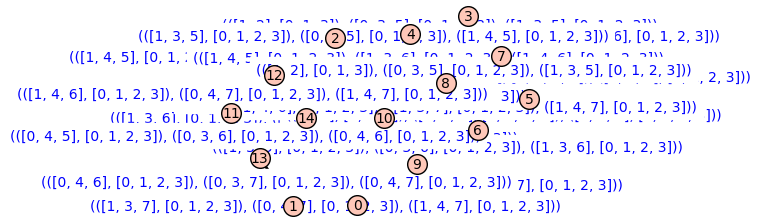

[[],
 [],
 [((0,), '?'),
  ((1,), '?'),
  ((2,), '?'),
  ((3,), '?'),
  ((4,), '?'),
  ((5,), '?'),
  ((6,), '?'),
  ((7,), '?'),
  ((8,), '?'),
  ((9,), '?'),
  ((10,), '?'),
  ((11,), '?'),
  ((12,), '?'),
  ((13,), '?'),
  ((14,), '?')],
 [((0, 1), '?'),
  ((2, 12), '?'),
  ((3, 4), '?'),
  ((3, 7), '?'),
  ((4, 2), '?'),
  ((4, 8), '?'),
  ((5, 6), '?'),
  ((6, 9), '?'),
  ((7, 5), '?'),
  ((7, 8), '?'),
  ((8, 6), '?'),
  ((8, 10), '?'),
  ((9, 0), '?'),
  ((10, 9), '?'),
  ((10, 14), '?'),
  ((11, 13), '?'),
  ((12, 11), '?'),
  ((12, 14), '?'),
  ((13, 1), '?'),
  ((14, 13), '?')],
 [((2, 12, 11), 'lower'),
  ((2, 12, 14), 'upper'),
  ((3, 4, 2), 'lower'),
  ((3, 7, 5), 'lower'),
  ((4, 8, 6), 'lower'),
  ((4, 8, 10), 'upper'),
  ((4, 2, 12), 'lower'),
  ((5, 6, 9), 'lower'),
  ((6, 9, 0), 'lower'),
  ((7, 8, 10), 'lower'),
  ((8, 10, 14), 'lower'),
  ((9, 0, 1), 'lower'),
  ((10, 9, 0), 'upper'),
  ((10, 14, 13), 'lower'),
  ((11, 13, 1), 'lower'),
  ((14, 13, 1), 'upper')],
 [

In [21]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1),
             (1, 3, 2), (1, 2, 3), (1, 2, 4),
            (2, 3, 7), (2, 3, 5), (2, 3, 6)])
D.show(edge_labels=True)
F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()
linear_intervals_upper_or_lower(D, F, verbose=True)

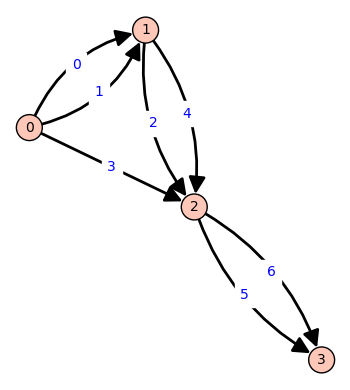

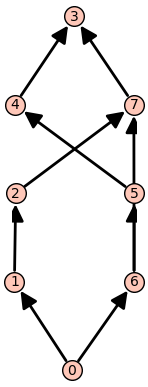

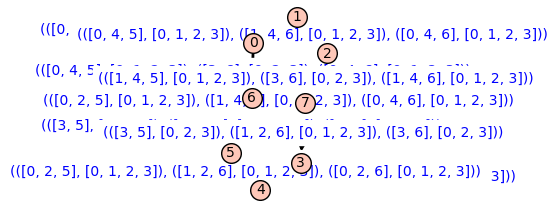

[[],
 [],
 [((0,), '?'),
  ((1,), '?'),
  ((2,), '?'),
  ((3,), '?'),
  ((4,), '?'),
  ((5,), '?'),
  ((6,), '?'),
  ((7,), '?')],
 [((0, 1), '?'),
  ((0, 6), '?'),
  ((1, 2), '?'),
  ((2, 7), '?'),
  ((4, 3), '?'),
  ((5, 4), '?'),
  ((6, 5), '?'),
  ((6, 7), '?'),
  ((7, 3), '?')],
 [((0, 1, 2), 'lower'),
  ((0, 6, 5), 'upper'),
  ((1, 2, 7), 'upper'),
  ((2, 7, 3), 'upper'),
  ((5, 4, 3), 'lower'),
  ((6, 5, 4), 'upper')],
 [((0, 6, 5, 4), 'upper'), ((1, 2, 7, 3), 'upper')]]

In [21]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (0, 2, 3), 
            (1, 2, 2), (1, 2, 4), 
            (2, 3, 5), (2, 3, 6)])
D.show(edge_labels=True)
F = automatic_framing(D)
F[1] = ((F[1][0][1], F[1][0][0]), F[1][1])
Po = framing_lattice(D, F)
Po.show()
linear_intervals_upper_or_lower(D, F, verbose=True)

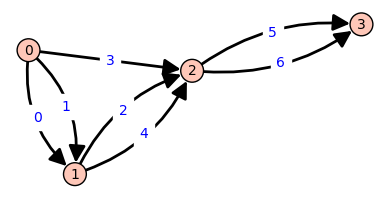

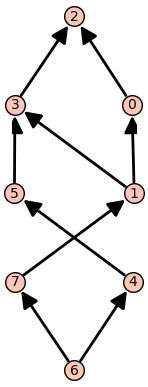

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([3, 4, 2], [6, 5]), ([6, 5], [])]
((4, 5, 3), 'upper')
((5, 3, 2), 'upper')
((6, 7, 1), 'upper')
((6, 4, 5), 'lower')
((7, 1, 0), 'upper')
((7, 1, 3), 'lower')
((4, 5, 3, 2), 'upper')
((6, 7, 1, 0), 'upper')



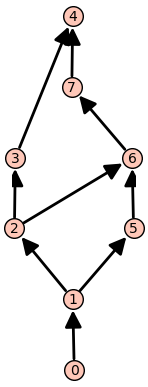

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([3, 2, 4], [6, 5]), ([6, 5], [])]
((0, 1, 2), 'upper')
((0, 1, 5), 'lower')
((1, 2, 3), 'upper')
((2, 6, 7), 'lower')
((5, 6, 7), 'upper')
((6, 7, 4), 'upper')
((0, 1, 2, 3), 'upper')
((5, 6, 7, 4), 'upper')



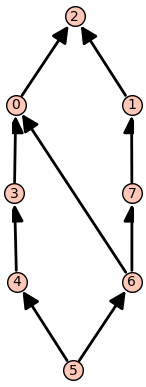

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([4, 3, 2], [6, 5]), ([6, 5], [])]
((3, 0, 2), 'upper')
((4, 3, 0), 'upper')
((5, 4, 3), 'lower')
((5, 6, 7), 'upper')
((6, 7, 1), 'upper')
((7, 1, 2), 'lower')
((4, 3, 0, 2), 'upper')
((5, 6, 7, 1), 'upper')



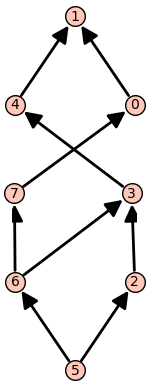

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([4, 2, 3], [6, 5]), ([6, 5], [])]
((2, 3, 4), 'upper')
((3, 4, 1), 'upper')
((5, 6, 7), 'upper')
((6, 7, 0), 'upper')
((6, 3, 4), 'lower')
((7, 0, 1), 'lower')
((2, 3, 4, 1), 'upper')
((5, 6, 7, 0), 'upper')



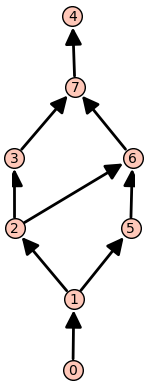

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([2, 3, 4], [6, 5]), ([6, 5], [])]
((0, 1, 2), 'upper')
((0, 1, 5), 'lower')
((1, 2, 3), 'upper')
((3, 7, 4), 'lower')
((5, 6, 7), 'upper')
((6, 7, 4), 'upper')
((0, 1, 2, 3), 'upper')
((5, 6, 7, 4), 'upper')



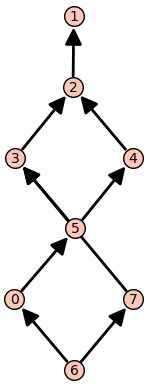

[([], [1, 0, 3]), ([1, 0], [4, 2]), ([2, 4, 3], [6, 5]), ([6, 5], [])]
((0, 5, 3), 'lower')
((0, 5, 4), 'upper')
((3, 2, 1), 'upper')
((4, 2, 1), 'lower')
((6, 0, 5), 'upper')
((7, 3, 2), 'upper')
((6, 0, 5, 4), 'upper')
((7, 3, 2, 1), 'upper')



In [30]:
PoPo = []

D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (0, 2, 3), 
            (1, 2, 2), (1, 2, 4), 
            (2, 3, 5), (2, 3, 6)])
D.show(edge_labels=True)
for F in all_framings_iterator(D):
    Po = framing_lattice(D, F)
    if all(not Po.is_isomorphic(Q) for Q in PoPo):
        PoPo.append(Po)
        Po.show()
        print(F)
        for li in linear_intervals_upper_or_lower(D, F):
            if len(li) >= 1 and len(li[0][0]) >= 3 :
                for l in li:
                    print(l)
        print()

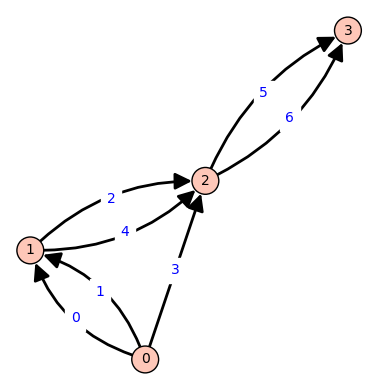

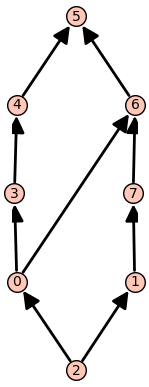

In [16]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (0, 2, 3), 
            (1, 2, 2), (1, 2, 4), 
            (2, 3, 5), (2, 3, 6)])
D.show(edge_labels=True)
F = automatic_framing(D)
Po = framing_lattice(D, F)
Po.show()

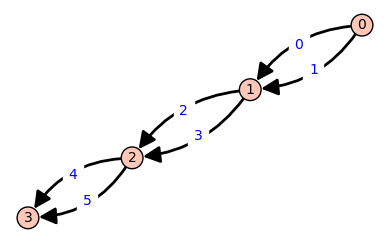

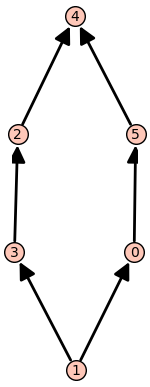

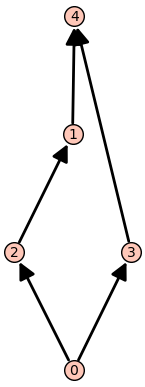

In [24]:
D, F = oruga_framed(4)
D.show(edge_labels=True)

Po = framing_lattice(D, F)
Po.show()

M, FM = M_moves(D, F, moves=[3])
PoM = framing_lattice(M, FM)
PoM.show()

#M, FM = M_moves(D, F, moves=[2, 3])
#PoM = framing_lattice(M, FM)
#PoM.show()

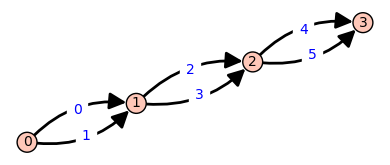

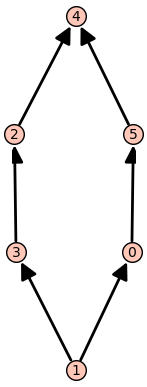

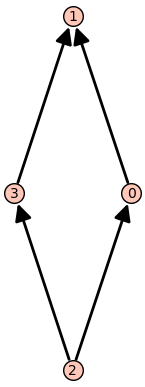

In [27]:
D, F = oruga_framed(4)
D.show(edge_labels=True)

Po = framing_lattice(D, F)
Po.show()

M, FM = framed_line_graph(D, F)
PoM = framing_lattice(M, FM)
PoM.show()

#M, FM = M_moves(D, F, moves=[2, 3])
#PoM = framing_lattice(M, FM)
#PoM.show()

In [25]:
CC = list(cliques_of_routes_iterator(M, FM))
for C in CC:
    print([R[0] for R in C])

[[1, 5], [6, 4], [6, 3], [1, 2, 3], [0, 2, 3]]
[[1, 5], [6, 4], [1, 2, 4], [0, 2, 4], [0, 2, 3]]
[[1, 5], [6, 4], [1, 2, 4], [1, 2, 3], [0, 2, 3]]
[[1, 5], [0, 5], [6, 4], [6, 3], [0, 2, 3]]
[[1, 5], [0, 5], [6, 4], [0, 2, 4], [0, 2, 3]]


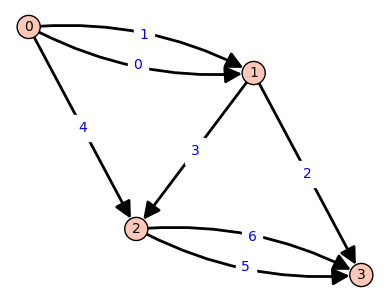

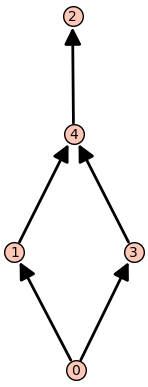

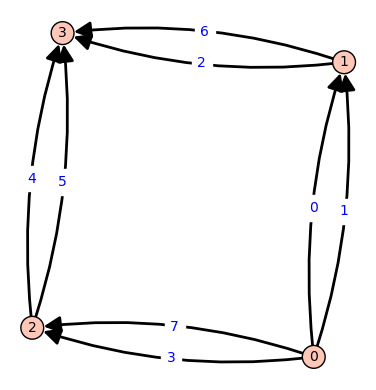

[([], [1, 0, 7, 3]), ([0, 1], [2, 6]), ([7, 3], [4, 5]), ([6, 2, 5, 4], [])]


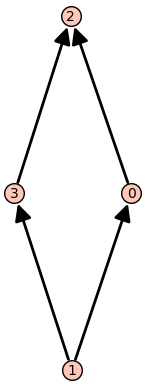

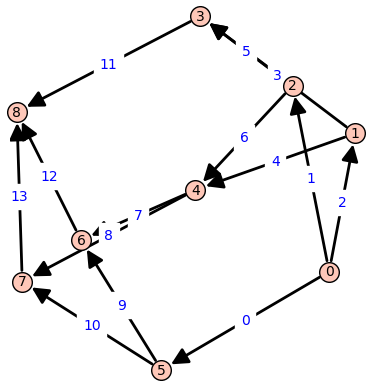

[([], [2, 1, 0]), ([2], [3, 4]), ([1], [5, 6]), ([3, 5], [11]), ([4, 6], [7, 8]), ([0], [9, 10]), ([7, 9], [12]), ([8, 10], [13]), ([11, 12, 13], [])]


In [134]:
G = DiGraph()
G.allow_multiple_edges(True)
G.add_edges([(0, 1, 0), (0, 1, 1), (0, 2, 4),
            (1, 3, 2), (1, 2, 3),
            (2, 3, 5), (2, 3, 6)])
G.show(edge_labels=True)
F = automatic_framing(G)
Po = framing_lattice(G, F)
Po.show()

M, FM = M_moves(G, F)
M.show(edge_labels=True)
print(FM)
PoM = framing_lattice(M, FM)
PoM.show()

L, FL = framed_line_graph(G, F)
L.show(edge_labels=True)
print(FL)
PoL = framing_lattice(L, FL)
PoL.show()

0 []
1 [((0, 1, 5), (1, 2, 1)), ((0, 1, 5), (1, 4, 9))]
2 [((0, 2, 6), (2, 3, 2)), ((0, 2, 6), (2, 4, 3)), ((0, 2, 6), (2, 5, 4)), ((1, 2, 1), (2, 3, 2)), ((1, 2, 1), (2, 4, 3)), ((1, 2, 1), (2, 5, 4))]
3 [((0, 3, 7), (3, 5, 10)), ((2, 3, 2), (3, 5, 10))]
4 [((1, 4, 9), (4, 5, 8)), ((2, 4, 3), (4, 5, 8))]
5 []


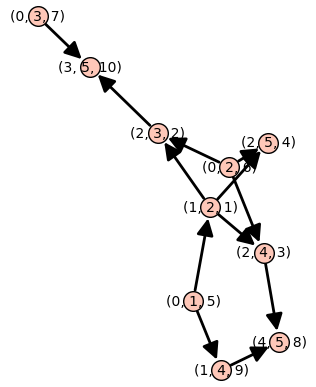

In [94]:
L = DiGraph()
for v in G.vertices():
    E = [(e, f) for e in G.incoming_edges(v) for f in G.outgoing_edges(v)]
    L.add_edges(E)
    print(v, E)
L.show()

[(0, 1, 5), (0, 2, 6), (0, 3, 7), (1, 2, 1), (1, 4, 9), (2, 3, 2), (2, 4, 3), (2, 5, 4), (3, 5, 10), (4, 5, 8)]


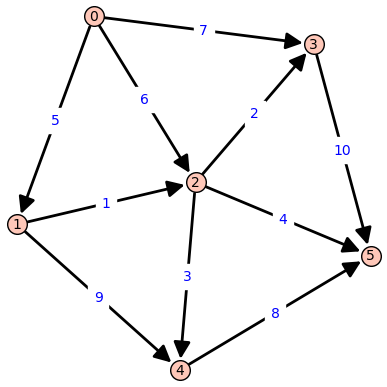

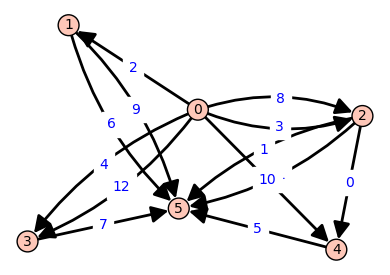

In [100]:
G = DiGraph()
G.allow_multiple_edges(True)
G.add_edges([(0, 1, 5), (0, 2, 6), (0, 3, 7), (1, 2, 1), (2, 3, 2), (1, 4, 9), (3, 5, 10), (2, 4, 3), (2, 5, 4), (4, 5, 8)])
print(G.edges())
G.show(edge_labels = True)

moves = [1, 9, 2]

M, FM = M_moves(G, F, moves)
M.show(edge_labels = True)

In [102]:
FM

[([], [2, 8, 3, 12, 4, 10]),
 ([2], [6]),
 ([8, 3], [11, 0, 1]),
 ([12, 4], []),
 ([0], []),
 ([9, 6, 11, 1, 7, 5], [])]

In [83]:
M.relabel?

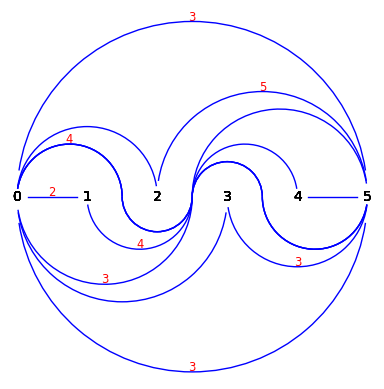

Arc diagram is non_crossing: True

Framing:
0 ([], [0, 1, 2, 6, 7, 8, 9, 14, 15, 16, 17, 18, 19, 20, 22, 23, 29, 30, 31])
1 ([14, 15], [10, 11, 12, 13])
2 ([23], [24, 25, 26, 27, 28])
3 ([6], [3, 4, 5])
4 ([20], [21])
5 ([0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 21, 22, 24, 25, 26, 27, 28, 29, 30, 31], [])

Edges:
0 (0, 5, {}, {1, 2, 3, 4})
1 (0, 5, {}, {1, 2, 3, 4})
2 (0, 5, {}, {1, 2, 3, 4})
3 (3, 5, {}, {4})
4 (3, 5, {}, {4})
5 (3, 5, {}, {4})
6 (0, 3, {}, {1, 2})
7 (0, 5, {3}, {1, 2, 4})
8 (0, 5, {3}, {1, 2, 4})
9 (0, 5, {3}, {1, 2, 4})
10 (1, 5, {3}, {2, 4})
11 (1, 5, {3}, {2, 4})
12 (1, 5, {3}, {2, 4})
13 (1, 5, {3}, {2, 4})
14 (0, 1, {}, {})
15 (0, 1, {}, {})
16 (0, 5, {1, 3}, {2, 4})
17 (0, 5, {1, 3}, {2, 4})
18 (0, 5, {1, 3}, {2, 4})
19 (0, 5, {1, 3}, {2, 4})
20 (0, 4, {1, 3}, {2})
21 (4, 5, {}, {})
22 (0, 5, {1, 3, 4}, {2})
23 (0, 2, {1}, {})
24 (2, 5, {3, 4}, {})
25 (2, 5, {3, 4}, {})
26 (2, 5, {3, 4}, {})
27 (2, 5, {3, 4}, {})
28 (2, 5, {3, 4}, {})
29 (0, 

In [22]:
n = 6
m = 30

# Note that, in a drawing of an arc diagram, if an arc appears several time,
# only 1 copy will be shown, with a red number above, indicating the number of copies.
# Sometimes, red numbers are printed on top of each others, and some draws of arcs coincide:
# shit happens!

#Alpha = random_non_crossing_arc_diagram(n, m)
Alpha = [(0, 1, Set(), Set()), (0, 1, Set(), Set()), (0, 2, Set({1}), Set()), (0, 3, Set(), Set({1, 2})), (0, 4, Set({1, 3}), Set({2})), (0, 5, Set(), Set({1, 2, 3, 4})), (0, 5, Set(), Set({1, 2, 3, 4})), (0, 5, Set(), Set({1, 2, 3, 4})), (0, 5, Set({1, 2, 3, 4}), Set()), (0, 5, Set({1, 2, 3, 4}), Set()), (0, 5, Set({1, 2, 3, 4}), Set()), (0, 5, Set({1, 3}), Set({2, 4})), (0, 5, Set({1, 3}), Set({2, 4})), (0, 5, Set({1, 3}), Set({2, 4})), (0, 5, Set({1, 3}), Set({2, 4})), (0, 5, Set({1, 3, 4}), Set({2})), (0, 5, Set({3}), Set({1, 2, 4})), (0, 5, Set({3}), Set({1, 2, 4})), (0, 5, Set({3}), Set({1, 2, 4})), (1, 5, Set({3}), Set({2, 4})), (1, 5, Set({3}), Set({2, 4})), (1, 5, Set({3}), Set({2, 4})), (1, 5, Set({3}), Set({2, 4})), (2, 5, Set({3, 4}), Set()), (2, 5, Set({3, 4}), Set()), (2, 5, Set({3, 4}), Set()), (2, 5, Set({3, 4}), Set()), (2, 5, Set({3, 4}), Set()), (3, 5, Set(), Set({4})), (3, 5, Set(), Set({4})), (3, 5, Set(), Set({4})), (4, 5, Set(), Set())]
Alpha = sort_non_crossing_arc_diagram_bottom_to_top(Alpha)
draw_arc_diagram(Alpha, 'figures').show(axes = False)
print("Arc diagram is non_crossing:", is_non_crossing_arc_diagramm(Alpha))
print()

D, F = digraph_and_framing_on_non_crossing_arc_diagram(Alpha, already_sorted=True)
#D.show(edge_labels=True)
print("Framing:")
for i in range(len(F)):
    print(i, F[i])
print()
print("Edges:")
for i in range(len(Alpha)):
    print(i, Alpha[i])

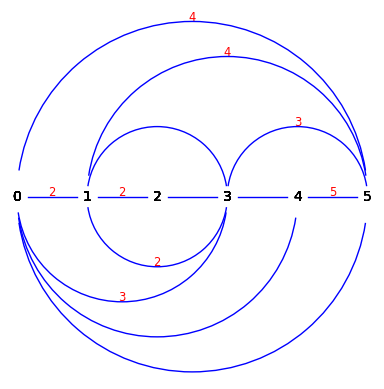

Arc diagram is non_crossing: True

Framing:
0 ([], [0, 6, 11, 12, 13, 24, 25, 26, 27, 28, 29])
1 ([24, 25], [14, 15, 16, 17, 19, 20, 21, 22, 23])
2 ([16, 17], [18])
3 ([11, 12, 13, 14, 15, 18, 19], [7, 8, 9, 10])
4 ([6, 7], [1, 2, 3, 4, 5])
5 ([0, 1, 2, 3, 4, 5, 8, 9, 10, 20, 21, 22, 23, 26, 27, 28, 29], [])

Edges:
0 (0, 5, {}, {1, 2, 3, 4})
1 (4, 5, {}, {})
2 (4, 5, {}, {})
3 (4, 5, {}, {})
4 (4, 5, {}, {})
5 (4, 5, {}, {})
6 (0, 4, {}, {1, 2, 3})
7 (3, 4, {}, {})
8 (3, 5, {4}, {})
9 (3, 5, {4}, {})
10 (3, 5, {4}, {})
11 (0, 3, {}, {1, 2})
12 (0, 3, {}, {1, 2})
13 (0, 3, {}, {1, 2})
14 (1, 3, {}, {2})
15 (1, 3, {}, {2})
16 (1, 2, {}, {})
17 (1, 2, {}, {})
18 (2, 3, {}, {})
19 (1, 3, {2}, {})
20 (1, 5, {2, 3, 4}, {})
21 (1, 5, {2, 3, 4}, {})
22 (1, 5, {2, 3, 4}, {})
23 (1, 5, {2, 3, 4}, {})
24 (0, 1, {}, {})
25 (0, 1, {}, {})
26 (0, 5, {1, 2, 3, 4}, {})
27 (0, 5, {1, 2, 3, 4}, {})
28 (0, 5, {1, 2, 3, 4}, {})
29 (0, 5, {1, 2, 3, 4}, {})


In [38]:
n = 6
m = 30

# Note that, in a drawing of an arc diagram, if an arc appears several time,
# only 1 copy will be shown, with a red number above, indicating the number of copies.
# Sometimes, red numbers are printed on top of each others, and some draws of arcs coincide:
# shit happens!

Alpha = random_non_crossing_arc_diagram(n, m)
Alpha = sort_non_crossing_arc_diagram_bottom_to_top(Alpha)
draw_arc_diagram(Alpha, 'figures').show(axes = False)
print("Arc diagram is non_crossing:", is_non_crossing_arc_diagramm(Alpha))
print()

D, F = digraph_and_framing_on_non_crossing_arc_diagram(Alpha, already_sorted=True)
#D.show(edge_labels=True)
print("Framing:")
for i in range(len(F)):
    print(i, F[i])
print()
print("Edges:")
for i in range(len(Alpha)):
    print(i, Alpha[i])

Number of routes: 31


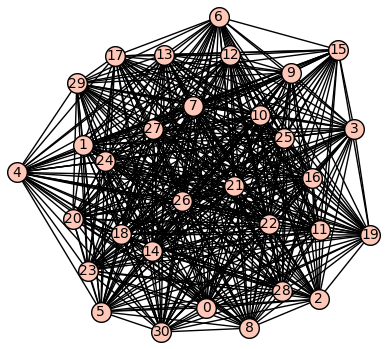

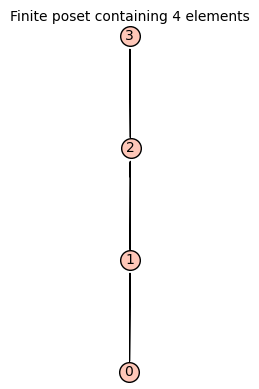

In [23]:
RR = routes(D)
print("Number of routes:", len(RR))
G = compatibility_graph_of_routes(D, F)
G.show()

framing_lattice(D, F)

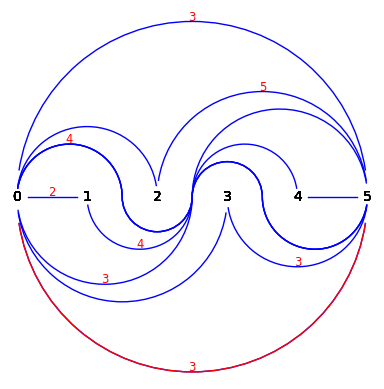

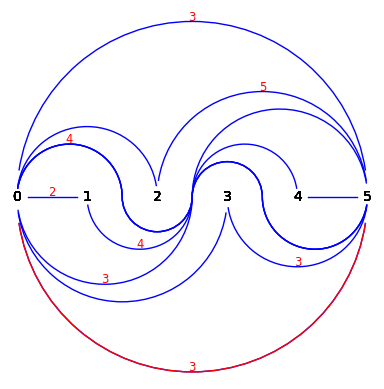

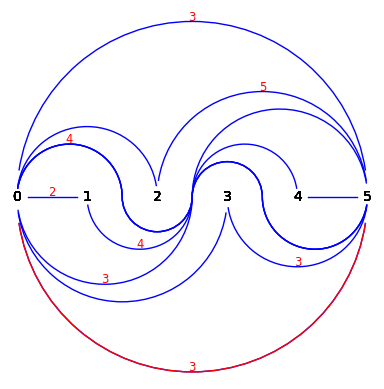

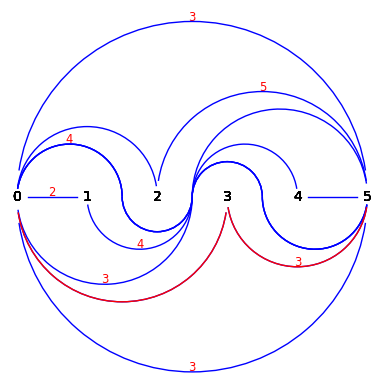

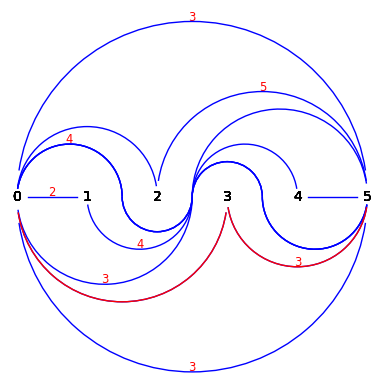

...

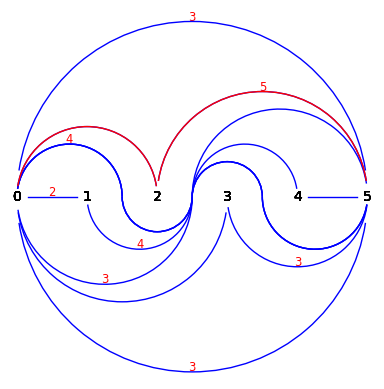

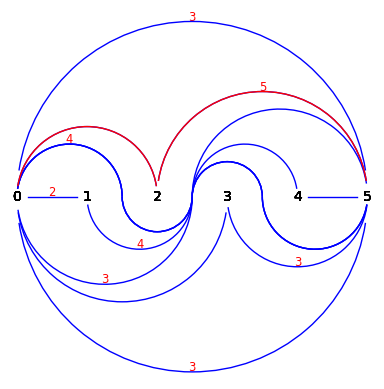

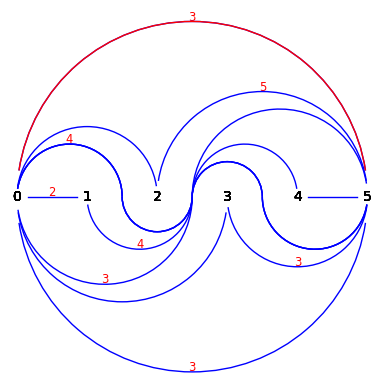

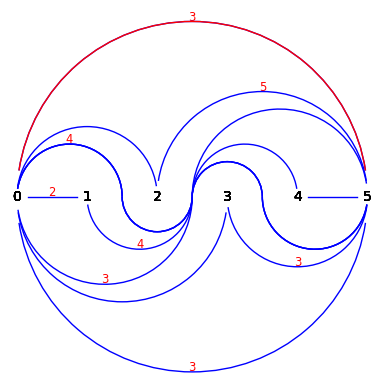

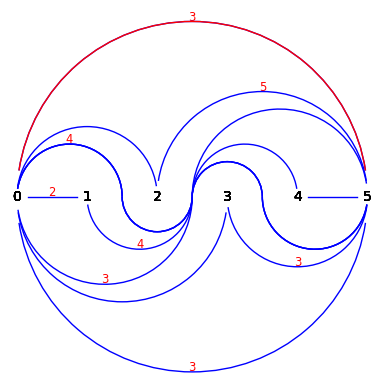

In [251]:
draw_all_routes_non_crossing_arc_diagram(Alpha, already_sorted=True)

# EXAMPLES OF USE

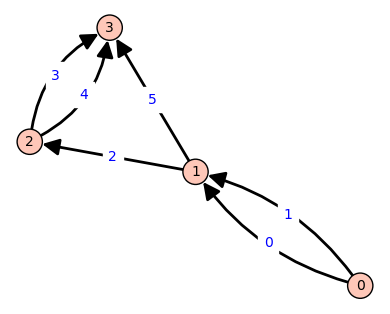

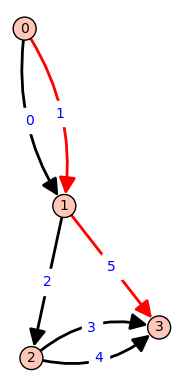

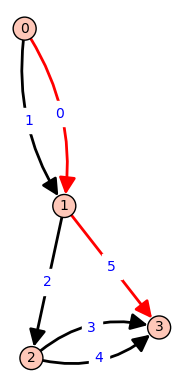

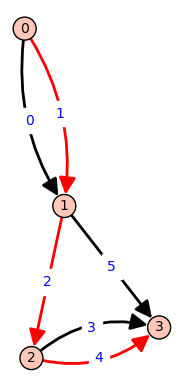

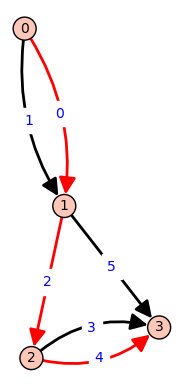

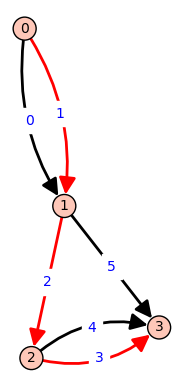

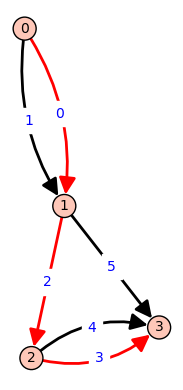

In [7]:
# Doing a simple directed graph and all its routes

D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (1, 2, 2), (1, 3, 5), (2, 3, 3), (2, 3, 4)])
D.show(edge_labels=True)

draw_all_routes(D)

In [8]:
# For the previous graph, we print its routes
for R in routes(D):
    print(R)

# Now we plot the flow polytope
P = flow_polytope(D)
print(P)
P.show()

([1, 5], [0, 1, 3])
([0, 5], [0, 1, 3])
([1, 2, 4], [0, 1, 2, 3])
([0, 2, 4], [0, 1, 2, 3])
([1, 2, 3], [0, 1, 2, 3])
([0, 2, 3], [0, 1, 2, 3])
A 3-dimensional polyhedron in ZZ^6 defined as the convex hull of 6 vertices


Graphics3d Object

[([], [0, 1]), ([0, 1], [2, 5]), ([2], [3, 4]), ([3, 4, 5], [])]


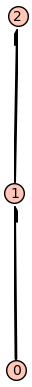

In [10]:
# lets do the framing lattice
F = automatic_framing(D)
print(F)

Po = framing_lattice(D, F)
Po.show()

# Oruga Examples

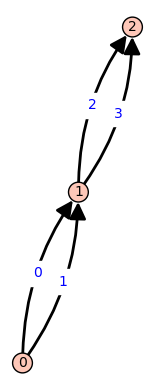

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [])]

([1, 3], [0, 1, 2])
([0, 3], [0, 1, 2])
([1, 2], [0, 1, 2])
([0, 2], [0, 1, 2])

A 2-dimensional polyhedron in ZZ^4 defined as the convex hull of 4 vertices


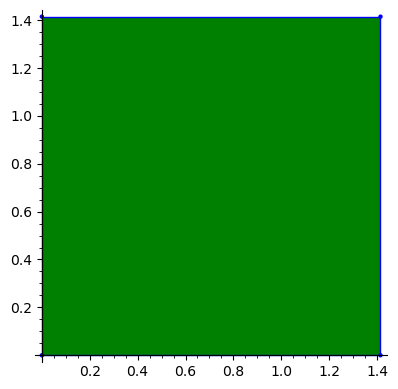

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [])]
Cover relations:
[[1, 0]]



In [270]:
n = 3

D, F = oruga_framed(n)

D.show(edge_labels=True)
print(F)
print()

for R in routes(D):
    print(R)
print()

P = flow_polytope(D)
print(P)
P.show()

PoPo = all_framing_lattices(D, verbose=True)

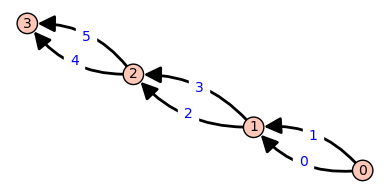

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([4, 5], [])]

([1, 3, 5], [0, 1, 2, 3])
([0, 3, 5], [0, 1, 2, 3])
([1, 2, 5], [0, 1, 2, 3])
([0, 2, 5], [0, 1, 2, 3])
([1, 3, 4], [0, 1, 2, 3])
([0, 3, 4], [0, 1, 2, 3])
([1, 2, 4], [0, 1, 2, 3])
([0, 2, 4], [0, 1, 2, 3])

A 3-dimensional polyhedron in ZZ^6 defined as the convex hull of 8 vertices


Graphics3d Object

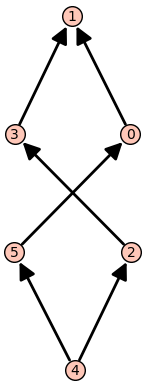

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]
Cover relations:
[[4, 5], [4, 2], [5, 0], [2, 3], [3, 1], [0, 1]]



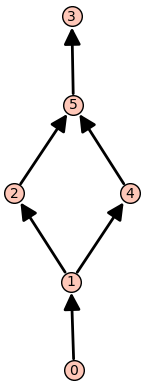

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
Cover relations:
[[0, 1], [1, 2], [1, 4], [2, 5], [4, 5], [5, 3]]



In [24]:
n = 4

D, F = oruga_framed(n)

D.show(edge_labels=True)
print(F)
print()

for R in routes(D):
    print(R)
print()

P = flow_polytope(D)
print(P)
P.show()

PoPo = all_framing_lattices(D, verbose=True)

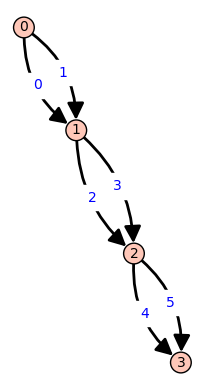

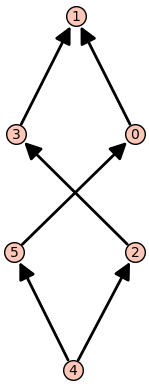

[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [2, 3]), ([2, 3], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [2, 3]), ([2, 3], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [3, 2]), ([3, 2], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [2, 3]), ([2, 3], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([5, 4], [])]



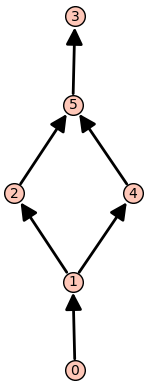

[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [2, 3]), ([3, 2], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([1, 0], [2, 3]), ([3, 2], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [3, 2]), ([2, 3], [4, 5]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [2, 3]), ([3, 2], [5, 4]), ([5, 4], [])]
[([], [1, 0]), ([0, 1], [2, 3]), ([3, 2], [4, 5]), ([5, 4], [])]



In [39]:
n = 4

D, F = oruga_framed(n)

D.show(edge_labels=True)

PoPo = []
PoMem= []


for F in all_framings_iterator(D):
    Po = framing_lattice(D, F)
    if all(not Q.is_isomorphic(Po) for Q in PoPo):
        PoPo.append(Poset(Po))
        PoMem.append([list(F)])
    else:
        i = min(i for i in range(len(PoPo)) if PoPo[i].is_isomorphic(Po))
        PoMem[i].append(list(F))

for i in range(len(PoPo)):
    PoPo[i].show()
    for F in PoMem[i]:
        print(F)
    print()

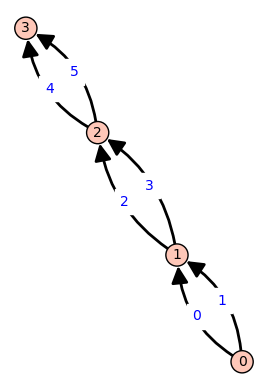

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([4, 5], [])]

([1, 3, 5], [0, 1, 2, 3])
([0, 3, 5], [0, 1, 2, 3])
([1, 2, 5], [0, 1, 2, 3])
([0, 2, 5], [0, 1, 2, 3])
([1, 3, 4], [0, 1, 2, 3])
([0, 3, 4], [0, 1, 2, 3])
([1, 2, 4], [0, 1, 2, 3])
([0, 2, 4], [0, 1, 2, 3])

A 3-dimensional polyhedron in ZZ^6 defined as the convex hull of 8 vertices


Graphics3d Object

0 [[1, 3, 5], [1, 3, 4], [0, 3, 4], [0, 2, 4]]
1 [[1, 3, 5], [1, 3, 4], [1, 2, 4], [0, 2, 4]]
2 [[1, 3, 5], [1, 2, 5], [0, 2, 5], [0, 2, 4]]
3 [[1, 3, 5], [1, 2, 5], [1, 2, 4], [0, 2, 4]]
4 [[1, 3, 5], [0, 3, 5], [0, 2, 5], [0, 2, 4]]
5 [[1, 3, 5], [0, 3, 5], [0, 3, 4], [0, 2, 4]]


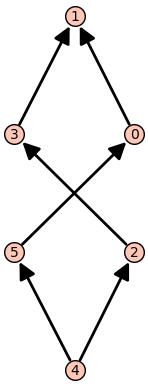

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]
Cover relations:
[[4, 5], [4, 2], [5, 0], [2, 3], [3, 1], [0, 1]]



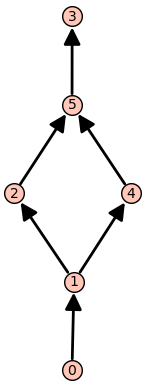

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
Cover relations:
[[0, 1], [1, 2], [1, 4], [2, 5], [4, 5], [5, 3]]



In [29]:
n = 4

D, F = oruga_framed(n)

D.show(edge_labels=True)
print(F)
print()

for R in routes(D):
    print(R)
print()

P = flow_polytope(D)
print(P)
P.show()

CC = list(cliques_of_routes_iterator(D, F))

k = 0
for C in CC:
    print(k, [R[0] for R in C])
    k += 1

PoPo = all_framing_lattices(D, verbose=True)

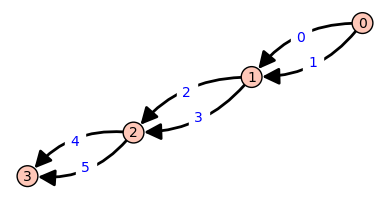

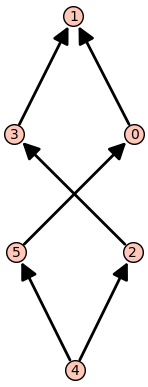

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [])]
Cover relations:
[[4, 5], [4, 2], [5, 0], [2, 3], [3, 1], [0, 1]]



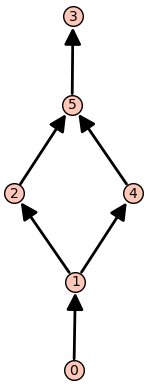

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
Cover relations:
[[0, 1], [1, 2], [1, 4], [2, 5], [4, 5], [5, 3]]

15h57: Done


In [23]:
n = 4

D, F = oruga_framed(n)

D.show(edge_labels=True)

PoPo = all_framing_lattices(D, verbose=True, super_verbose=True)

print(time_show(), 'Done')

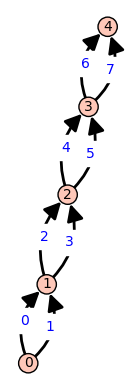

15h31: Start


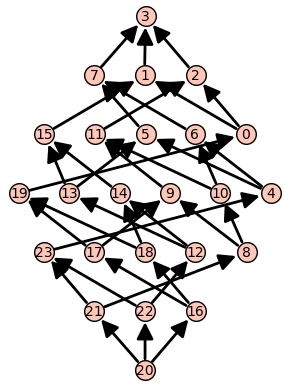

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [7, 6]), ([7, 6], [])]



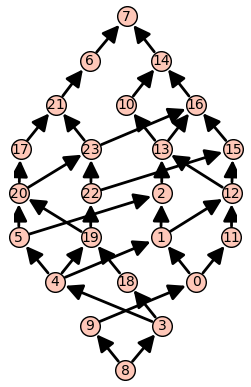

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([4, 5], [7, 6]), ([7, 6], [])]



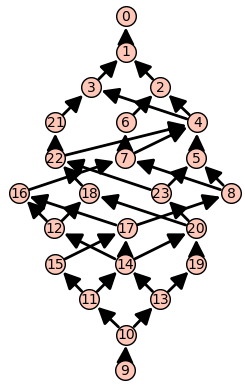

For possible framing:
[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([4, 5], [7, 6]), ([7, 6], [])]



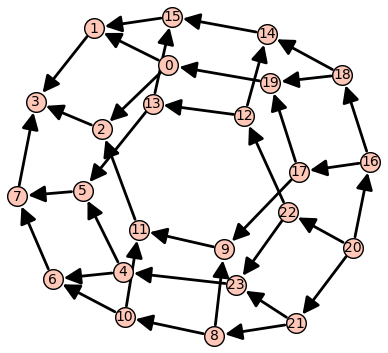

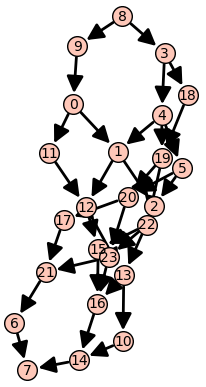

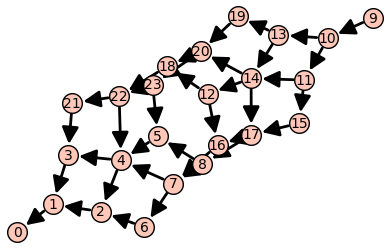

15h31: Done


In [78]:
n = 5

D, F = oruga_framed(n)

D.show(edge_labels=True)

print(time_show(), 'Start')

PoPo = all_framing_lattices(D, verbose=True, super_verbose=True)
for Po in PoPo:
    DiGraph(Po.cover_relations()).show()

print(time_show(), 'Done')

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([4, 5], [6, 7]), ([6, 7], [8, 9]), ([8, 9], [])]


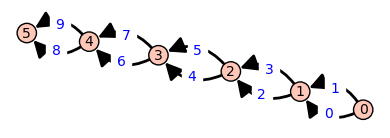

20h46: Start


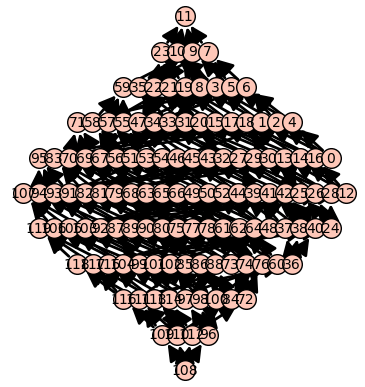

[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [7, 6]), ([7, 6], [9, 8]), ([9, 8], [])]



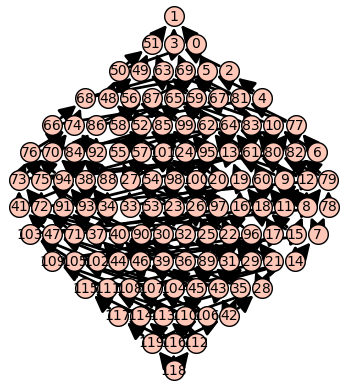

[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([5, 4], [7, 6]), ([6, 7], [9, 8]), ([9, 8], [])]



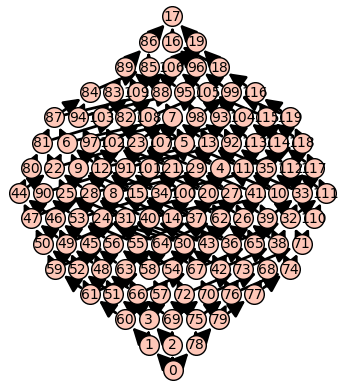

[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([4, 5], [7, 6]), ([7, 6], [9, 8]), ([9, 8], [])]



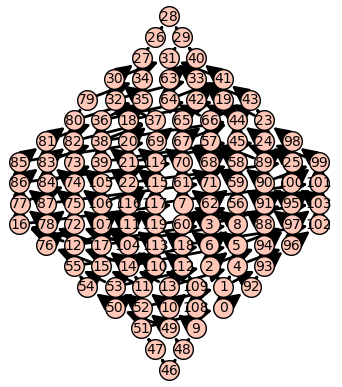

[([], [1, 0]), ([1, 0], [3, 2]), ([3, 2], [5, 4]), ([4, 5], [7, 6]), ([6, 7], [9, 8]), ([9, 8], [])]



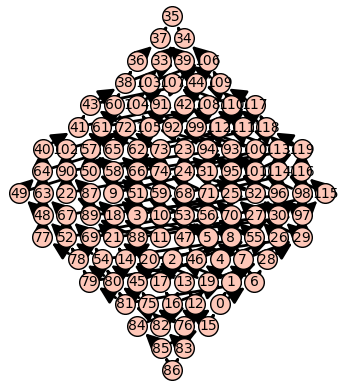

[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [7, 6]), ([6, 7], [9, 8]), ([9, 8], [])]



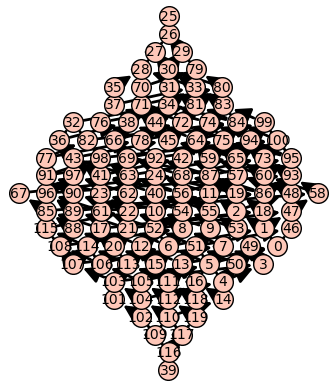

[([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([4, 5], [7, 6]), ([6, 7], [9, 8]), ([9, 8], [])]

20h48: Done


In [58]:
n = 6

D, F = oruga_framed(n)
print(F)

D.show(edge_labels=True)

print(time_show(), 'Start')

PoPo = []

for F in all_framings_iterator(D):
    if F[1][0] == F[0][1] and F[-2][1] == F[-1][0]:
        Po = framing_lattice(D, F)
        if all(not Q.is_isomorphic(Po) for Q in PoPo):
            Po.show()
            print(F)
            print()
            PoPo.append(Poset(Po))

#PoPo = all_framing_lattices(D, verbose=True, super_verbose=True)

print(time_show(), 'Done')

In [65]:
print(time_showshow())
print(len(PoPo))

21h52:
10


In [67]:
for Po in PoPo:
    print("graded:", Po.is_graded())
    print("self-dual:", Po.is_self_dual())
    print()

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True

graded: True
self-dual: True



In [68]:
for Po in PoPo:
    print(linear_intervals_enumerator(DiGraph(Po.cover_relations())))

KeyboardInterrupt: 

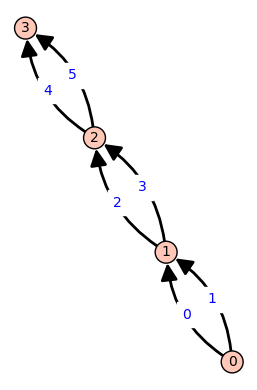

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([4, 5], [])]

([1, 3, 5], [0, 1, 2, 3])
([0, 3, 5], [0, 1, 2, 3])
([1, 2, 5], [0, 1, 2, 3])
([0, 2, 5], [0, 1, 2, 3])
([1, 3, 4], [0, 1, 2, 3])
([0, 3, 4], [0, 1, 2, 3])
([1, 2, 4], [0, 1, 2, 3])
([0, 2, 4], [0, 1, 2, 3])

0 [[1, 3, 5], [1, 3, 4], [0, 3, 4], [0, 2, 4]]
1 [[1, 3, 5], [1, 3, 4], [1, 2, 4], [0, 2, 4]]
2 [[1, 3, 5], [1, 2, 5], [0, 2, 5], [0, 2, 4]]
3 [[1, 3, 5], [1, 2, 5], [1, 2, 4], [0, 2, 4]]
4 [[1, 3, 5], [0, 3, 5], [0, 2, 5], [0, 2, 4]]
5 [[1, 3, 5], [0, 3, 5], [0, 3, 4], [0, 2, 4]]

[([], [0, 1]), ([0, 1], [2, 3]), ([2, 3], [4, 5]), ([4, 5], [])]


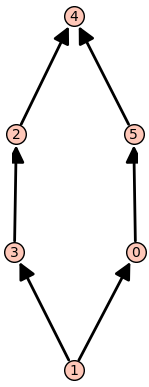


[([], [0, 1]), ([0, 1], [3, 2]), ([2, 3], [4, 5]), ([4, 5], [])]


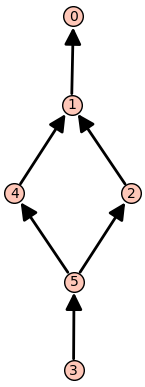

0 [[0, 3, 5], [1, 2, 5], [0, 2, 5], [0, 2, 4]]
1 [[0, 3, 5], [1, 2, 5], [1, 2, 4], [0, 2, 4]]
2 [[0, 3, 5], [0, 3, 4], [1, 2, 4], [0, 2, 4]]
3 [[1, 3, 5], [1, 3, 4], [0, 3, 4], [1, 2, 4]]
4 [[1, 3, 5], [0, 3, 5], [1, 2, 5], [1, 2, 4]]
5 [[1, 3, 5], [0, 3, 5], [0, 3, 4], [1, 2, 4]]


In [35]:
n = 4

D, F = oruga_framed(n)

D.show(edge_labels=True)
print(F)
print()

for R in routes(D):
    print(R)
print()

CC = list(cliques_of_routes_iterator(D, F))

k = 0
for C in CC:
    print(k, [R[0] for R in C])
    k += 1

print()
print(F)
framing_lattice(D, F).show()

F[1] = ([0, 1], [3, 2])
print()
print(F)
framing_lattice(D, F).show()

CC = list(cliques_of_routes_iterator(D, F))

k = 0
for C in CC:
    print(k, [R[0] for R in C])
    k += 1


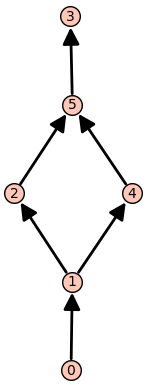

0 [[0, 2, 5], [0, 3, 4], [0, 3, 5], [1, 3, 5]]
1 [[0, 2, 5], [0, 3, 4], [1, 3, 4], [1, 3, 5]]
2 [[0, 2, 4], [0, 2, 5], [0, 3, 4], [1, 3, 4]]
3 [[0, 2, 4], [1, 2, 4], [1, 2, 5], [1, 3, 4]]
4 [[0, 2, 5], [1, 2, 5], [1, 3, 4], [1, 3, 5]]
5 [[0, 2, 4], [0, 2, 5], [1, 2, 5], [1, 3, 4]]


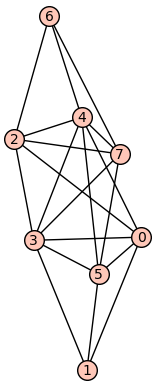

0 [1, 3, 5]
1 [0, 3, 5]
2 [1, 2, 5]
3 [0, 2, 5]
4 [1, 3, 4]
5 [0, 3, 4]
6 [1, 2, 4]
7 [0, 2, 4]


In [19]:
F = [([], [1, 0]), ([1, 0], [3, 2]), ([2, 3], [5, 4]), ([5, 4], [])]
Po = framing_lattice(D, F)
Po.show()
CC = [[X[0] for X in C] for C in cliques_of_routes_iterator(D, F)]
i = 0
for C in CC:
    C.sort()
    print(i, C)
    i += 1
G = compatibility_graph_of_routes(D, F)
G.show()
RR = routes(D)
i = 0
for R in RR:
    print(i, R[0])
    i += 1

In [21]:
G.num_edges()

19

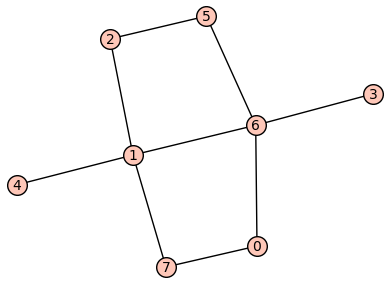

In [20]:
H = G.complement()
H.show()

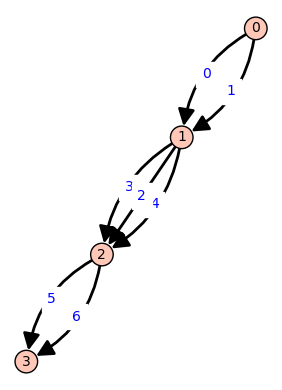

[([], [0, 1]), ([0, 1], [2, 3, 4]), ([2, 3, 4], [5, 6]), ([5, 6], [])]



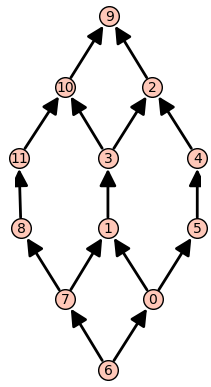

In [19]:
L = [2, 3, 2]

D, F = multi_oruga_framed(L)

D.show(edge_labels=True)
print(F)
print()

Po = framing_lattice(D, F)
Po.show()

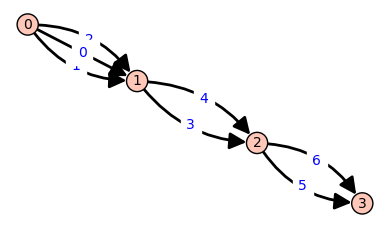

[([], [0, 1, 2]), ([0, 1, 2], [3]), ([3], [4, 5, 6]), ([4, 5, 6], [])]

([2, 4, 6], [0, 1, 2, 3])
([1, 4, 6], [0, 1, 2, 3])
([0, 4, 6], [0, 1, 2, 3])
([2, 3, 6], [0, 1, 2, 3])
([1, 3, 6], [0, 1, 2, 3])
([0, 3, 6], [0, 1, 2, 3])
([2, 4, 5], [0, 1, 2, 3])
([1, 4, 5], [0, 1, 2, 3])
([0, 4, 5], [0, 1, 2, 3])
([2, 3, 5], [0, 1, 2, 3])
([1, 3, 5], [0, 1, 2, 3])
([0, 3, 5], [0, 1, 2, 3])

A 4-dimensional polyhedron in ZZ^7 defined as the convex hull of 12 vertices


Graphics3d Object

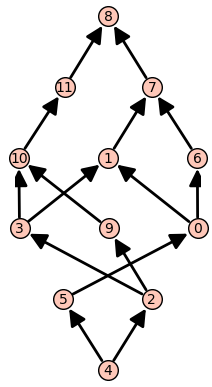

For possible framing:
[([], [2, 1, 0]), ([2, 1, 0], [4, 3]), ([4, 3], [6, 5]), ([6, 5], [])]
Cover relations:
[[4, 5], [4, 2], [5, 0], [2, 3], [2, 9], [3, 10], [3, 1], [9, 10], [10, 11], [11, 8], [0, 1], [0, 6], [1, 7], [6, 7], [7, 8]]



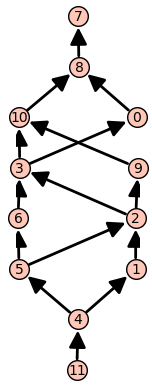

For possible framing:
[([], [2, 1, 0]), ([2, 1, 0], [4, 3]), ([3, 4], [6, 5]), ([6, 5], [])]
Cover relations:
[[11, 4], [4, 5], [4, 1], [5, 6], [5, 2], [6, 3], [1, 2], [2, 3], [2, 9], [3, 10], [3, 0], [9, 10], [10, 8], [0, 8], [8, 7]]



In [274]:
L = [3, 2, 2]

D, F = multi_oruga_framed(L)

D.show(edge_labels=True)
print(F)
print()

for R in routes(D):
    print(R)
print()

P = flow_polytope(D)
print(P)
P.show(layout = "planar")


PoPo = all_framing_lattices(D, verbose=True)

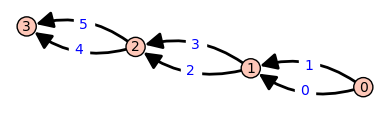

([1, 3, 5], [0, 1, 2, 3])
([0, 3, 5], [0, 1, 2, 3])
([1, 2, 5], [0, 1, 2, 3])
([0, 2, 5], [0, 1, 2, 3])
([1, 3, 4], [0, 1, 2, 3])
([0, 3, 4], [0, 1, 2, 3])
([1, 2, 4], [0, 1, 2, 3])
([0, 2, 4], [0, 1, 2, 3])


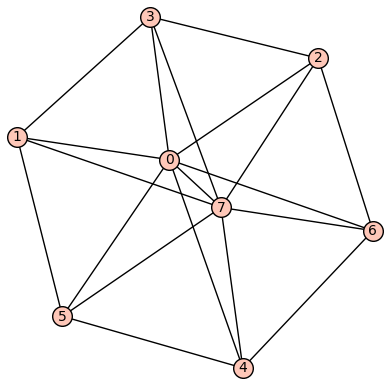

[0, 4, 5, 7]
[0, 4, 6, 7]
[0, 2, 3, 7]
[0, 2, 6, 7]
[0, 1, 3, 7]
[0, 1, 5, 7]

[([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([1, 3, 5], [0, 1, 2, 3]), ([1, 3, 4], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([1, 3, 5], [0, 1, 2, 3]), ([1, 2, 5], [0, 1, 2, 3]), ([1, 2, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 2, 5], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]
[([1, 3, 5], [0, 1, 2, 3]), ([0, 3, 5], [0, 1, 2, 3]), ([0, 3, 4], [0, 1, 2, 3]), ([0, 2, 4], [0, 1, 2, 3])]


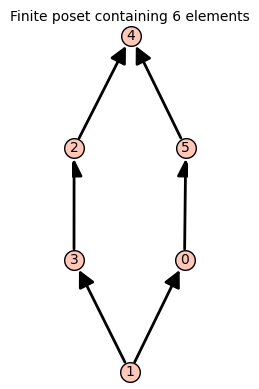

In [16]:
n = 4
D, F = oruga_framed(n)
D.show(edge_labels=True)

RR = routes(D)
for R in RR:
    print(R)

G = compatibility_graph_of_routes(D, F)
G.show()

for C in G.all_cliques():
    print(C)
print()

for C in cliques_of_routes_iterator(D, F):
    print(C) # Remark that this correspond to for C in G.all_cliques(): print([RR[i] for i in C])

framing_lattice(D, F)

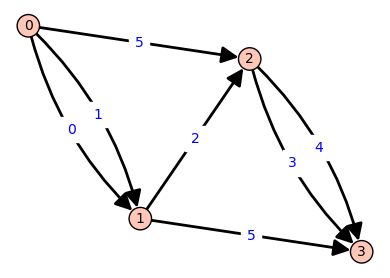

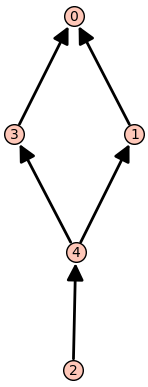

For possible framing:
[([], [1, 0, 5]), ([1, 0], [2, 5]), ([5, 2], [4, 3]), ([5, 4, 3], [])]
Cover relations:
[[2, 4], [4, 3], [4, 1], [3, 0], [1, 0]]



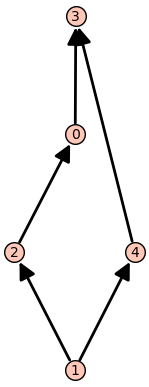

For possible framing:
[([], [1, 0, 5]), ([1, 0], [2, 5]), ([2, 5], [4, 3]), ([5, 4, 3], [])]
Cover relations:
[[1, 2], [1, 4], [2, 0], [4, 3], [0, 3]]



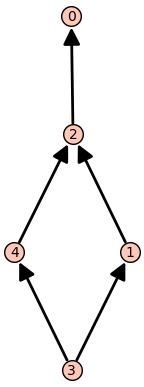

For possible framing:
[([], [1, 0, 5]), ([1, 0], [5, 2]), ([2, 5], [4, 3]), ([5, 4, 3], [])]
Cover relations:
[[3, 4], [3, 1], [4, 2], [1, 2], [2, 0]]



In [18]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (1, 2, 2), (1, 3, 5), (2, 3, 3), (2, 3, 4), (0, 2, 5)])

D.show(edge_labels=True)
PoPo = all_framing_lattices(D, verbose=True)

nb_vertices = 3


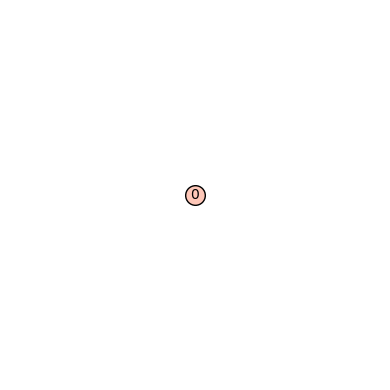

nb_vertices = 4
nb_vertices = 5


In [51]:
# This takes time, please do not execute

# Show all framing lattices one can obtain with DiGraph *without multiple edges* (size <= 5).

PoPo = []

for s in range(3, 6):
    print("nb_vertices =", s)
    for d in digraphs(s):
        if d.is_connected() and d.is_directed_acyclic() and len(d.sources()) == 1 and len(d.sinks()) == 1:
            D = auto_labelling(d)
            #D.show(edge_labels=True)
            #print(len(routes(D)), D.num_edges()-D.num_verts()+1)
            for Po in all_framing_lattices_iterator(D):
                if len(Po) != 0 and all(not Po.is_isomorphic(Q) for Q in PoPo):
                    Po.show()
                    PoPo.append(Po)


In [ ]:
# Yes, there are not so many...

# Now, enjoy and try your own ideas !

0


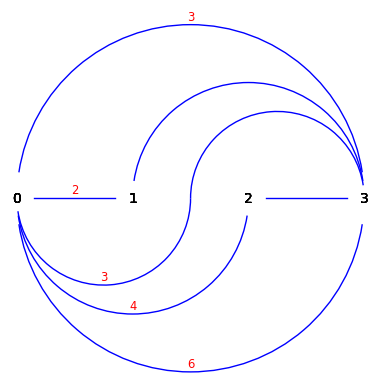

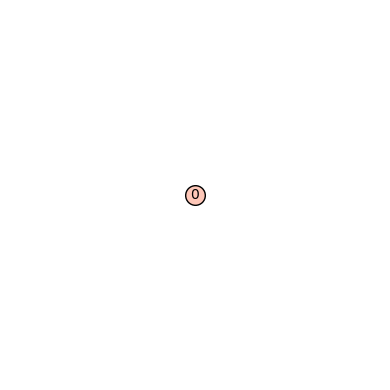

1
2


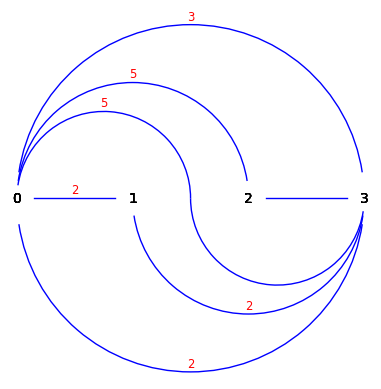

3


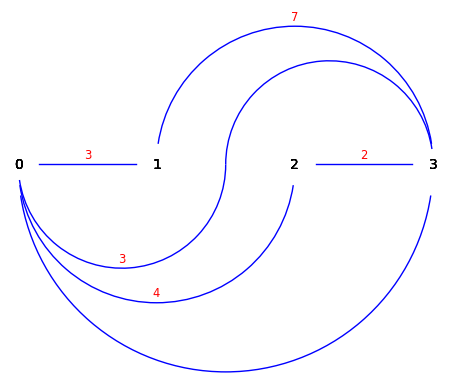

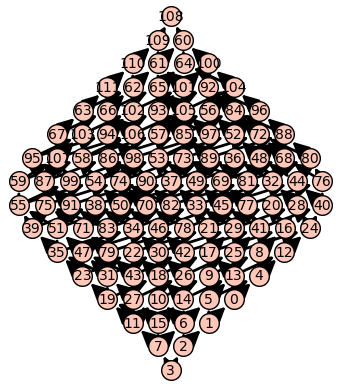

4


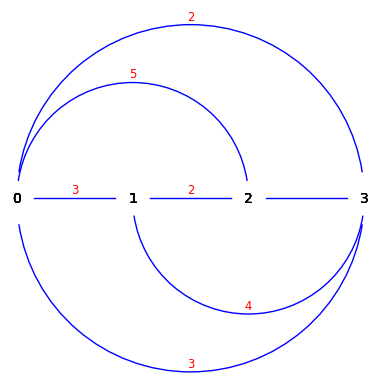

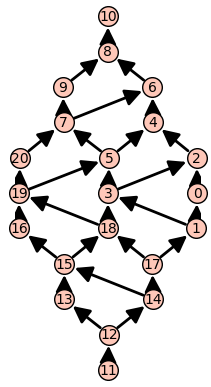

5
6


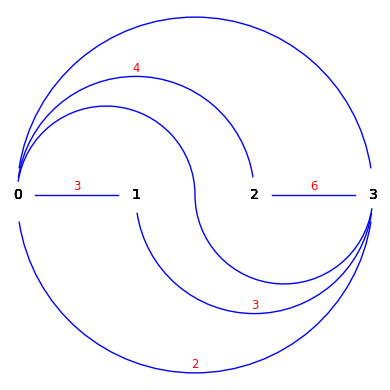

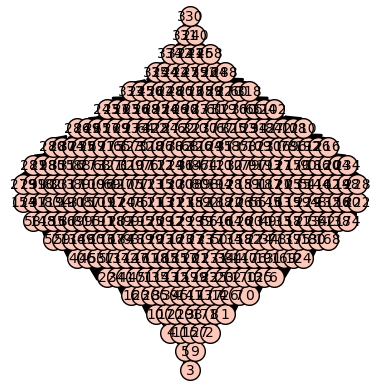

7


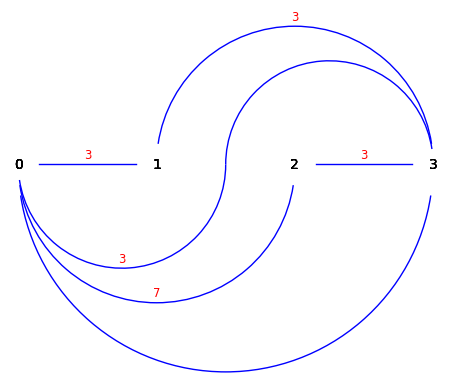

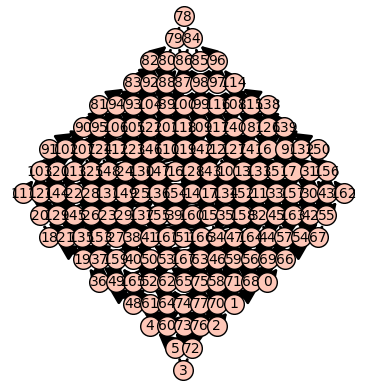

8


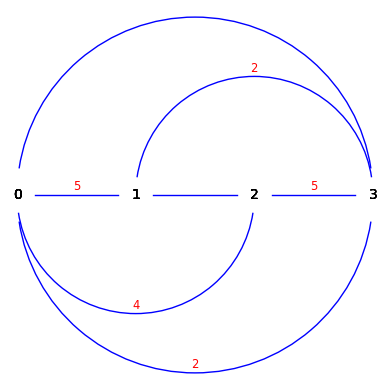

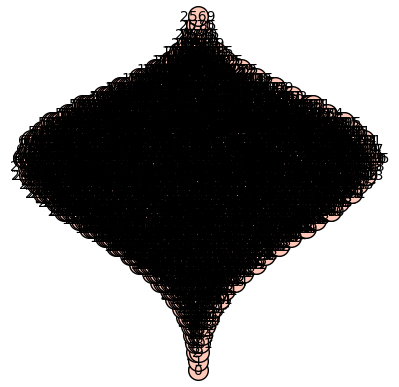

9


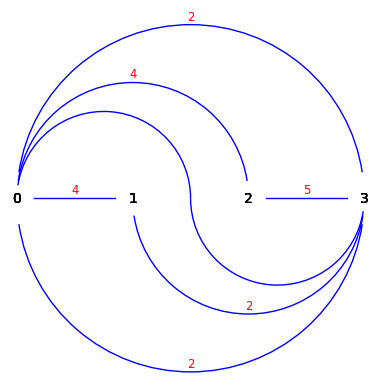

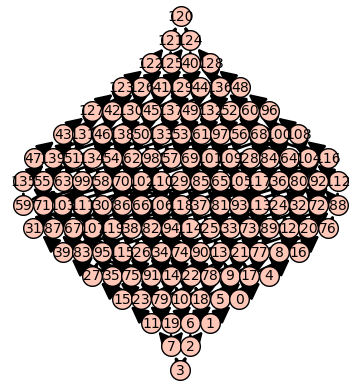

10


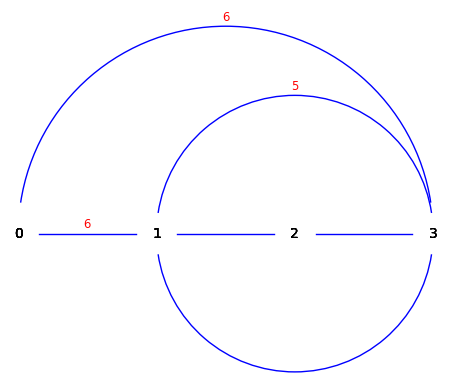

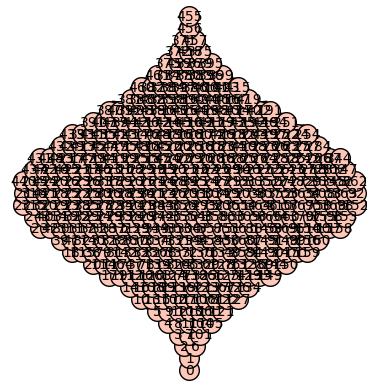

11


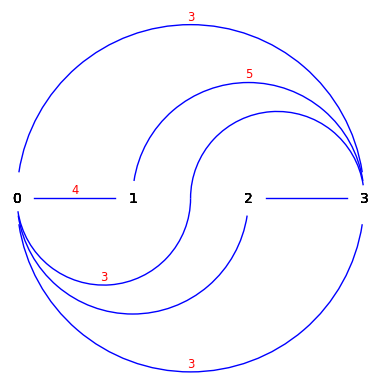

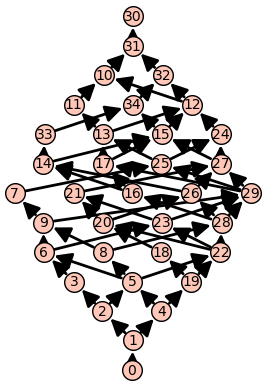

12


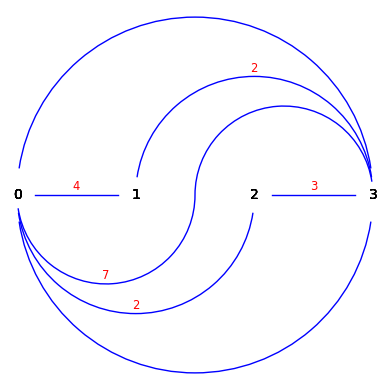

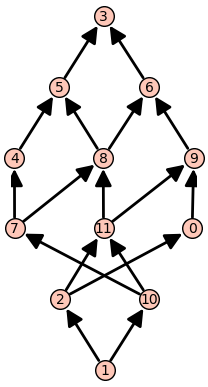

13


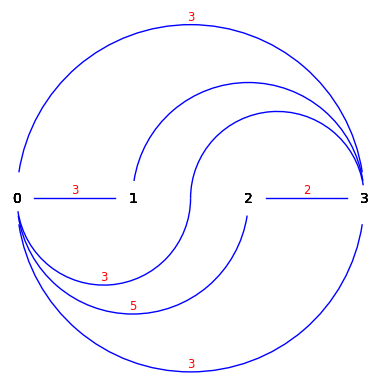

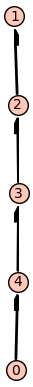

14
15


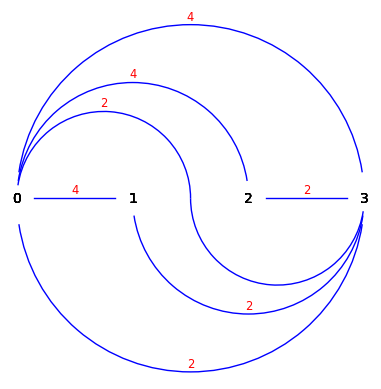

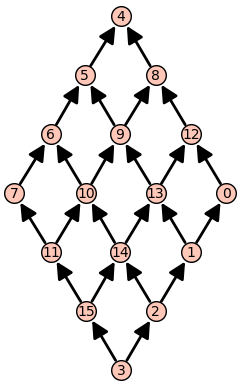

16


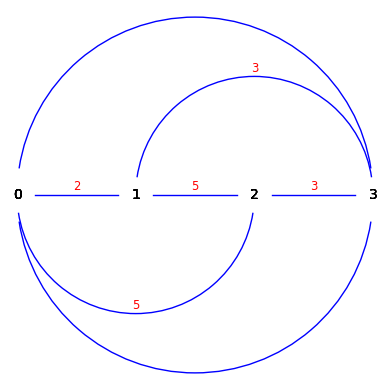

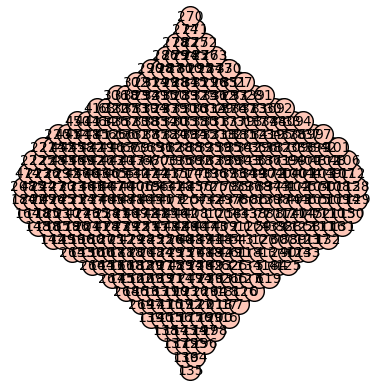

17
18
19
20


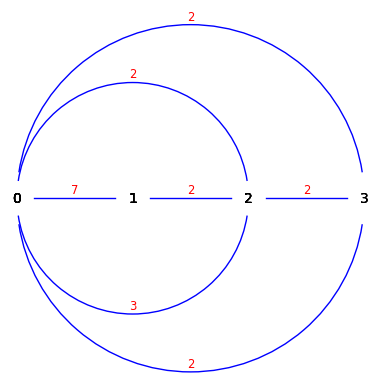

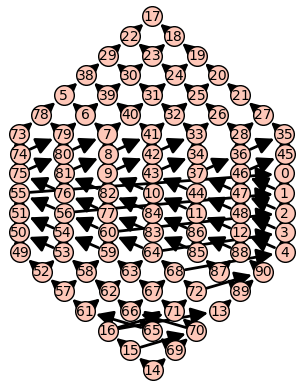

21


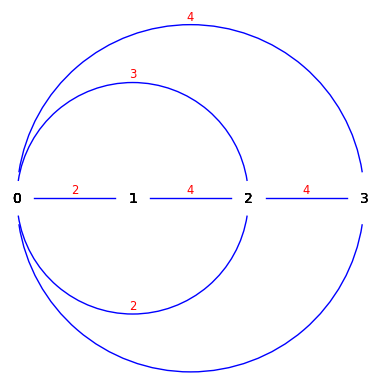

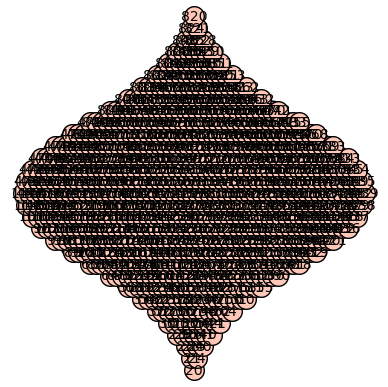

22


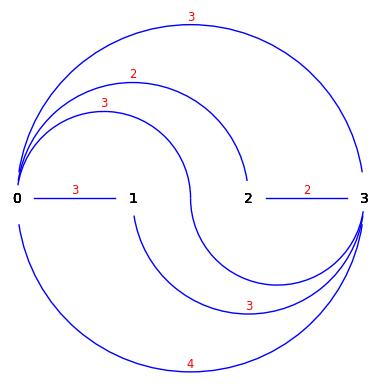

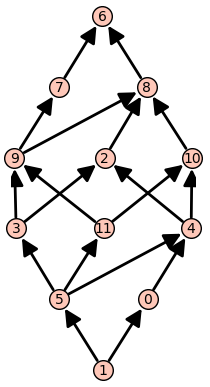

23


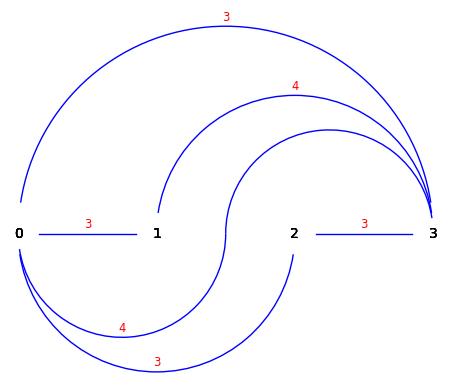

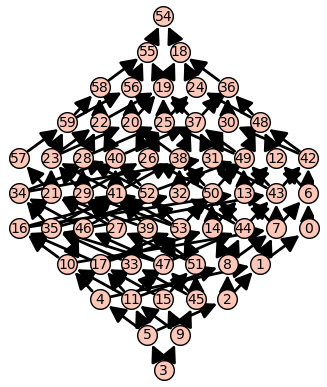

24


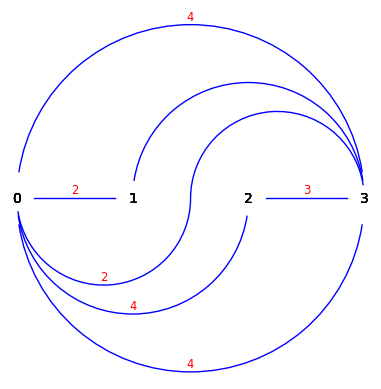

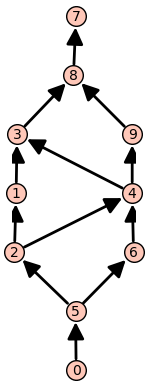

25
26
27


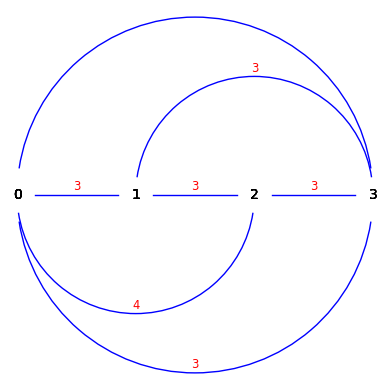

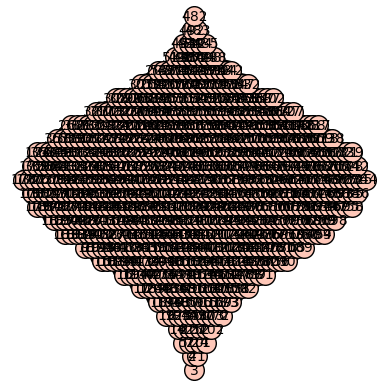

28


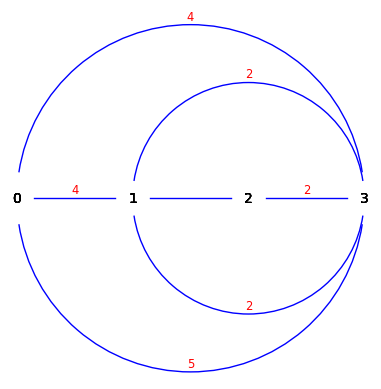

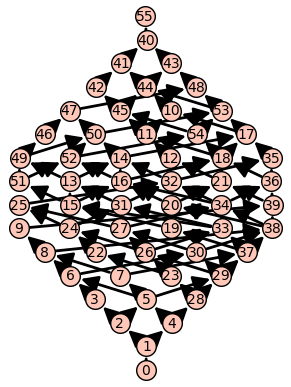

29


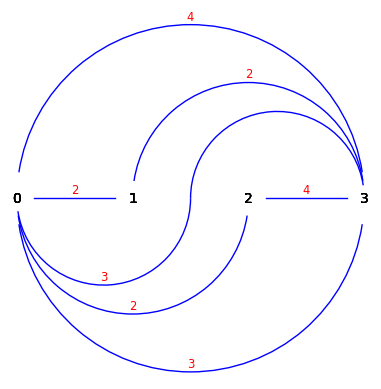

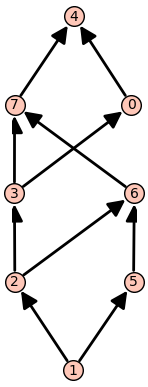

30
31
32
33
34


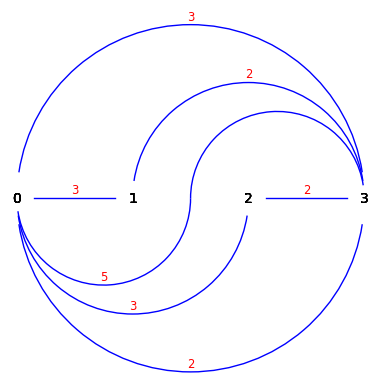

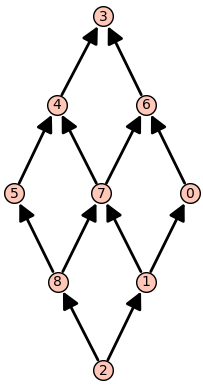

35


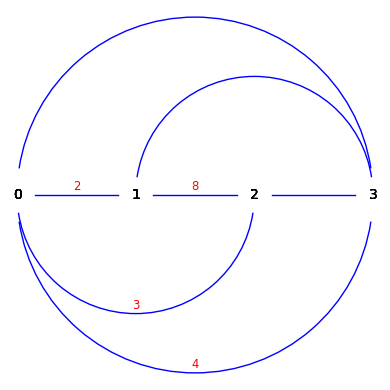

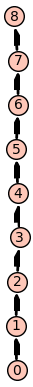

36
37


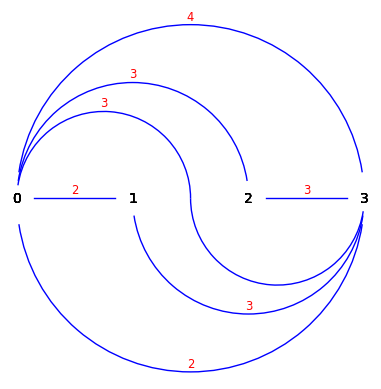

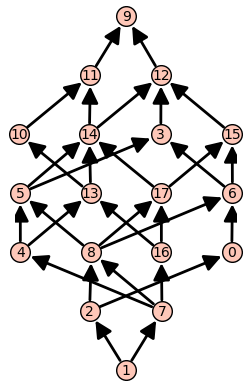

38
39
40


KeyboardInterrupt: 

In [259]:
n = 4
m = 20

PoPo = []
for k in range(1000):
    print(k)
    Alpha = random_non_crossing_arc_diagram(n, m)
    D, F = digraph_and_framing_on_non_crossing_arc_diagram(Alpha, check = True)
    if D != None:
        Po = framing_lattice(D, F)
        if all(not Po.is_isomorphic(Q) for Q in PoPo):
            draw_arc_diagram(Alpha).show(axes=False)
            Po.show()
            PoPo.append(Po)
print(len(PoPo))

0


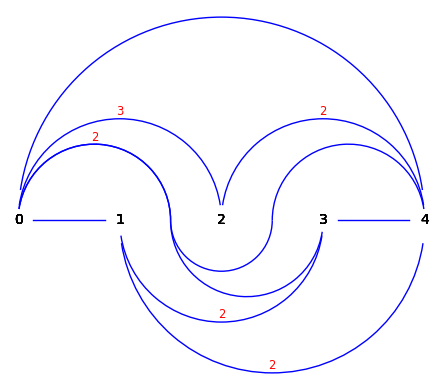

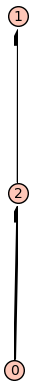

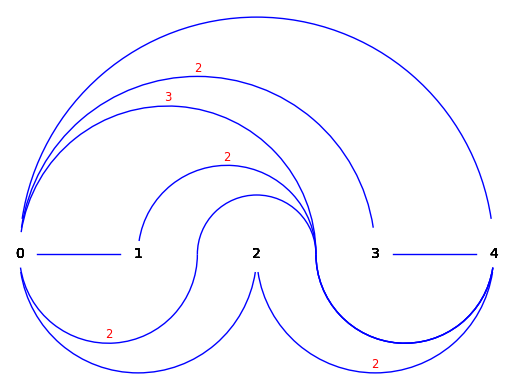

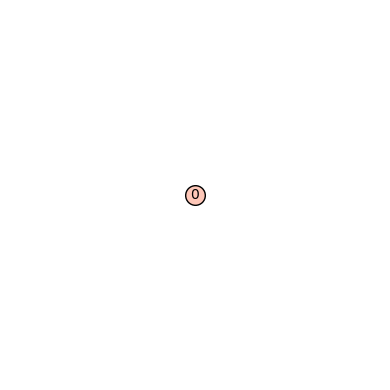

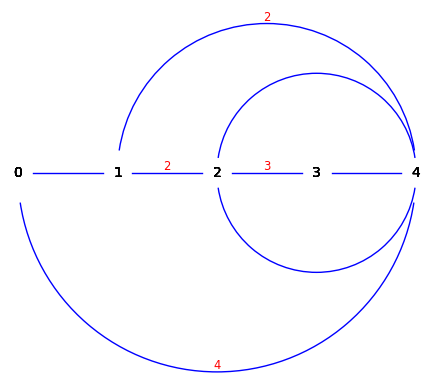

...

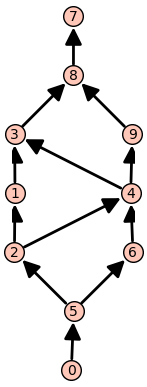

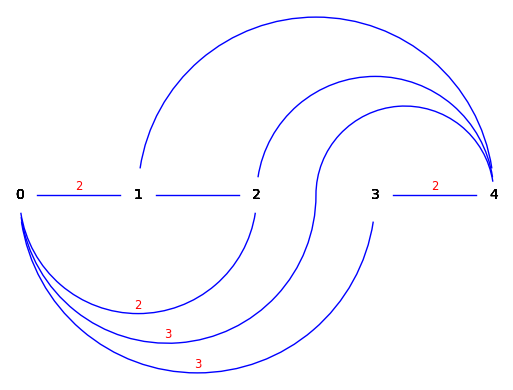

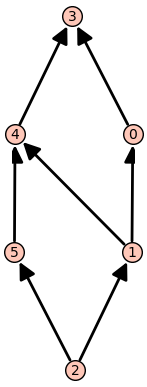

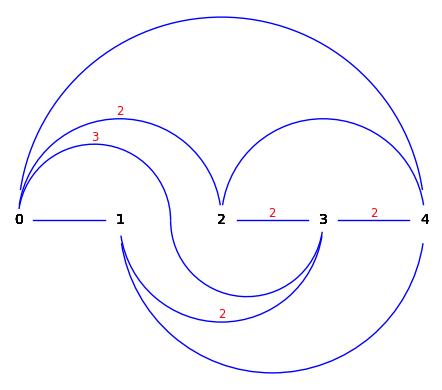

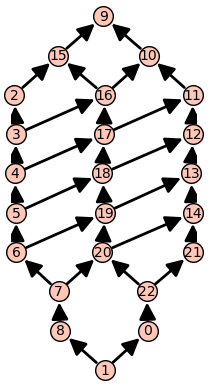

50


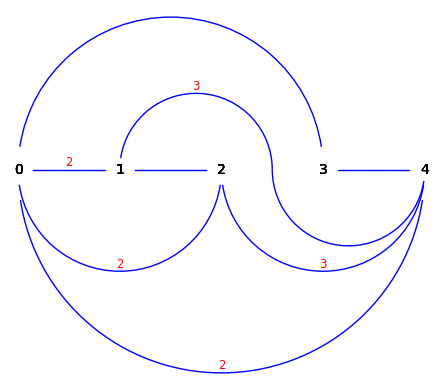

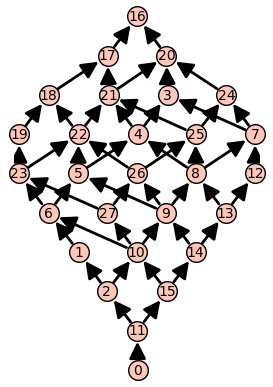

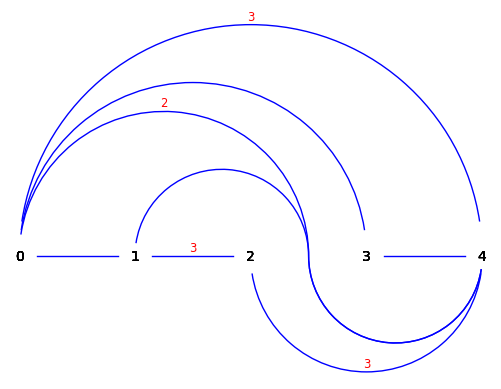

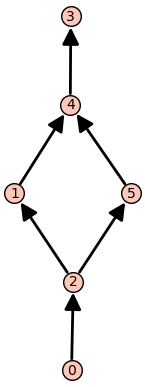

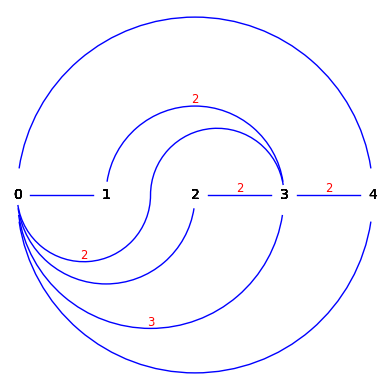

...

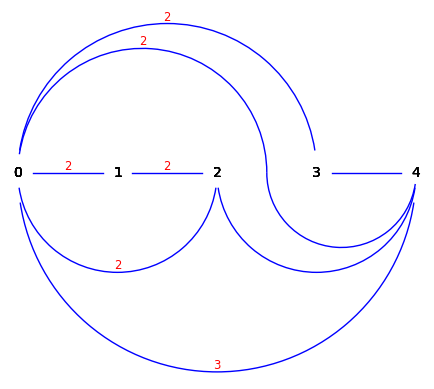

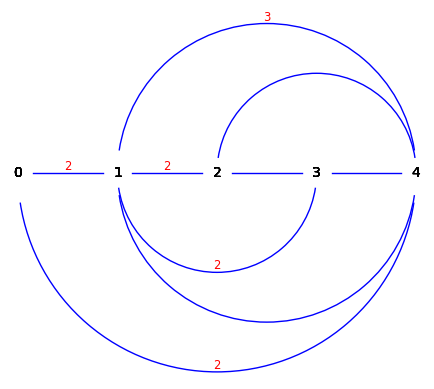

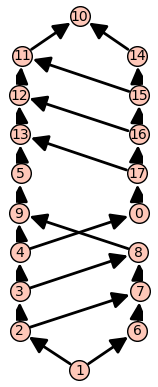

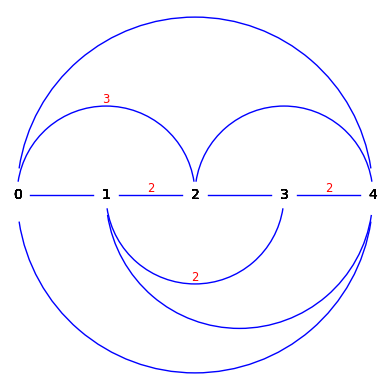

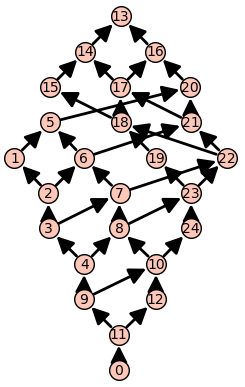

100


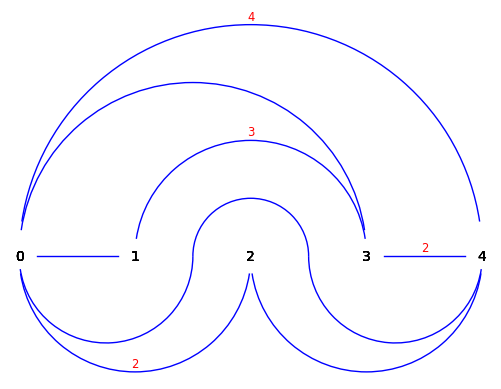

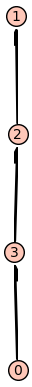

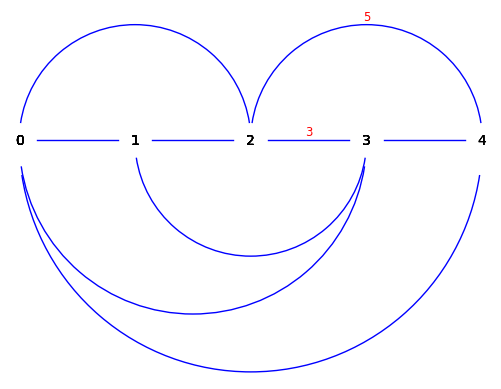

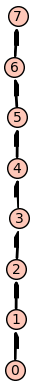

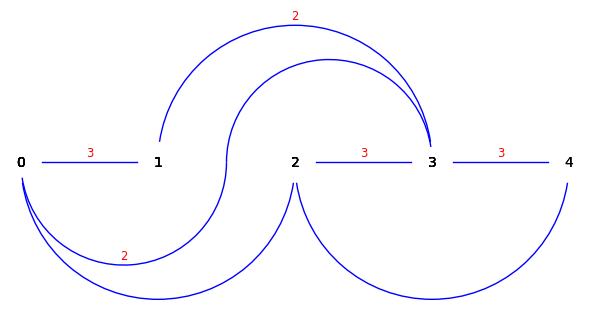

...

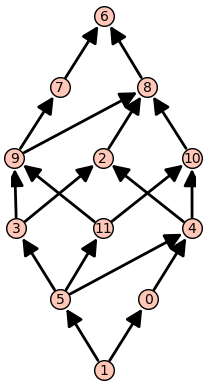

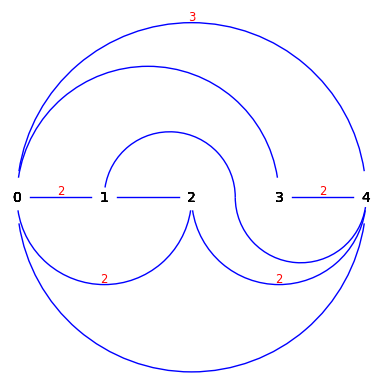

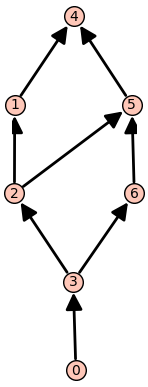

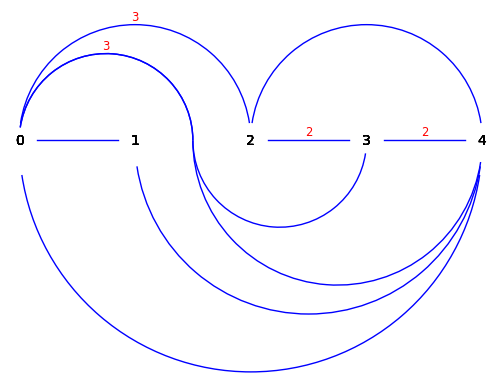

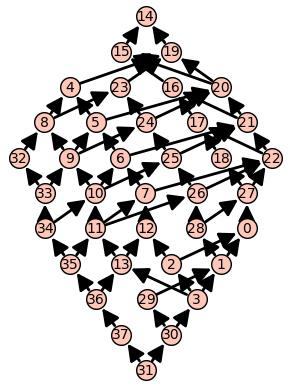

150


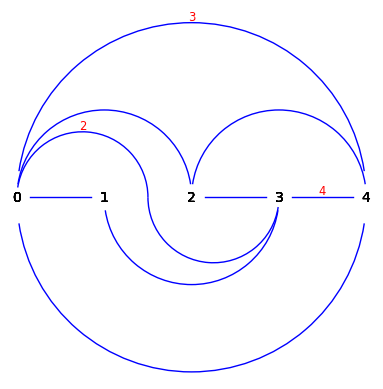

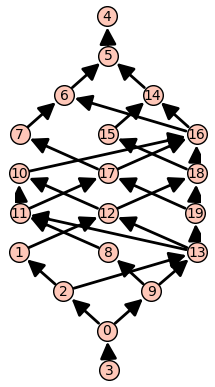

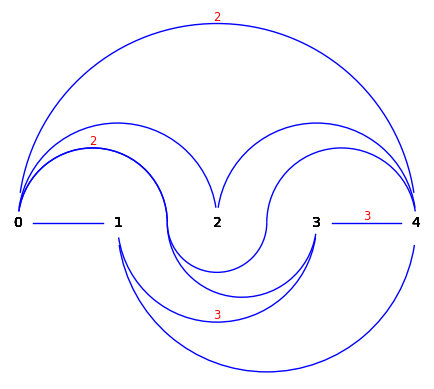

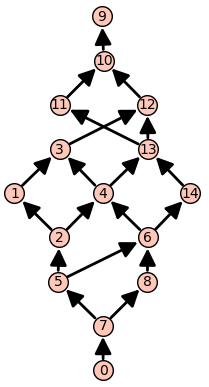

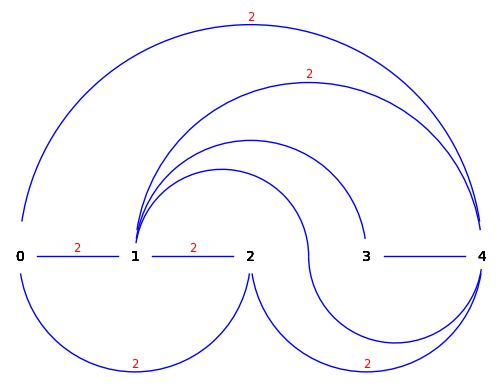

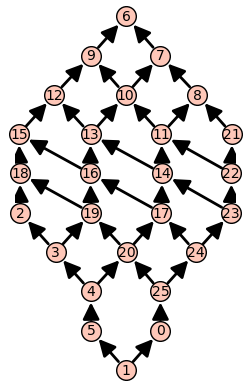

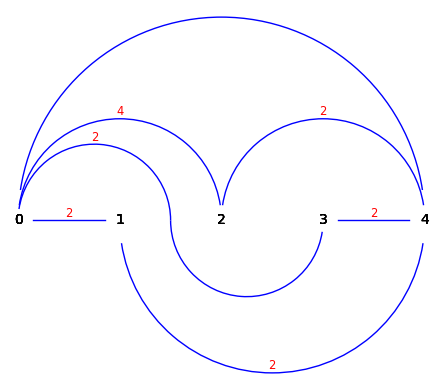

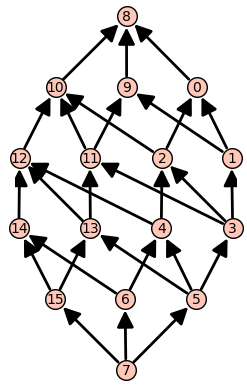

200


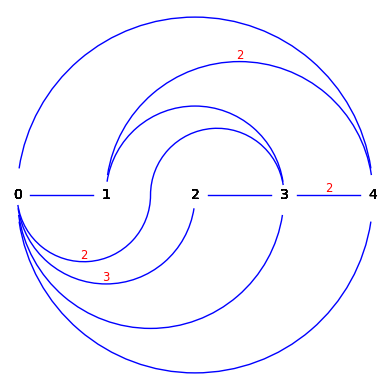

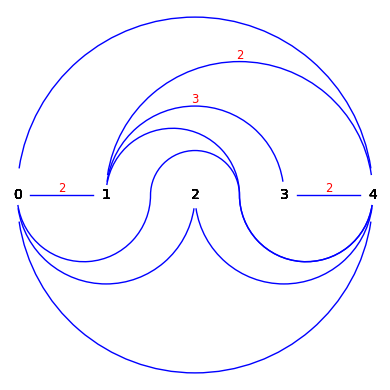

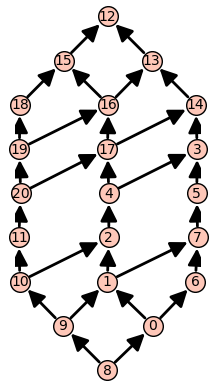

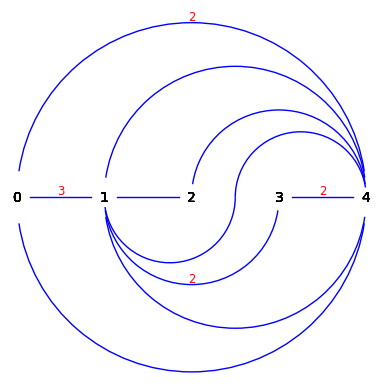

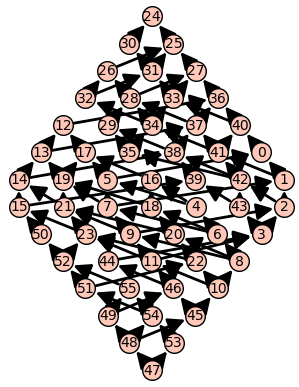

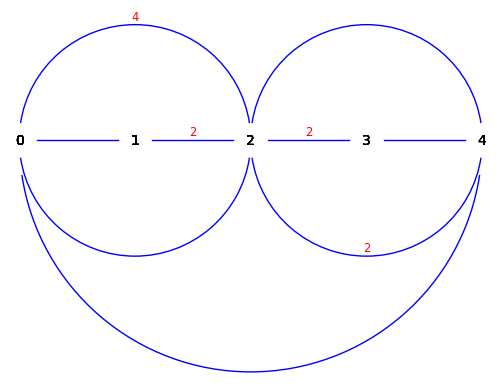

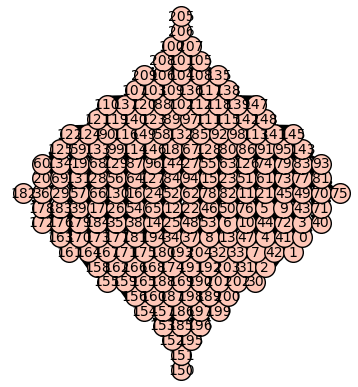

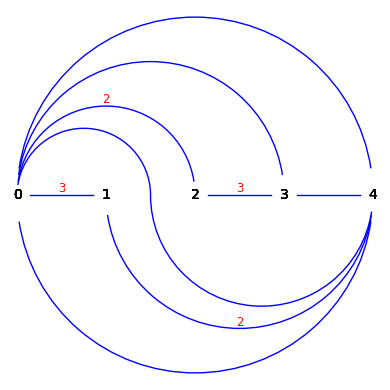

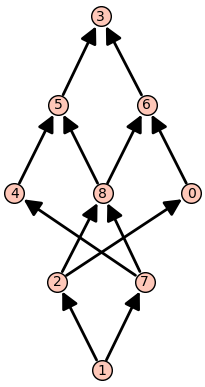

250


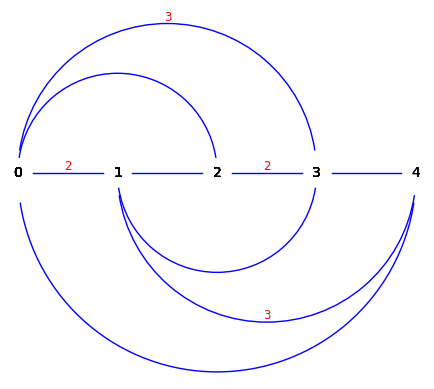

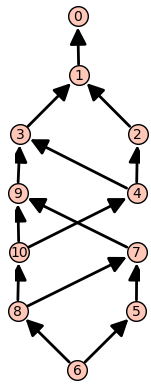

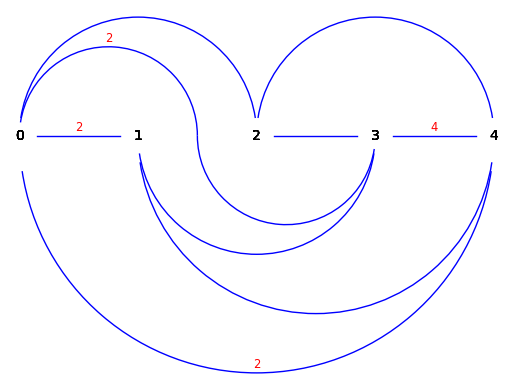

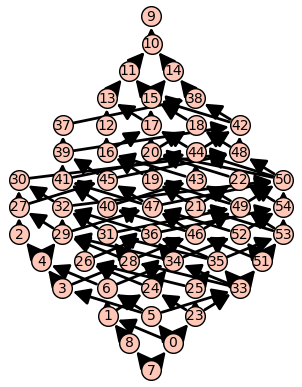

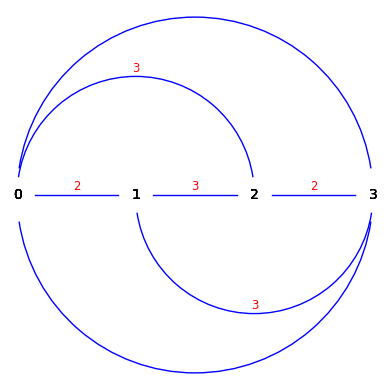

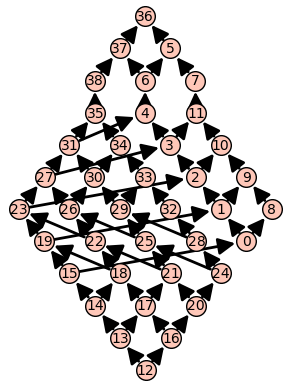

300


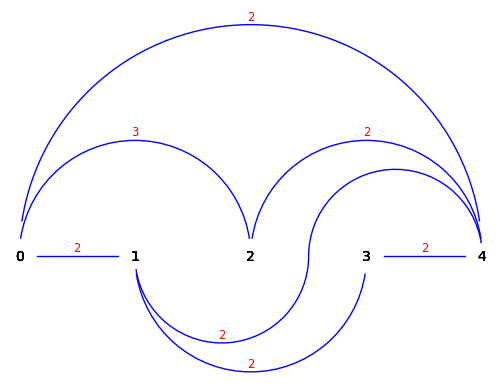

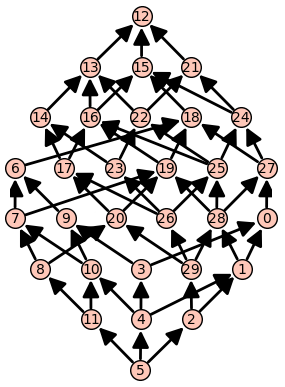

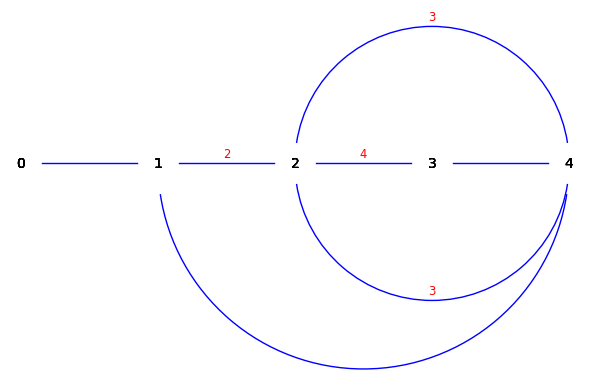

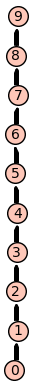

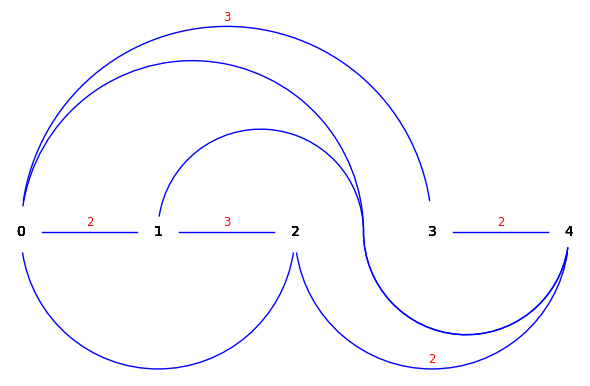

...

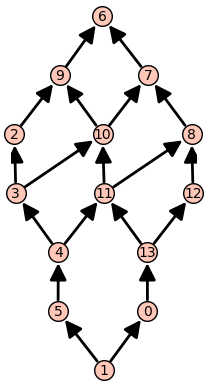

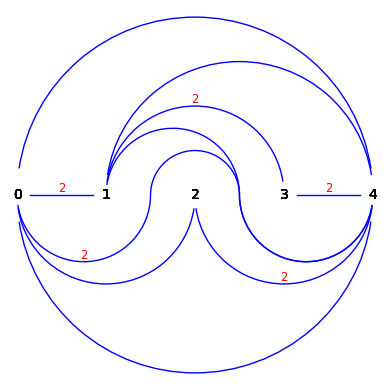

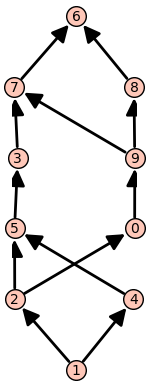

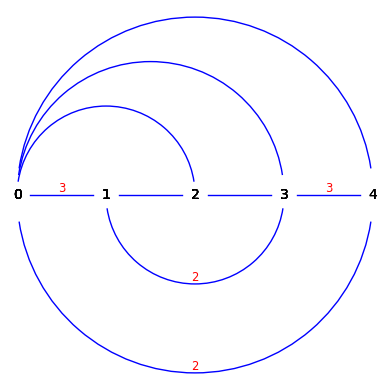

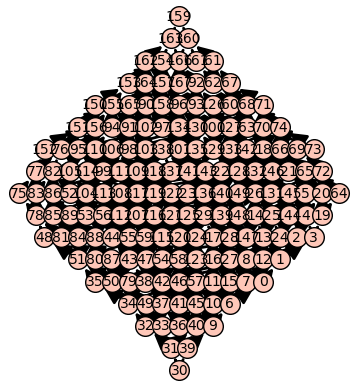

350


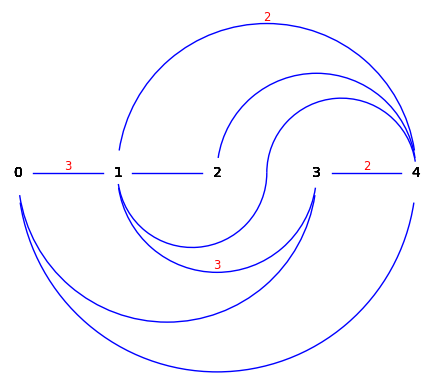

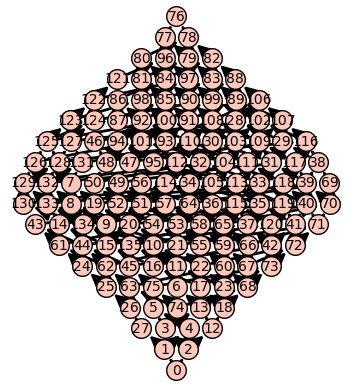

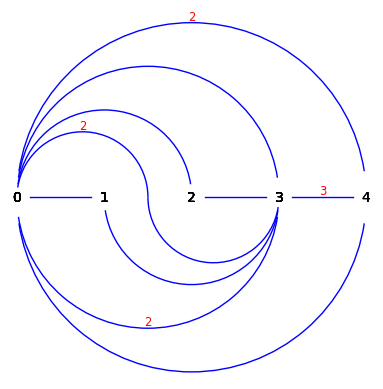

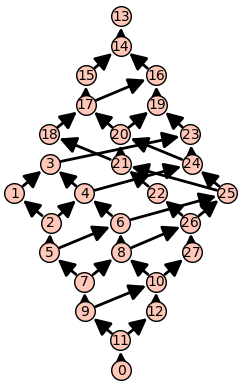

400


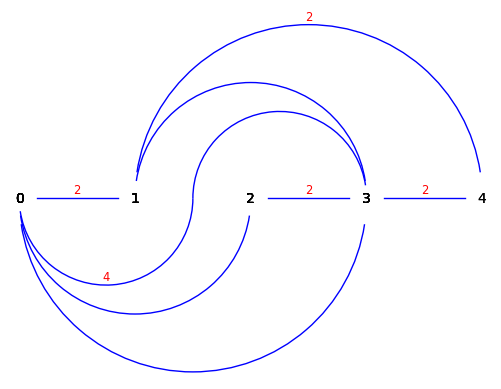

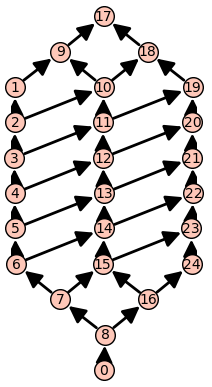

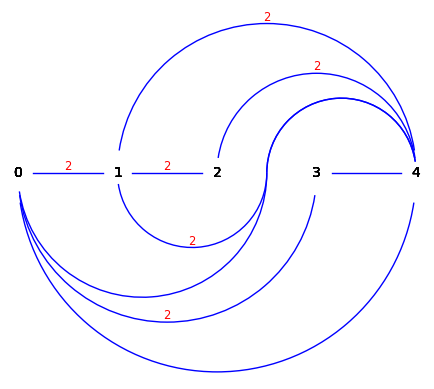

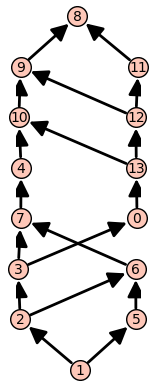

450


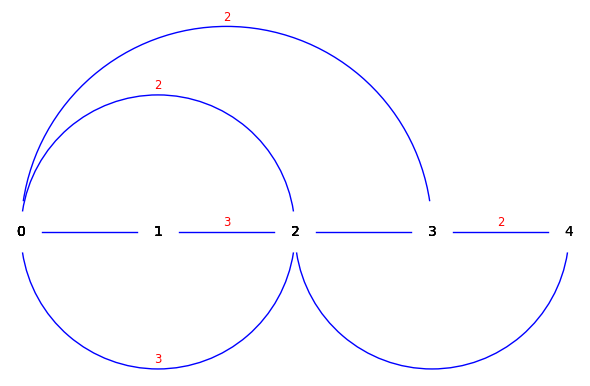

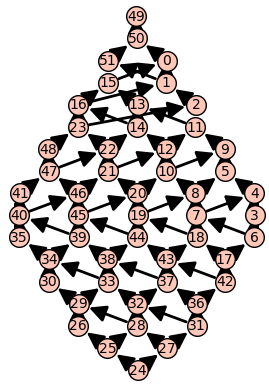

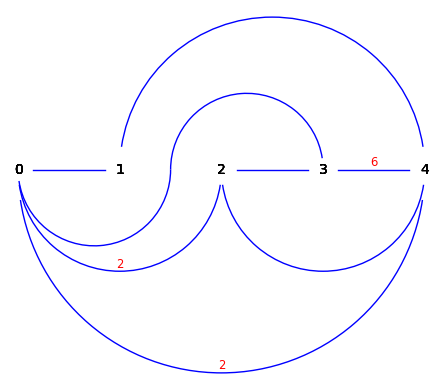

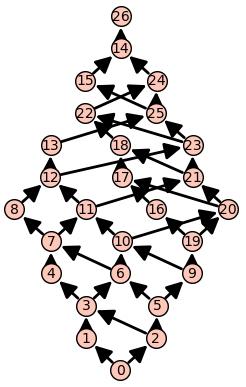

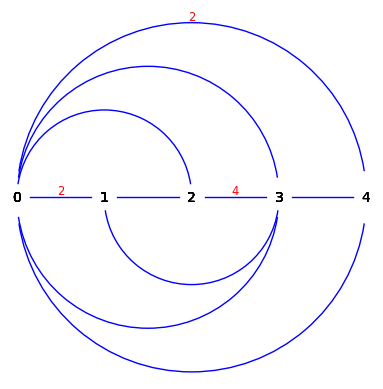

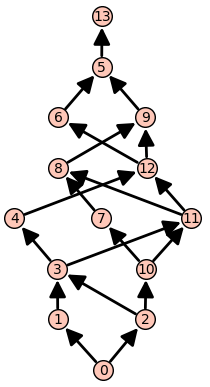

500


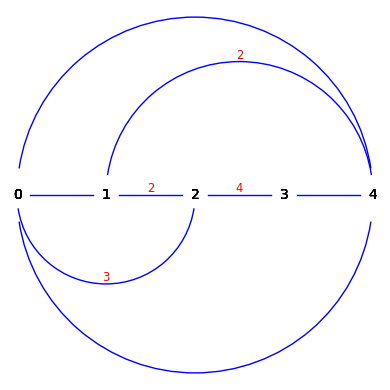

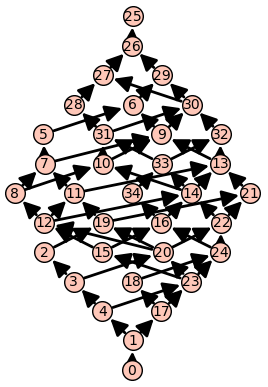

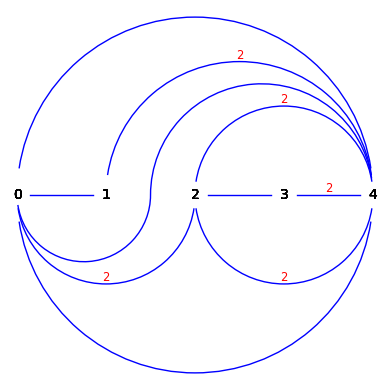

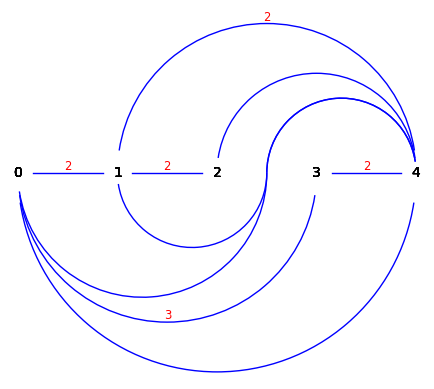

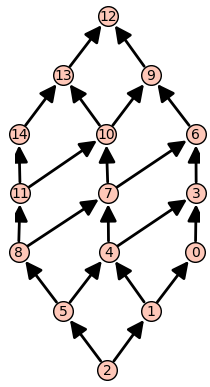

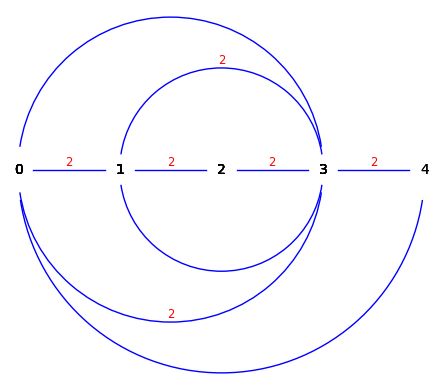

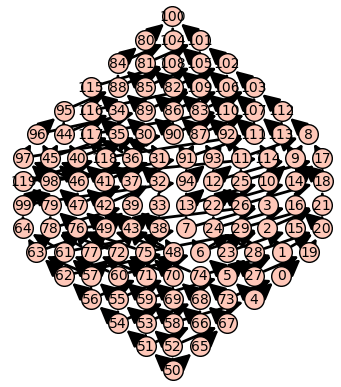

550


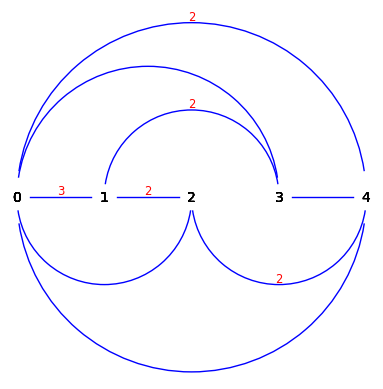

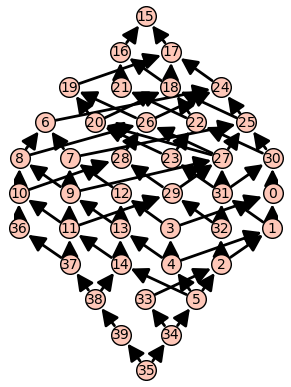

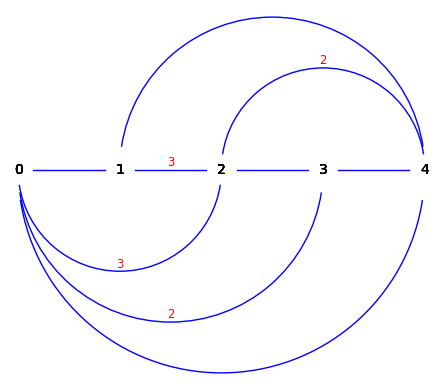

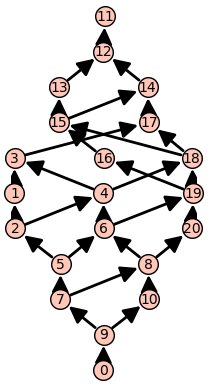

600


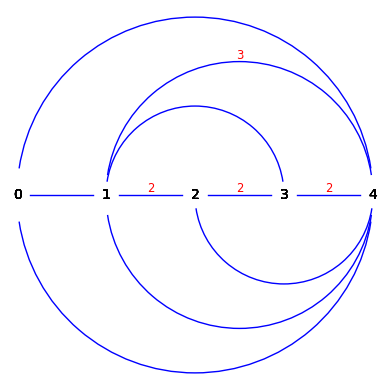

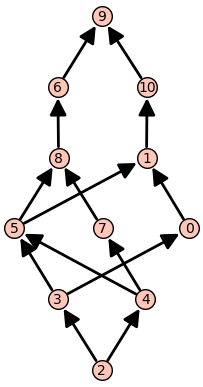

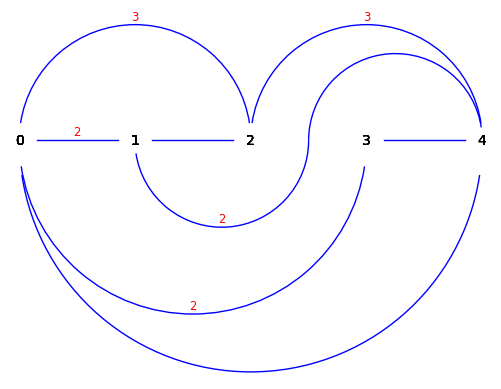

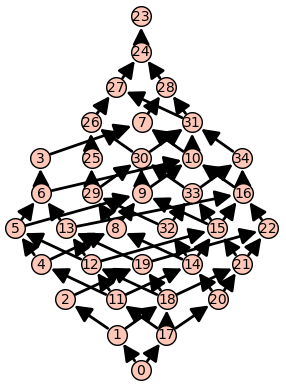

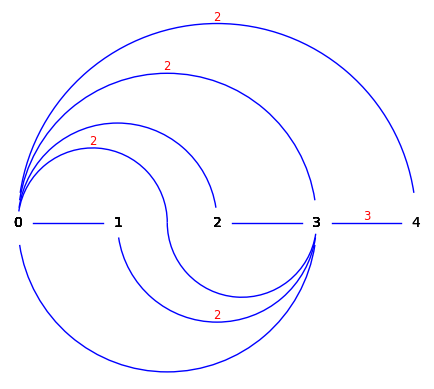

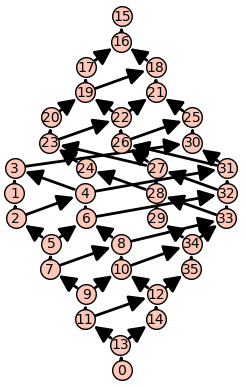

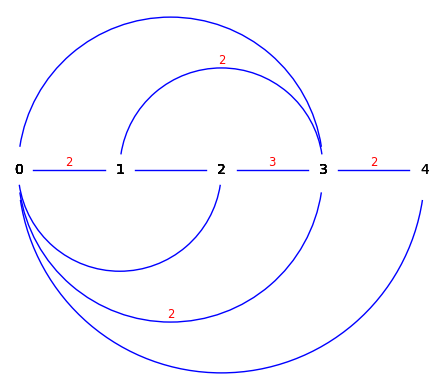

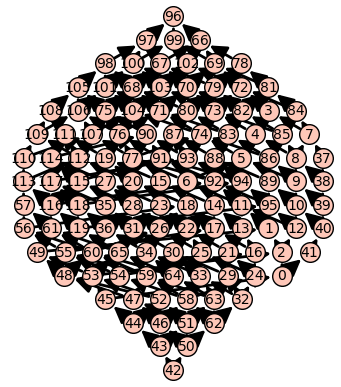

650


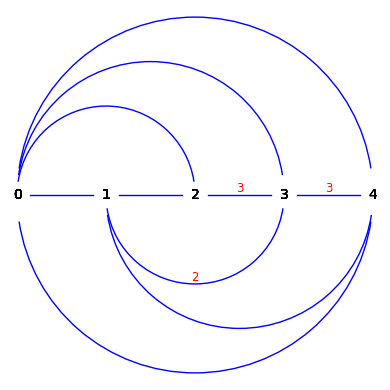

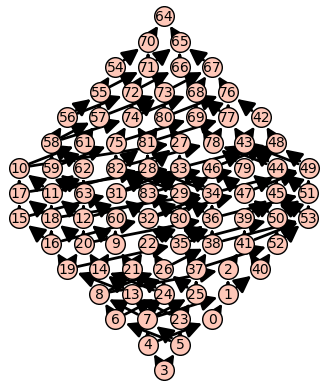

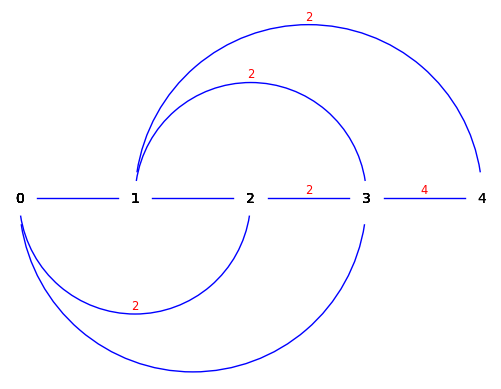

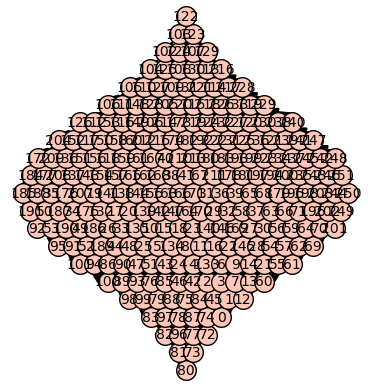

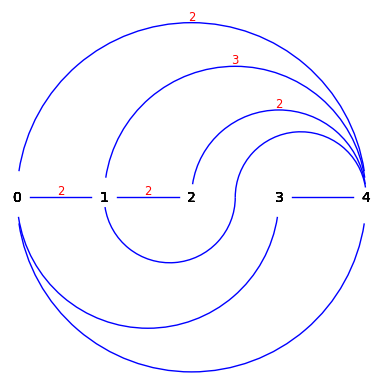

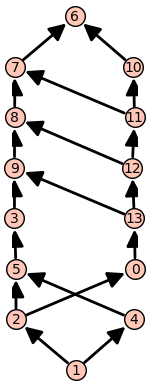

700


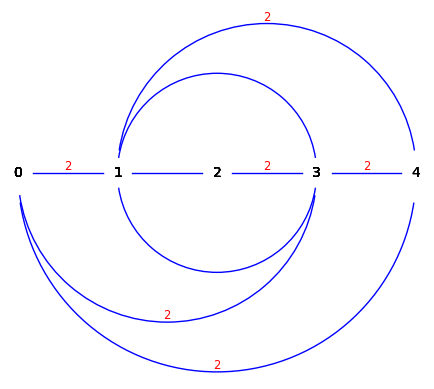

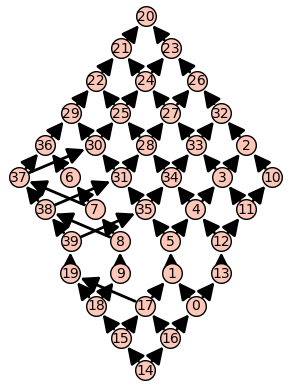

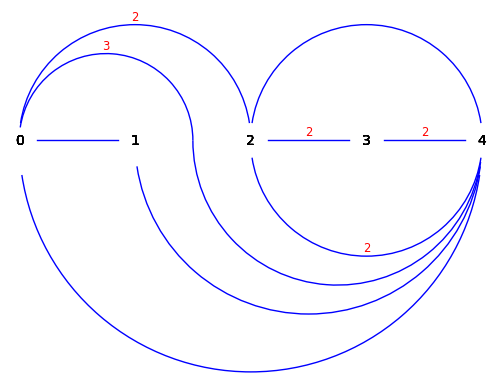

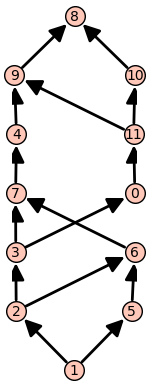

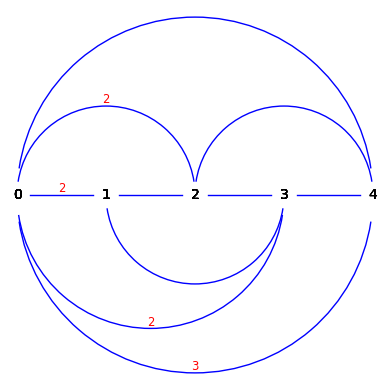

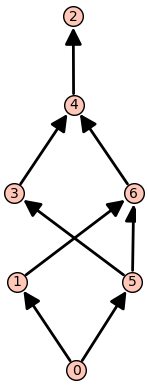

750


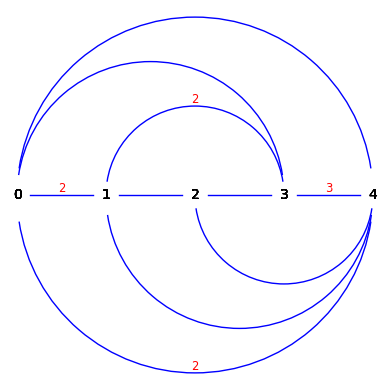

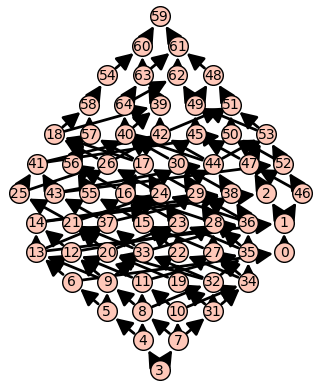

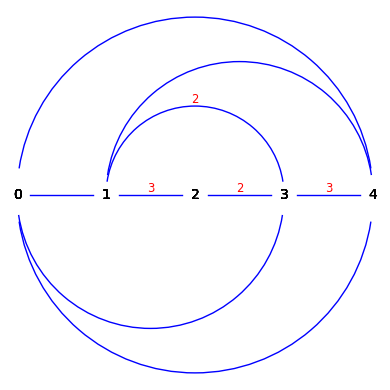

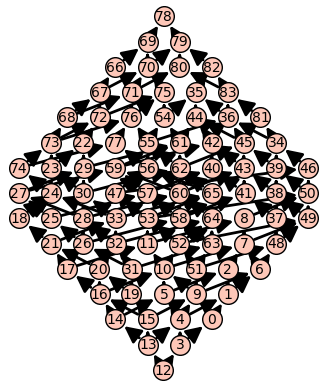

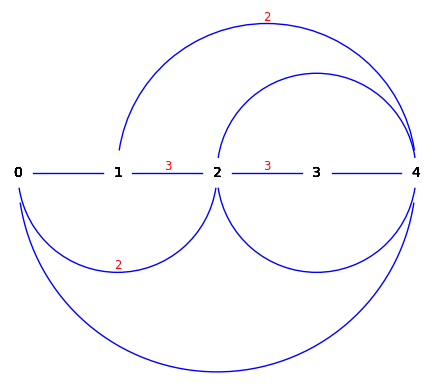

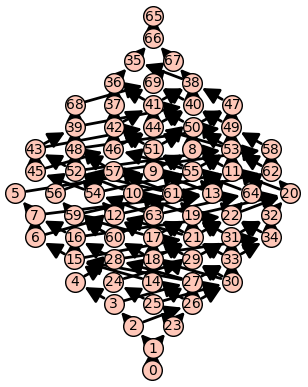

800


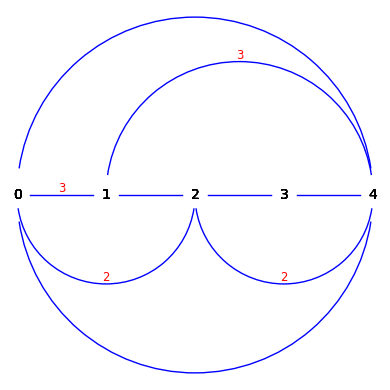

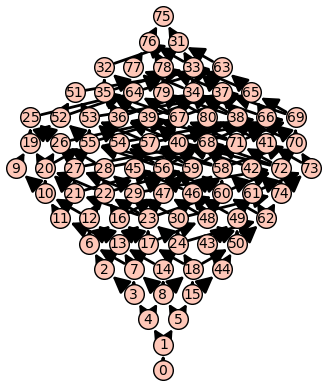

850


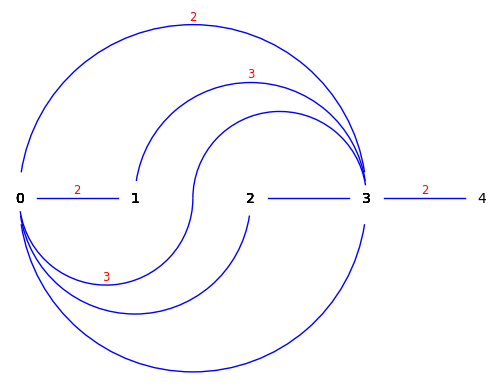

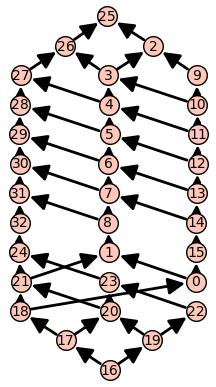

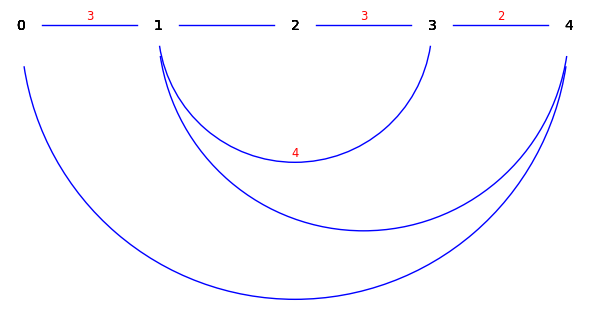

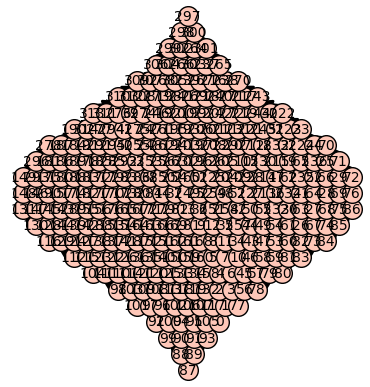

900


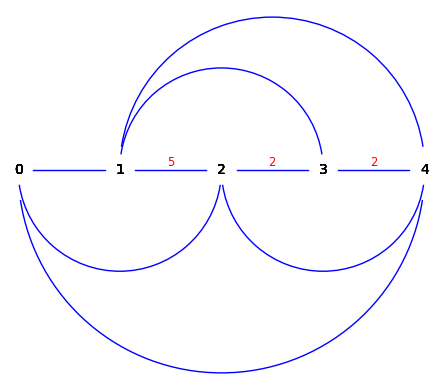

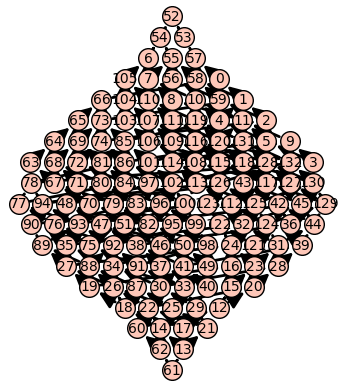

950


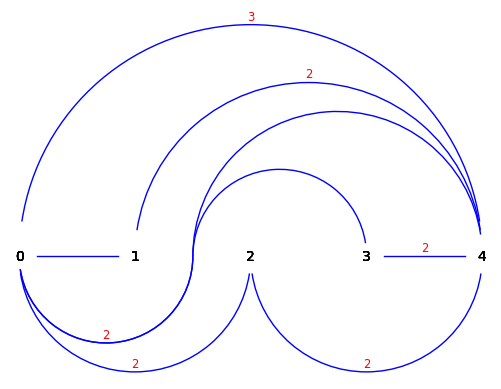

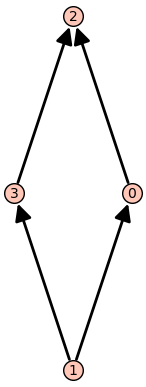

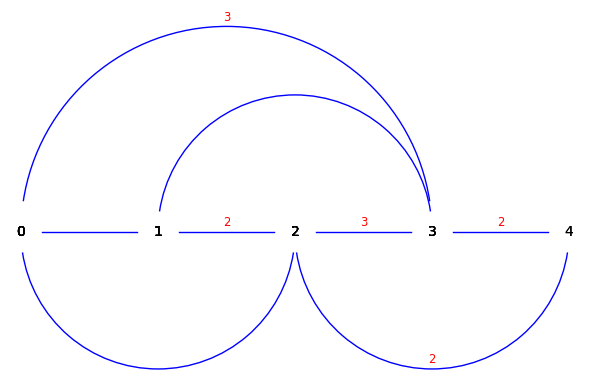

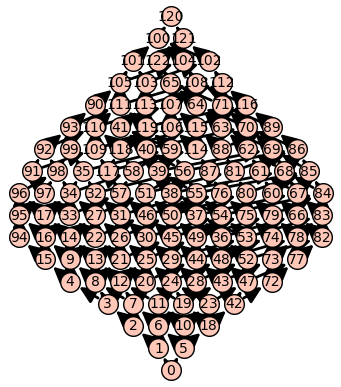

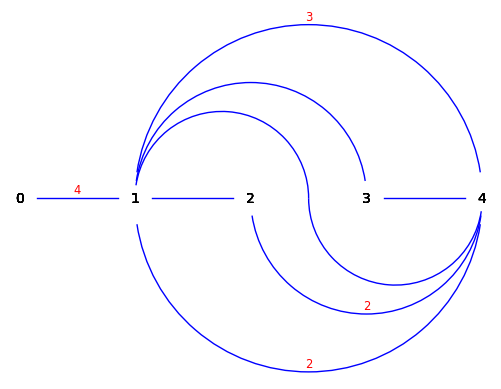

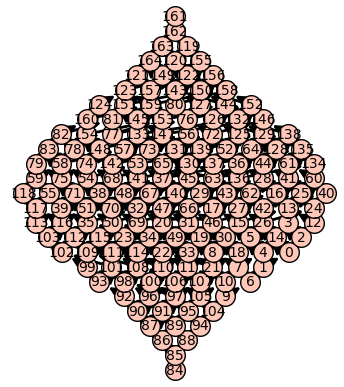

74


In [268]:
n = 5
m = 15

PoPo = []
for k in range(1000):
    if k%50 == 0:
        print(k)
    Alpha = random_non_crossing_arc_diagram(n, m)
    D, F = digraph_and_framing_on_non_crossing_arc_diagram(Alpha, check = True)
    if D != None:
        Po = framing_lattice(D, F)
        if all(not Po.is_isomorphic(Q) for Q in PoPo):
            draw_arc_diagram(Alpha).show(axes=False)
            Po.show()
            PoPo.append(Po)
print(len(PoPo))

In [269]:
len(PoPo)

74

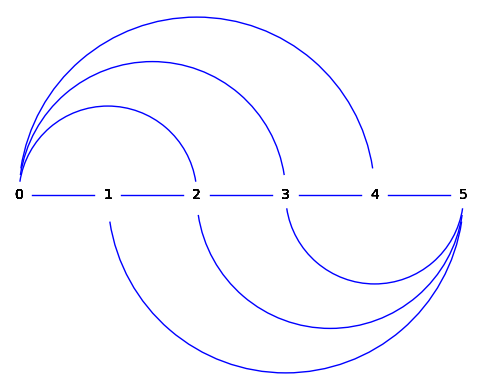

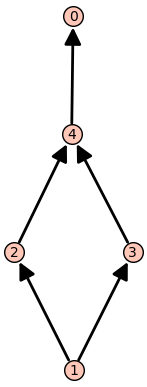

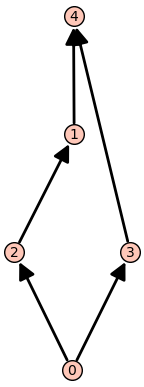

In [10]:
n = 6
Alpha = caracol(n)
draw_arc_diagram(Alpha).show(axes=False)

D, F = caracol_framed(n)
G = framing_lattice(D, F)
G.show()

D, F = caracol_framed(n, 'associahedron')
G = framing_lattice(D, F)
G.show()

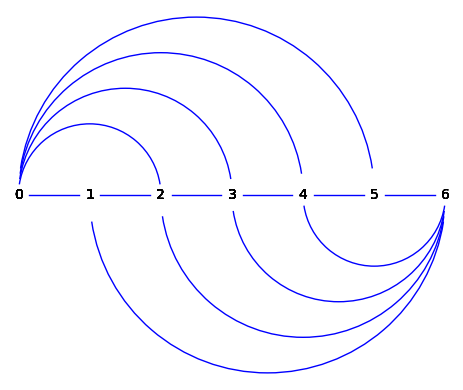

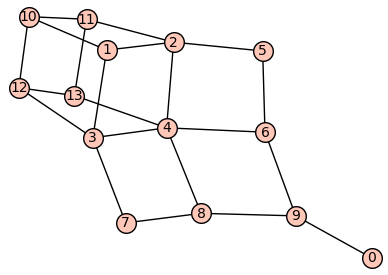

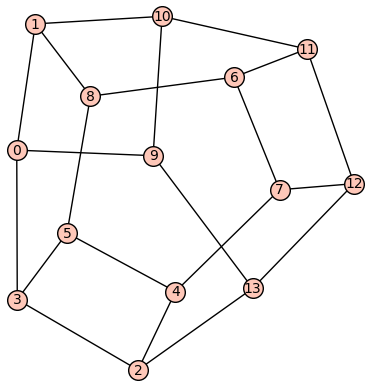

In [12]:
n = 7
Alpha = caracol(n)
draw_arc_diagram(Alpha).show(axes=False)

D, F = caracol_framed(n)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()

D, F = caracol_framed(n, 'associahedron')
G = dual_graph_of_cliques_of_routes(D, F)
G.show()

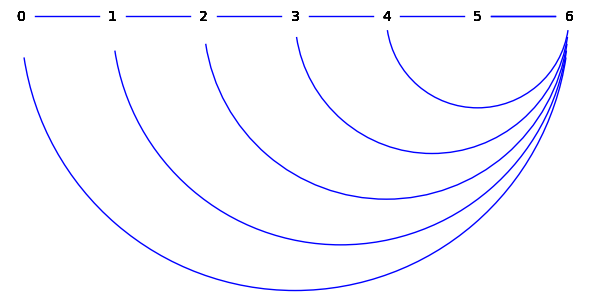

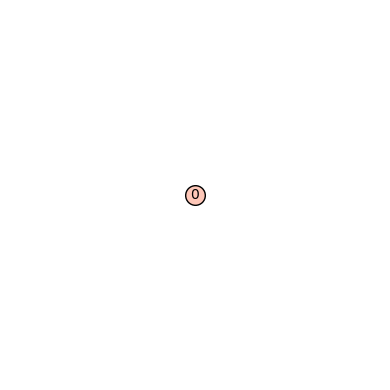

In [16]:
n = 7

Alpha = Pitman_Stanley(n)
#print(Alpha)
draw_arc_diagram(Alpha).show(axes=False)

D, F = Pitman_Stanley_framed(n)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()

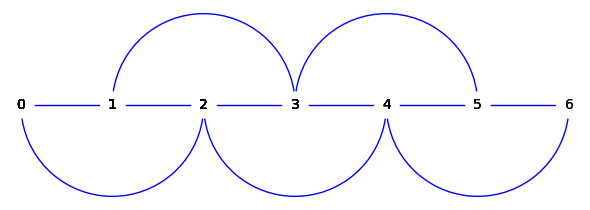

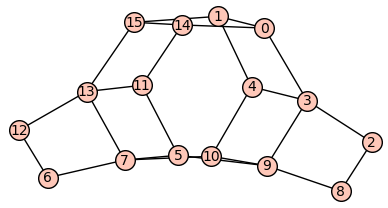

In [17]:
n = 7

Beta = zig_zag(n)
draw_arc_diagram(Beta).show(axes=False)

D, F = zig_zag_framed(n)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()

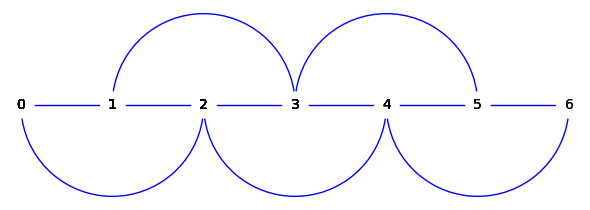

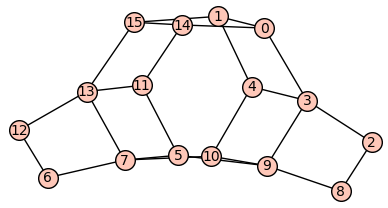

In [17]:
n = 5

Beta = zig_zag(n)
draw_arc_diagram(Beta).show(axes=False)

D, F = zig_zag_framed(n)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()

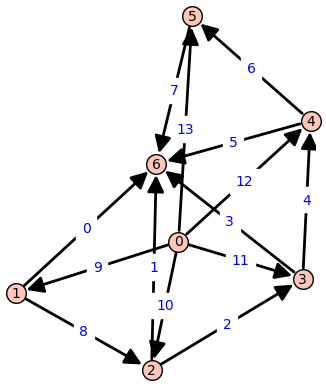

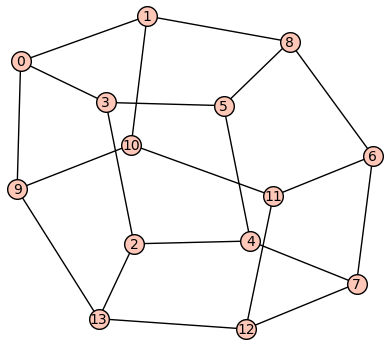

planar: True
asso 3: True
asso 4: False



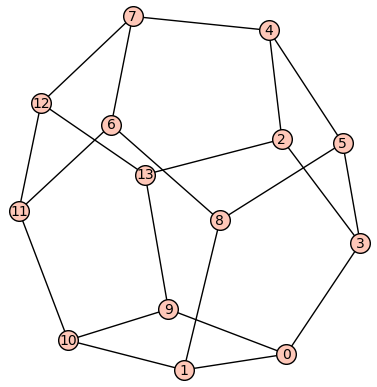

{}
planar: True
asso 3: True
asso 4: False



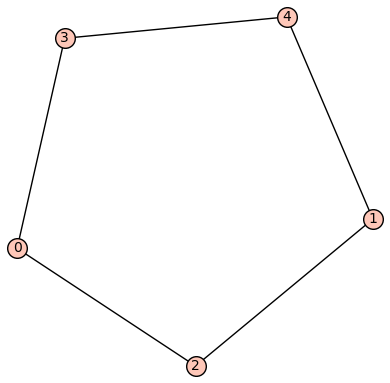

{(0, 2, 10)}
planar: True
asso 3: False
asso 4: False



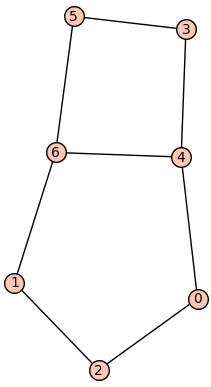

{(0, 3, 11)}
planar: True
asso 3: False
asso 4: False



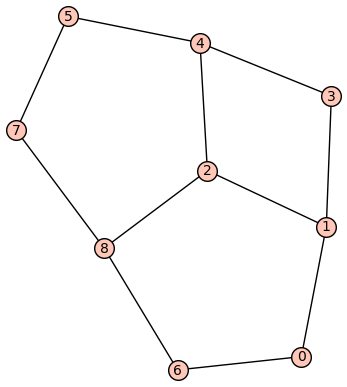

{(0, 4, 12)}
planar: True
asso 3: False
asso 4: False



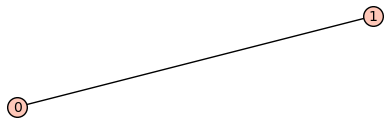

{(2, 3, 2)}
planar: True
asso 3: False
asso 4: False



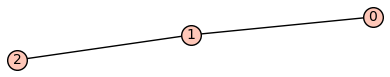

{(0, 4, 12), (0, 2, 10)}
planar: True
asso 3: False
asso 4: False



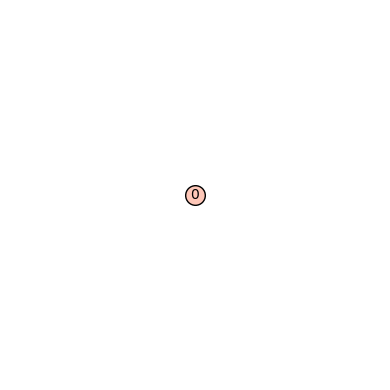

{(3, 4, 4), (0, 2, 10)}
planar: True
asso 3: False
asso 4: False



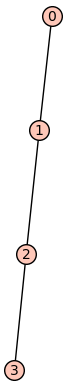

{(0, 3, 11), (0, 4, 12)}
planar: True
asso 3: False
asso 4: False



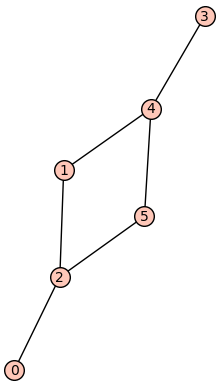

{(0, 4, 12), (2, 6, 1)}
planar: True
asso 3: False
asso 4: False



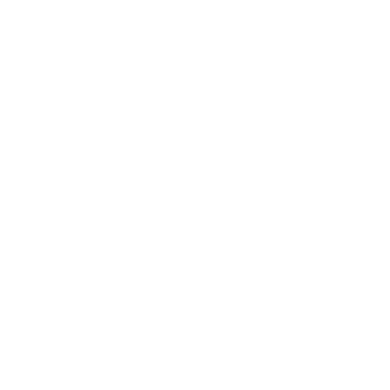

{(0, 3, 11), (0, 5, 13), (2, 6, 1), (4, 6, 5), (0, 4, 12), (3, 6, 3), (1, 6, 0), (0, 2, 10)}
planar: True
asso 3: False
asso 4: False



In [56]:
n = 7
GG = []

Alpha = caracol(n)
draw_arc_diagram(Alpha)

D, F = caracol_framed(n, 'asso')
D.show(edge_labels=True)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()
print("planar:", G.is_planar())
print("asso 3:", G.is_isomorphic(polytopes.associahedron('A3').graph()))
print("asso 4:", G.is_isomorphic(polytopes.associahedron('A4').graph()))
print()

for E in Subsets(D.edges()):
    H = DiGraph(D)
    H.delete_edges(E)
    if H.is_connected() and len(H.sources()) == 1 and len(H.sinks()) == 1:
        #print(E)
        L = [e[2] for e in H.edges()]
        L.sort()
        H = DiGraph([(e[0], e[1], L.index(e[2])) for e in H.edges()])
        FH = []
        for f in F:
            t = ([], [])
            for x in f[0]:
                if x in L:
                    t[0].append(L.index(x))
            for y in f[1]:
                if y in L:
                    t[1].append(L.index(y))
            FH.append(t)
        #H.show(edge_labels=True)
        #print(FH)
        G = dual_graph_of_cliques_of_routes(H, FH)
        if all(not G.is_isomorphic(g) for g in GG):
            G.show()
            print(E)
            print("planar:", G.is_planar())
            print("asso 3:", G.is_isomorphic(polytopes.associahedron('A3').graph()))
            print("asso 4:", G.is_isomorphic(polytopes.associahedron('A4').graph()))
            print()
            GG.append(Graph(G))


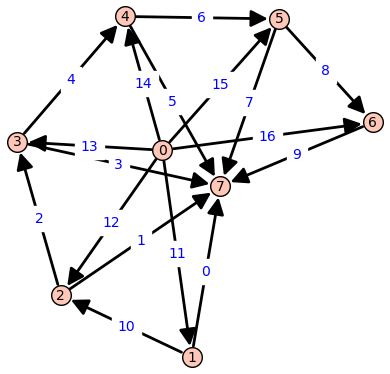

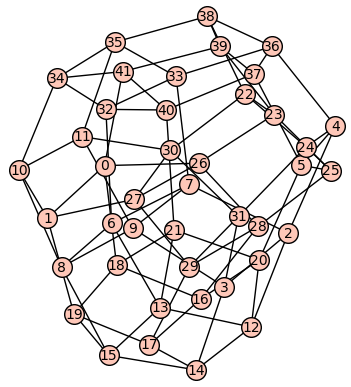

planar: False
asso 3: False
asso 4: True



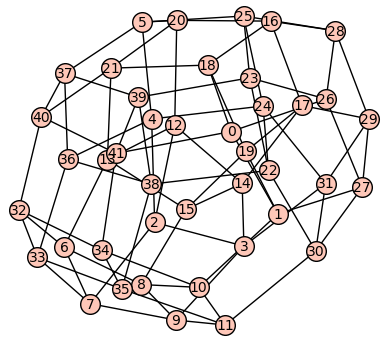

{}
planar: False
asso 3: False
asso 4: True



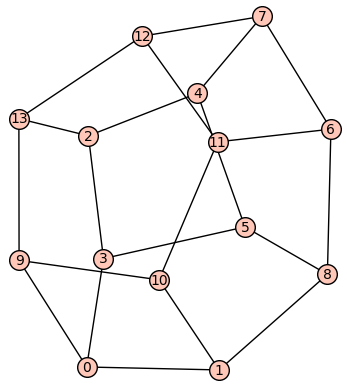

{(0, 2, 12)}
planar: True
asso 3: True
asso 4: False



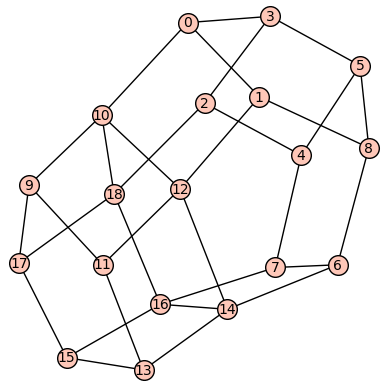

{(0, 3, 13)}
planar: True
asso 3: False
asso 4: False



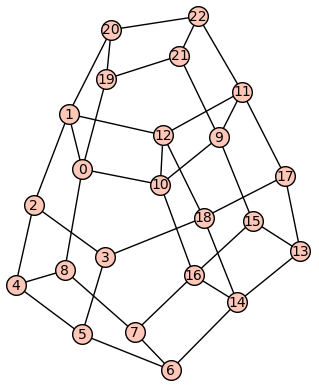

{(0, 4, 14)}
planar: False
asso 3: False
asso 4: False



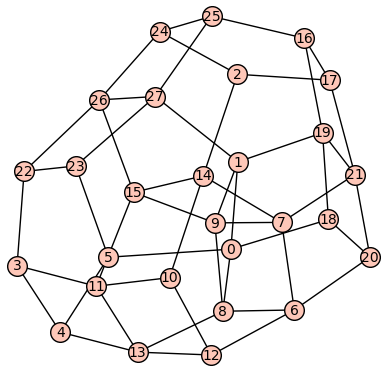

{(0, 5, 15)}
planar: False
asso 3: False
asso 4: False



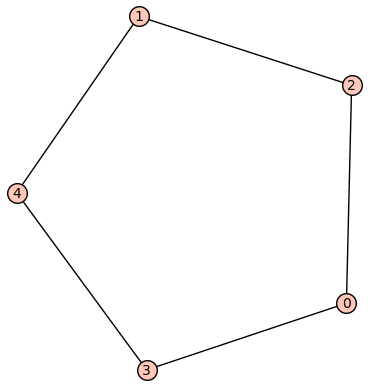

{(2, 3, 2)}
planar: True
asso 3: False
asso 4: False



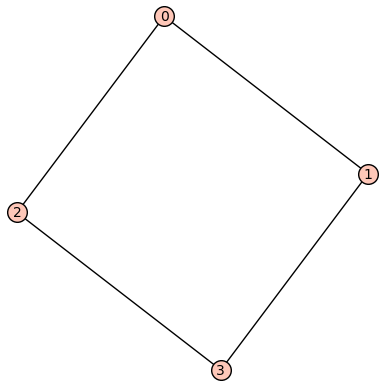

{(3, 4, 4)}
planar: True
asso 3: False
asso 4: False



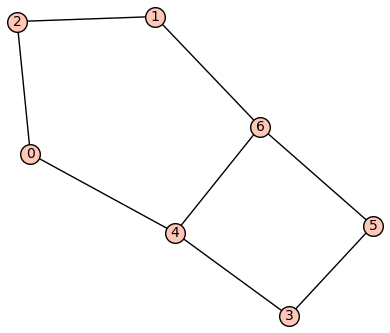

{(0, 4, 14), (0, 2, 12)}
planar: True
asso 3: False
asso 4: False



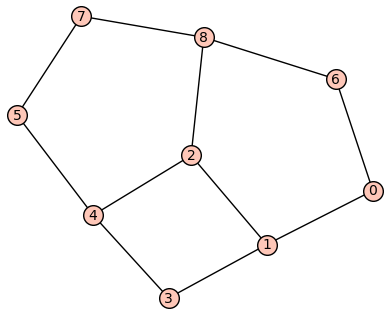

{(0, 2, 12), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



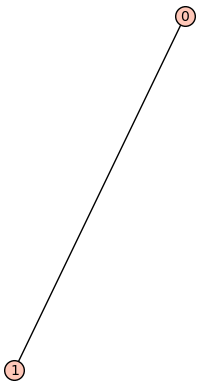

{(3, 4, 4), (0, 2, 12)}
planar: True
asso 3: False
asso 4: False



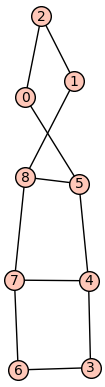

{(0, 3, 13), (0, 4, 14)}
planar: True
asso 3: False
asso 4: False



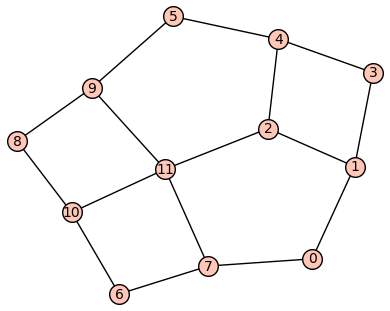

{(0, 3, 13), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



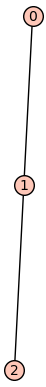

{(0, 3, 13), (4, 5, 6)}
planar: True
asso 3: False
asso 4: False



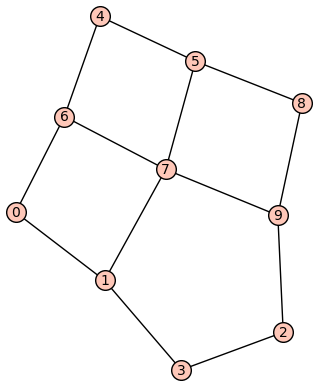

{(4, 7, 5), (0, 3, 13)}
planar: True
asso 3: False
asso 4: False



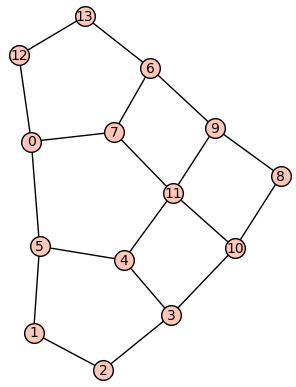

{(0, 4, 14), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



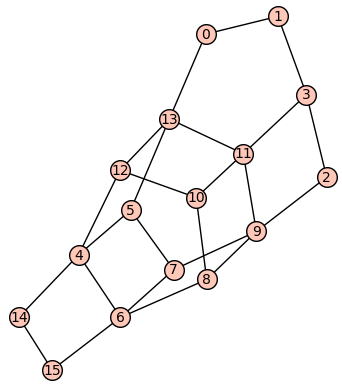

{(2, 7, 1), (0, 4, 14)}
planar: True
asso 3: False
asso 4: False



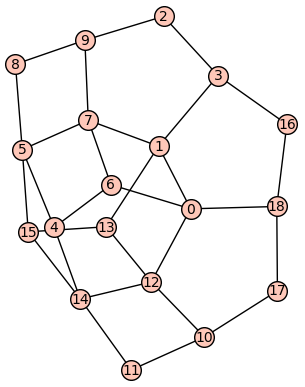

{(2, 7, 1), (0, 5, 15)}
planar: False
asso 3: False
asso 4: False



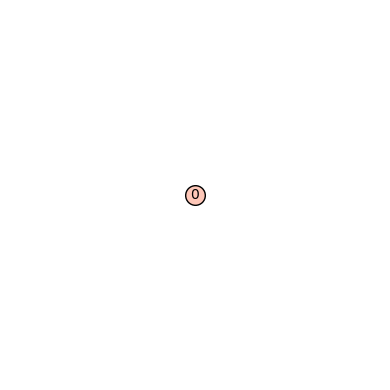

{(4, 5, 6), (2, 3, 2)}
planar: True
asso 3: False
asso 4: False



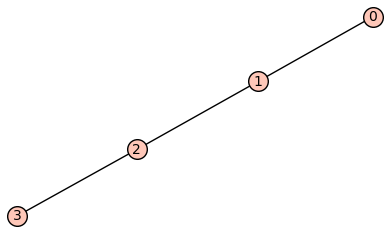

{(0, 4, 14), (0, 2, 12), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



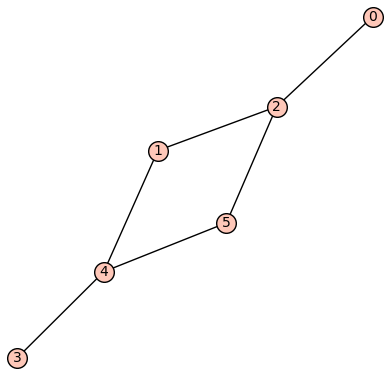

{(3, 7, 3), (0, 2, 12), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



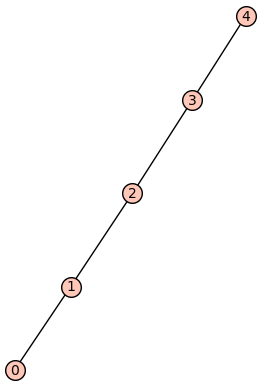

{(0, 3, 13), (0, 4, 14), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



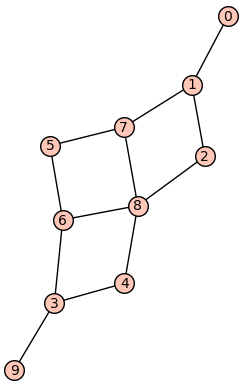

{(2, 7, 1), (0, 4, 14), (0, 5, 15)}
planar: True
asso 3: False
asso 4: False



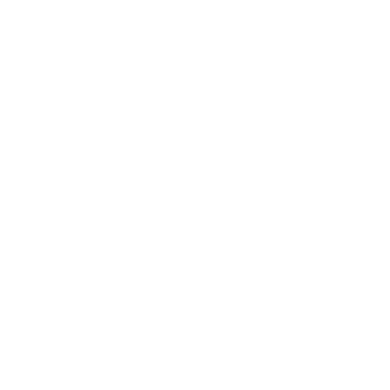

{(2, 7, 1), (4, 7, 5), (0, 4, 14), (0, 2, 12), (0, 6, 16), (1, 7, 0), (0, 3, 13), (0, 5, 15), (5, 7, 7), (3, 7, 3)}
planar: True
asso 3: False
asso 4: False



In [57]:
n = 8
GG = []

Alpha = caracol(n)
draw_arc_diagram(Alpha)

D, F = caracol_framed(n, 'asso')
D.show(edge_labels=True)
G = dual_graph_of_cliques_of_routes(D, F)
G.show()
print("planar:", G.is_planar())
print("asso 3:", G.is_isomorphic(polytopes.associahedron('A3').graph()))
print("asso 4:", G.is_isomorphic(polytopes.associahedron('A4').graph()))
print()

for E in Subsets(D.edges()):
    H = DiGraph(D)
    H.delete_edges(E)
    if H.is_connected() and len(H.sources()) == 1 and len(H.sinks()) == 1:
        #print(E)
        L = [e[2] for e in H.edges()]
        L.sort()
        H = DiGraph([(e[0], e[1], L.index(e[2])) for e in H.edges()])
        FH = []
        for f in F:
            t = ([], [])
            for x in f[0]:
                if x in L:
                    t[0].append(L.index(x))
            for y in f[1]:
                if y in L:
                    t[1].append(L.index(y))
            FH.append(t)
        #H.show(edge_labels=True)
        #print(FH)
        G = dual_graph_of_cliques_of_routes(H, FH)
        if all(not G.is_isomorphic(g) for g in GG):
            G.show()
            print(E)
            print("planar:", G.is_planar())
            print("asso 3:", G.is_isomorphic(polytopes.associahedron('A3').graph()))
            print("asso 4:", G.is_isomorphic(polytopes.associahedron('A4').graph()))
            print()
            GG.append(Graph(G))


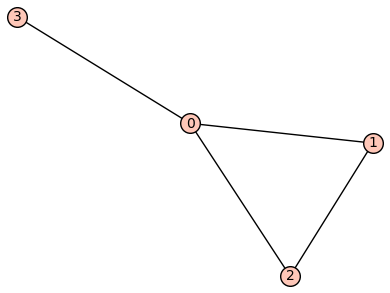

A 3-dimensional polyhedron in ZZ^3 defined as the convex hull of 18 vertices


Graphics3d Object

In [11]:
G = Graph()
G.add_clique((0, 1, 2))
G.add_edge((0, 3))
G.show()

N = graphical_associahedron(G)
print(N)
N.show()

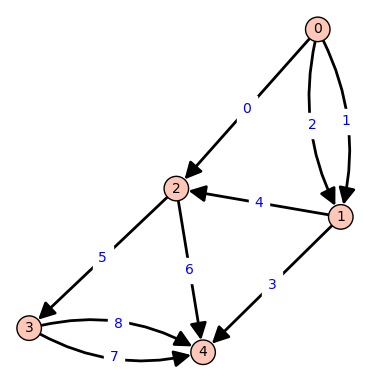

[([], [0, 1, 2]), ([1, 2], [3, 4]), ([0, 4], [5, 6]), ([5], [7, 8]), ([3, 7, 8, 6], [])]


In [55]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 2), (0, 1, 1), (0, 2, 0),
             (1, 2, 4), (1, 4, 3),
             (2, 3, 5), (2, 4, 6),
             (3, 4, 7), (3, 4, 8)])
D.show(edge_labels=True)

F = automatic_framing(D)
F[4] = ([3, 7, 8, 6], [])
print(F)

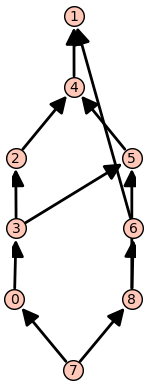

[0, 9, 11, 7, 1]


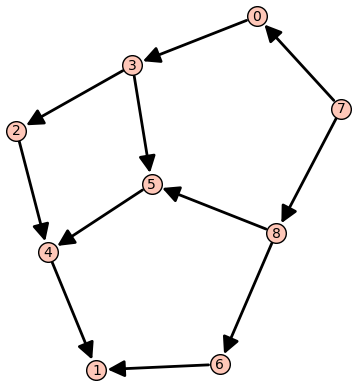

In [56]:
Po = framing_lattice(D, F)
Po.show()
G = DiGraph(Po.cover_relations())
print(linear_enumerator(G))
G.show()

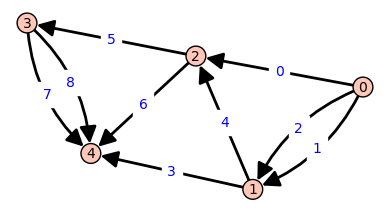

[([], [0, 1, 2]), ([1, 2], [3, 4]), ([0, 4], [6, 5]), ([5], [7, 8]), ([3, 6, 7, 8], [])]


In [43]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 2), (0, 1, 1), (0, 2, 0),
             (1, 2, 4), (1, 4, 3),
             (2, 3, 5), (2, 4, 6),
             (3, 4, 7), (3, 4, 8)])
D.show(edge_labels=True)

F = automatic_framing(D)
F[4] = ([3, 6, 7, 8], [])
F[2] = (F[2][0], [6, 5])
print(F)

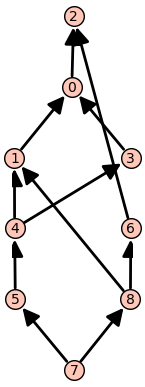

[0, 9, 11, 7, 1]


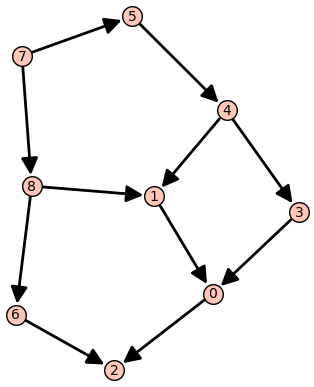

In [54]:
Po = framing_lattice(D, F)
Po.show()
G = DiGraph(Po.cover_relations())
print(linear_enumerator(G))
G.show()

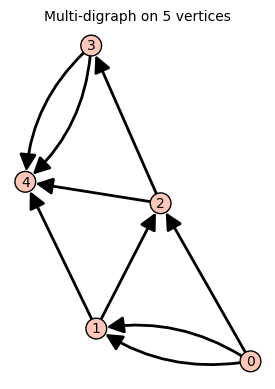

In [47]:
D

In [45]:
LI = []
PC = []

for F in all_framings_iterator(D):
    Po = framing_lattice(D, F)
    G = DiGraph(Po.cover_relations())
    li = linear_enumerator(G)
    if not li in LI:
        LI.append(list(li))
        print(li)
    pc = Po.coxeter_polynomial()    
    if not pc in PC:
        PC.append(pc)
        print(pc)

[0, 9, 11, 7, 1]
x^9 + x^8 - x^6 - x^5 - x^4 - x^3 + x + 1


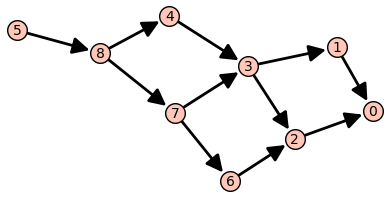

[([], [1, 2, 0]), ([1, 2], [4, 3]), ([0, 4], [5, 6]), ([5], [8, 7]), ([3, 6, 8, 7], [])]


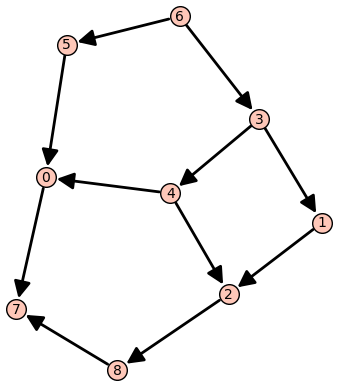

[([], [1, 2, 0]), ([1, 2], [4, 3]), ([4, 0], [5, 6]), ([5], [8, 7]), ([3, 6, 8, 7], [])]


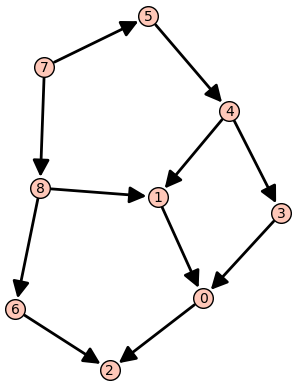

[([], [1, 2, 0]), ([1, 2], [3, 4]), ([0, 4], [5, 6]), ([5], [8, 7]), ([3, 6, 8, 7], [])]


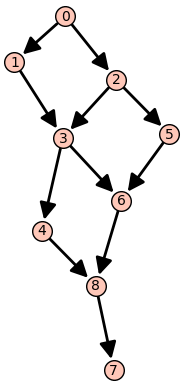

[([], [1, 2, 0]), ([1, 2], [3, 4]), ([4, 0], [5, 6]), ([5], [8, 7]), ([3, 6, 8, 7], [])]


In [108]:
PoPo = []

for F in all_framings_iterator(D):
    Po = framing_lattice(D, F)
    if all(not Po.is_isomorphic(Q) for Q in PoPo):
        DiGraph(Po.cover_relations()).show()
        print(F)
        PoPo.append(Poset(Po))

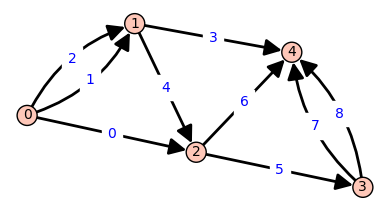

In [121]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 2), (0, 1, 1), (0, 2, 0),
             (1, 2, 4), (1, 4, 3),
             (2, 3, 5), (2, 4, 6),
             (3, 4, 7), (3, 4, 8)])
D.show(edge_labels=True)

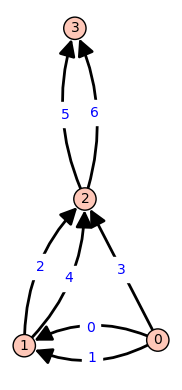

In [14]:
D = DiGraph()
D.allow_multiple_edges(True)
D.add_edges([(0, 1, 0), (0, 1, 1), (0, 2, 3), 
            (1, 2, 2), (1, 2, 4),
            (2, 3, 5), (2, 3, 6)])
D.show(edge_labels=True)

In [13]:
test_Clement_conjecture(D)

True

In [57]:
CC = list(cliques_of_routes_iterator(D, F))

k = 0
for C in CC:
    if [2, 3, 5, 6] in [R[0] for R in C]:
        print(k, [R[0] for R in C])
    k += 1
    
print()

print(4, [R[0] for R in CC[4]])
print(17, [R[0] for R in CC[17]])
print(21, [R[0] for R in CC[21]])

3 [[0, 5, 6], [0, 4, 6], [2, 3, 5, 7], [2, 3, 5, 6], [2, 3, 5, 8], [1, 3, 5, 6]]
4 [[0, 4, 6], [2, 3, 5, 7], [2, 3, 5, 6], [2, 3, 5, 8], [1, 3, 5, 6], [1, 3, 4, 6]]
5 [[0, 4, 6], [2, 3, 5, 7], [2, 3, 5, 6], [2, 3, 5, 8], [1, 3, 4, 6], [2, 3, 4, 6]]

4 [[0, 4, 6], [2, 3, 5, 7], [2, 3, 5, 6], [2, 3, 5, 8], [1, 3, 5, 6], [1, 3, 4, 6]]
17 [[0, 4, 6], [1, 3, 5, 7], [2, 3, 5, 7], [2, 3, 5, 8], [1, 3, 5, 6], [1, 3, 4, 6]]
21 [[0, 4, 6], [1, 3, 5, 7], [2, 3, 5, 7], [2, 3, 5, 8], [1, 3, 4, 7], [1, 3, 4, 6]]
